# Project multiome (15W_Esophagus updated cellranger) with ArchR
This notebook documents the analysis steps for single nuclie ATAC-seq dataset. We will use [ArchR](https://www.archrproject.com), a tool from Greenleaf lab to analyze this dataset.

__Researcher:__ Syed Murtuza Baker & Andrew Sharrocks <br>
__PI:__ Andrew Sharrocks <br>
__Analyst:__ Syed Murtuza Baker <br>


## Project Description

## Required files

- The Raw data (filtered_tf_bc_matrix.h5)
- The Metadata (singlecell.csv)
- The fragments file (fragments.tsv.gz)
- The fragments file index (fragments.tsv.gz.tbi)

# 1. Getting setup

The first thing we do is change to our desired our working directory, set the number of threads we would like to use, and load our **gene** and **genome** annotations. Depending on the configuration of your local environment, you may need to modify the number of threads used below in `addArchRThreads()`. By default ArchR uses **half** of the total number of threads available but you can adjust this manually as you see fit. 

First, we load the ArchR library.

In [2]:
library(ArchR)
library(tidyverse)
library(HDF5Array)
library(hdf5r)
library(Seurat)

library(AnnotationHub)
library(bluster)      # approxSilhouette, clusterRows, HclustParam, NNGraphParam, mergeCommunities
library(cowplot)      # plotColData, plotRowData, plot_grid
library(DropletUtils) # read10xCounts, emptyDrops, ambientProfileEmpty
library(enrichR)
library(ggbeeswarm)   # geom_quasirandom
library(ggforce)      # gather_set_data
library(ggplot2)
library(ggrepel)      # geom_text_repel
library(HDF5Array)    # saveHDF5SummarizedExperiment
library(igraph)       # cluster_walktrap
library(KernSmooth)   # smoothScatter
library(scales)
library(scater)
library(scran)
library(SingleR)
library(viridis)      # scale_color_viridis
library(scDblFinder)

In [3]:
sessionInfo()

R version 4.2.3 (2023-03-15)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.6 LTS

Matrix products: default
BLAS/LAPACK: /home/mqbsxsm2/mambaforge/envs/r4/lib/libopenblasp-r0.3.21.so

locale:
 [1] LC_CTYPE=en_GB.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_GB.UTF-8        LC_COLLATE=en_GB.UTF-8    
 [5] LC_MONETARY=en_GB.UTF-8    LC_MESSAGES=en_GB.UTF-8   
 [7] LC_PAPER=en_GB.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_GB.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats4    grid      stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] scDblFinder_1.12.0          viridis_0.6.3              
 [3] viridisLite_0.4.2           SingleR_2.0.0              
 [5] scran_1.26.2                scater_1.26.1              
 [7] scuttle_1.8.4               scales_1.2.1               
 [9] KernSmooth_2.23-22          igrap

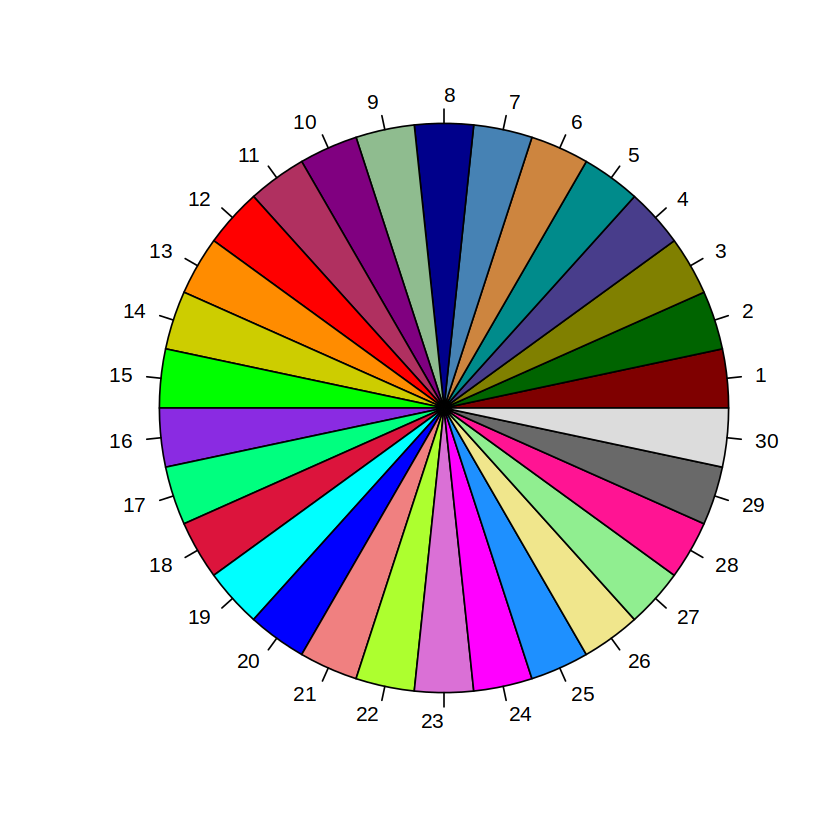

In [4]:
#cbPalette <- paletteer_d(package = "ggthemes", palette="calc", n=12)
c30 <- c(
        "#7f0000", # maroon2
        "#006400", # darkgreen
        "#808000", # olive
        "#483d8b", # darkslateblue
        "#008b8b", # darkcyan
        "#cd853f", # peru
        "#4682b4", # steelblue
        "#00008b", # darkblue
        "#8fbc8f", # darkseagreen
        "#800080", # purple
        "#b03060", # maroon3
        "#ff0000", # red
        "#ff8c00", # darkorange
        "#cdcd00", # yellow3
        "#00ff00", # lime
        "#8a2be2", # blueviolet
        "#00ff7f", # springgreen
        "#dc143c", # crimson
        "#00ffff", # aqua
        "#0000ff", # blue
        "#f08080", # lightcoral
        "#adff2f", # greenyellow
        "#da70d6", # orchid
        "#ff00ff", # fuchsia
        "#1e90ff", # dodgerblue
        "#f0e68c", # khaki
        "#90ee90", # lightgreen
        "#ff1493", # deeppink
        "#696969", # dimgray
        "#dcdcdc"  # gainsboro
)
 
pie(rep(1,30), col = c30, radius = 1)

In [5]:
# Choosing colours for samples
c_sample_col <- c30[c(1,3,23,19,30)]
# Choosing colour for samples
c_clust_col <- c30[c(1,2,3,4,5,6,7,8,9,11,12,14,19,22,24,25)]

### Setting seed
We also set known seed to facilitate replication of operations requiring randomization.

In [6]:
set.seed(1)

### Setting thread

Next, we set the default number of threads for `ArchR` functions. This is something we will have to do during each new R session. `ArchR` recommend setting threads to **1/2** to **3/4** of the total available cores. The memory usage in `ArchR` will often scale with the number of threads used so allowing `ArchR` to use more threads will also lead to higher memory usage.

In [20]:
addArchRThreads(threads = 1)

Setting default number of Parallel threads to 1.



### Setting genome

Then, we set the genome to be used for gene and genome annotations. As above, this is something we will have to do during each new R session. Of course, this genome version must match the **genome version that was used for alignment**. For this data, we will use the `hg38` reference genome.

In [21]:
addArchRGenome("hg38")

Setting default genome to Hg38.



The precompiled version of the `hg38` genome in ArchR uses `BSgenome.Hsapiens.UCSC.hg38`, `TxDb.Hsapiens.UCSC.hg38.knownGene`, `org.Hs.eg.db`, and a blacklist that was merged using `ArchR::mergeGR()` from the `hg38 v2` blacklist regions and from mitochondrial regions that show high mappability to the `hg38` nuclear genome from Caleb Lareau and Jason Buenrostro. 

### 1.1 Creating Arrow Files

Now we will create our Arrow files which will take 10-15 minutes. For each sample, this step will:

1. Read accessible fragments from the provided input files.
2. Calculate quality control information for each cell (i.e. TSS enrichment scores and nucleosome info).
3. Filter cells based on quality control parameters.
4. Create a genome-wide TileMatrix using 500-bp bins.
5. Create a `GeneScoreMatrix` using the custom geneAnnotation that was defined when we called `addArchRGenome()`.

Before creating the Arrow files, we first need to read the valid barcode files using the function `getValidBarcodes()` 


In [22]:
inputFiles <- getInputFiles("fragment_files")[1]
names(inputFiles) <- "multiome_15W"

In [23]:
inputFiles

multiome_15W 
"fragment_files/atac_fragments.tsv.gz"

In [24]:
ArrowFiles <- createArrowFiles(
  inputFiles = inputFiles, # Path of the fragment files
  sampleNames = c('multiome_15W'), # Sample names
  #filterTSS = 4,      # Dont set this too high because you can always increase later. 
                      # The minimum numeric transcription start site (TSS) enrichment score required for a cell 
                      # to pass filtering for use in downstream analyses. Cells with a TSS enrichment score greater than or equal to filterTSS will be retained. 
                      # TSS enrichment score is a measurement of signal-to-background in ATAC-seq.
  #filterFrags = 1000, # minimum number of mapped ATAC-seq fragments required per cell to pass filtering for use in downstream analyses. 
                      #Cells containing greater than or equal to filterFrags total fragments wll be retained.
  #validBarcodes = validBarcodes, # List of valid Barcodes
  addTileMat = TRUE,  #A boolean value indicating whether to add a "Tile Matrix" to each ArrowFile. 
                      # A Tile Matrix is a counts matrix that, instead of using peaks, 
                      # uses a fixed-width sliding window of bins across the whole genome. 
                      # This matrix can be used in many downstream ArchR operations
  addGeneScoreMat = TRUE #A boolean value indicating whether to add a Gene-Score Matrix to each ArrowFile. 
                         # A Gene-Score Matrix uses ATAC-seq signal proximal to the TSS to estimate gene activity.
)

Using GeneAnnotation set by addArchRGenome(Hg38)!

Using GeneAnnotation set by addArchRGenome(Hg38)!

ArchR logging to : ArchRLogs/ArchR-createArrows-3ab04de73070-Date-2023-06-05_Time-12-54-16.log
If there is an issue, please report to github with logFile!

Cleaning Temporary Files

2023-06-05 12:54:17 : Batch Execution w/ safelapply!, 0 mins elapsed.

(multiome_15W : 1 of 1) Determining Arrow Method to use!

2023-06-05 12:54:17 : (multiome_15W : 1 of 1) Reading In Fragments from inputFiles (readMethod = tabix), 0 mins elapsed.

2023-06-05 12:54:17 : (multiome_15W : 1 of 1) Tabix Bed To Temporary File, 0.001 mins elapsed.

Warning message in sprintf("%s Reading TabixFile %s Percent", prefix, round(100 * :
“one argument not used by format '%s Reading TabixFile %s Percent'”
2023-06-05 12:55:12 : (multiome_15W : 1 of 1) Reading TabixFile 8 Percent, 0.924 mins elapsed.

Warning message in sprintf("%s Reading TabixFile %s Percent", prefix, round(100 * :
“one argument not used by format '%s 

In [25]:
Aoib_w15_proj_multiome<- ArchRProject(
  ArrowFiles = ArrowFiles, 
  outputDirectory = "multiome_15W",
  showLogo = FALSE,
  copyArrows = TRUE #This is recommened so that you maintain an unaltered copy for later usage.
)

Using GeneAnnotation set by addArchRGenome(Hg38)!

Using GeneAnnotation set by addArchRGenome(Hg38)!

Validating Arrows...

Getting SampleNames...

1 


Copying ArrowFiles to Ouptut Directory! If you want to save disk space set copyArrows = FALSE

1 


Getting Cell Metadata...

1 


Merging Cell Metadata...

Initializing ArchRProject...



In [26]:
Aoib_w15_proj_multiome


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W 
samples(1): multiome_15W
sampleColData names(1): ArrowFiles
cellColData names(13): Sample TSSEnrichment ... nDiFrags BlacklistRatio
numberOfCells(1): 1465
medianTSS(1): 9.855
medianFrags(1): 18440

## Inputing GEX

In [27]:
seRNA <- import10xFeatureMatrix(
    input = c("filtered_feature_bc_matrix.h5"),
    names = c("multiome_15W")
)

Importing Feature Matrix 1 of 1

Re-ordering RNA matricies for consistency.



In [28]:
seRNA

class: RangedSummarizedExperiment 
dim: 36578 1656 
metadata(0):
assays(1): counts
rownames(36578): MIR1302-2HG FAM138A ... AC007325.4 AC007325.2
rowData names(5): feature_type genome id interval name
colnames(1656): multiome_15W#AAACATGCACTGGCTG-1
  multiome_15W#AAACCGAAGTGAACGA-1 ... multiome_15W#TTTGTGTTCGAAGTGA-1
  multiome_15W#TTTGTTGGTTAGCAGC-1
colData names(0):

In [29]:
seRNA <- scDblFinder(seRNA)
table(seRNA$scDblFinder.class)

Warning message in .checkSCE(sce):
“Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out”
Creating ~5000 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 153 cells excluded from training.

iter=1, 198 cells excluded from training.

iter=2, 216 cells excluded from training.

Threshold found:0.959

96 (5.8%) doublets called




singlet doublet 
   1560      96 

In [30]:
seRNA

class: SingleCellExperiment 
dim: 36578 1656 
metadata(0):
assays(1): counts
rownames(36578): MIR1302-2HG FAM138A ... AC007325.4 AC007325.2
rowData names(6): feature_type genome ... name scDblFinder.selected
colnames(1656): multiome_15W#AAACATGCACTGGCTG-1
  multiome_15W#AAACCGAAGTGAACGA-1 ... multiome_15W#TTTGTGTTCGAAGTGA-1
  multiome_15W#TTTGTTGGTTAGCAGC-1
colData names(4): scDblFinder.class scDblFinder.score
  scDblFinder.weighted scDblFinder.cxds_score
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

## Remove doublets

In [31]:
seRNA <- seRNA[,seRNA$scDblFinder.class %in% 'singlet']

In [32]:
seRNA

class: SingleCellExperiment 
dim: 36578 1560 
metadata(0):
assays(1): counts
rownames(36578): MIR1302-2HG FAM138A ... AC007325.4 AC007325.2
rowData names(6): feature_type genome ... name scDblFinder.selected
colnames(1560): multiome_15W#AAACATGCACTGGCTG-1
  multiome_15W#AAACCGAAGTGAACGA-1 ... multiome_15W#TTTGTGTTCGAAGTGA-1
  multiome_15W#TTTGTTGGTTAGCAGC-1
colData names(4): scDblFinder.class scDblFinder.score
  scDblFinder.weighted scDblFinder.cxds_score
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

__Add single nuclei RNA-seq value__

In [33]:
#Add scRNA
Aoib_w15_proj_multiome <- addGeneExpressionMatrix(input = Aoib_w15_proj_multiome, seRNA = seRNA, force = TRUE)

ArchR logging to : ArchRLogs/ArchR-addGeneExpressionMatrix-3ab0408ffc0a-Date-2023-06-05_Time-13-10-23.log
If there is an issue, please report to github with logFile!

Overlap w/ scATAC = 0.868

2023-06-05 13:10:23 : 

Warning! Not all cells in input exist in seRNA! This may cause downstream issues with functions that require information from all cells. For example, addIterativeLSI() will not work on this GeneExpressionMatrix! To remove these mis-matched cells, subset your ArchRProject using the subsetArchRProject() function to contain only cells present in seRNA and set 'strictMatch = TRUE'

2023-06-05 13:10:23 : 

Overlap Per Sample w/ scATAC : multiome_15W=1272

2023-06-05 13:10:23 : 

2023-06-05 13:10:24 : Batch Execution w/ safelapply!, 0 mins elapsed.

2023-06-05 13:10:25 : Adding multiome_15W to GeneExpressionMatrix for Chr (1 of 23)!, 0.015 mins elapsed.

2023-06-05 13:10:28 : Adding multiome_15W to GeneExpressionMatrix for Chr (2 of 23)!, 0.055 mins elapsed.

2023-06-05 13:10:3

## Filter cells that matches the RNA-seq

In [34]:
Aoib_w15_proj_multiome <- Aoib_w15_proj_multiome[!is.na(Aoib_w15_proj_multiome$Gex_nUMI)]

In [35]:
Aoib_w15_proj_multiome


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W 
samples(1): multiome_15W
sampleColData names(1): ArrowFiles
cellColData names(17): Sample TSSEnrichment ... Gex_MitoRatio
  Gex_RiboRatio
numberOfCells(1): 1272
medianTSS(1): 10.1805
medianFrags(1): 21940.5

## 1.2 Quality control per cell

Strict quality control (QC) of scATAC-seq data is essential to remove the contribution of low-quality cells. In `ArchR`, we consider three characteristics of data:

1. The number of unique nuclear fragments (i.e. not mapping to mitochondrial DNA).
2. The signal-to-background ratio. Low signal-to-background ratio is often attributed to dead or dying cells which have de-chromatinzed DNA which allows for random transposition genome-wide.
3. The fragment size distribution. Due to nucleosomal periodicity, we expect to see depletion of fragments that are the length of DNA wrapped around a nucleosome (approximately 147 bp).

> **Unique nuclear fragments**, is straightforward - cells with very few usable fragments will not provide enough data to make useful interpretations and should therefore be excluded.

> **Signal-to-background ratio**, is calculated as the **TSS enrichment score**. Traditional bulk ATAC-seq analysis has used this TSS enrichment score for determination of signal-to-background (for example, the [ENCODE project](https://www.encodeproject.org/atac-seq/)). The idea behind the TSS enrichment score metric is that ATAC-seq data is universally enriched at gene TSS regions compared to other genomic regions, due to large protein complexes that bind to promoters. By looking at per-basepair accessibility centered at these TSS regions, we see a local enrichment relative to flanking regions (1900-2000 bp distal in both directions). The ratio between the peak of this enrichment (centered at the TSS) relative to these flanking regions represents the TSS enrichment score.

Traditionally, the per-base-pair accessibility is computed for each bulk ATAC-seq sample and then this profile is used to determine the TSS enrichment score. Performing this operation on a per-cell basis in scATAC-seq is relatively slow and computationally expensive. To accurately approximate the TSS enrichment score per single cell, `ArchR` count the average accessibility within a 50-bp region centered at each single-base TSS position and divide this by the average accessibility of the TSS flanking positions (+/- 1900 – 2000 bp). This approximation was highly correlated (R > 0.99) with the original method and values were extremely close in magnitude.

> **Fragment size distribution**, is generally less important but always good to manually inspect. Because of the patterned way that DNA wraps around nucleosomes, we expect to see a nucleosomal periodicity in the distribution of fragment sizes in our data. These hills and valleys appear because fragments must span 0, 1, 2, etc. nucleosomes (Tn5 cannot cut DNA that is tightly wrapped around a nucleosome.

By default in ArchR, pass-filter cells are identified as those cells having a TSS enrichment score greater than 4 and more than 1000 unique nuclear fragments. It is important to note that the actual numeric value of the TSS enrichment score depends on the set of TSSs used. The default values in ArchR were designed for human data and it may be important to change the default thresholds when running createArrowFiles().

Creation of Arrow files created a folder in the current working directory called “QualityControl” which will contain 2 plots associated with each of our samples. The first plot shows the log10(unique nuclear fragments) vs TSS enrichment score and indicates the thresholds used with dotted lines. The second shows the fragment size distribution.


![](QualityControl/Week_7/Week_7-Fragment_Size_Distribution.pdf) 

## 1.3 Inferring Doublets
After Arrow file creation, we can infer potential doublets (a single droplet containing multiple cells) that can confound downstream results. This is done using the `addDoubletScores()` function.

### How does doublet identification work in ArchR?

Single-cell data generated on essentially any platform is susceptible to the presence of doublets. A doublet refers to a single droplet that received a single barcoded bead and more than one nucleus. This causes the reads from more than one cell to appear as a single cell. For 10x, the percentage of total “cells” that are actually doublets is proportional to the number of cells loaded into the reaction. Even at the lower levels of doublets that result from standard kit use, more than 5% of the data may come from doublets and this exerts substantial effects on clustering. This issue becomes particularly problematic in the context of developmental/trajectory data because doublets look like a mixture between two cell types and this can be confounded with intermediate cell types or cell states.

To predict which “cells” are actually doublets, we synthesize in silico doublets from the data by mixing the reads from thousands of combinations of individual cells. We then project these synthetic doublets into the UMAP embedding and identify their nearest neighbor. By iterating this procedure thousands of times, we can identify “cells” in our data whose signal looks very similar to synthetic doublets.

<img src="documentFigures/doubletRemoval.png" width="50%">

In [36]:
Aoib_w15_proj_multiome <- addDoubletScores(
    input = Aoib_w15_proj_multiome,
    k = 10, #Refers to how many cells near a "pseudo-doublet" to count.
    knnMethod = "UMAP", #Refers to the embedding to use for nearest neighbor search with doublet projection.
    UMAPParams = list(n_neighbors = 20),
    LSIMethod = 1,
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-addDoubletScores-3ab07ec9710d-Date-2023-06-05_Time-14-17-08.log
If there is an issue, please report to github with logFile!

2023-06-05 14:17:08 : Batch Execution w/ safelapply!, 0 mins elapsed.

multiome_15W (1 of 1) : UMAP Projection R^2 = 0.98983

multiome_15W (1 of 1) : UMAP Projection R^2 = 0.98983

ArchR logging successful to : ArchRLogs/ArchR-addDoubletScores-3ab07ec9710d-Date-2023-06-05_Time-14-17-08.log



In [37]:
Aoib_w15_proj_multiome


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W 
samples(1): multiome_15W
sampleColData names(1): ArrowFiles
cellColData names(19): Sample TSSEnrichment ... DoubletScore
  DoubletEnrichment
numberOfCells(1): 1272
medianTSS(1): 10.1805
medianFrags(1): 21940.5

In the above output, ArchR reports the R2 value for the UMAP projection for each Arrow file. If these R2 values are much lower (i.e. less than 0.9), this often indicates that the cells within the Arrow file have very little heterogeneity. This makes the accuracy of doublet calling worse because the majority of doublets would be “homotypic” - or a single droplet with two very similar cells. In these cases, we recommend skipping doublet prediction. Alternatively, you can try setting knnMethod = "LSI" and force = TRUE to perform projection in the LSI subspace; however, you should manually assess the results and make sure this is performing as you would expect.

Adding doublet scores will create plots in the “QualityControl” directory. There are 3 plots associated with each of your samples in this folder:

1. **Doublet Enrichments** - These represent the enrichment of simulated doublets nearby each single cell compared to the expected if we assume a uniform distribution.
2. **Doublet Scores** - These represent the significance (-log10(binomial adjusted p-value)) of simulated doublets nearby each single cell compared to the expected if we assume a uniform distribution. We have found this value to be less consistent than the doublet enrichments and therefore use doublet enrichments for doublet identification.
3. **Doublet Density** - This represents the density of the simulated doublet projections. This allows you to visualize where the synthetic doublets were located after projection into your 2-dimensional embedding.

## 1.4 Creating an ArchRProject
An ArchRProject allows us to group multiple Arrow files together into a single project. This ArchRProject is small and is stored in memory. By interacting with the ArchRProject we can rapidly push and pull data from the Arrow files. As such, it forms the basis of nearly all ArchR functions and analytical workflows. Moreover, ArchRProject objects can be saved and re-loaded at a later date, providing continuity of analyses and facilitating sharing of analytical projects across collaborators. 

We can see from the above that our ArchRProject has been initialized with a few important attributes:

1. The specified outputDirectory.
2. The sampleNames of each sample which were obtained from the Arrow files.
3. A matrix called sampleColData which contains data associated with each sample.
4. A matrix called cellColData which contains data associated with each cell. Because we already computed doublet enrichment scores using addDoubletScores(), which added those values to each cell in the Arrow files, we can see columns corresponding to the “DoubletEnrichment” and “DoubletScore” in the cellColData matrix.
5. The total number of cells in our project which represents all samples after doublet identification and removal.
6. The median TSS enrichment score and the median number of fragments across all cells and all samples.

### Calculating Gene Scores in ArchR

This class of model, which is implemented as the default in ArchR, has three major components:

- Accessibility within the entire gene body contributes to the gene score.
- An exponential weighting function that accounts for the activity of putative distal regulatory elements in a distance-dependent fashion.
- Imposed gene boundaries that minimizes the contribution of unrelated regulatory elements to the gene score.

For each chromosome, `ArchR` creates a tile matrix using a user-defined tile size that is not pre-computed (default is 500 bp), overlaps these tiles with the user-defined gene window (default is 100 kb on either side of the gene), and then computes the distance from each tile (start or end) to the gene body (with optional extensions upstream or downstream) or gene start. We have found that the best predictor of gene expression is the local accessibility of the gene region which includes the promoter and gene body. As mentioned above, to properly account for distal accessibility for a given gene, `ArchR` identifies the subset of tiles that are within the gene window and do not cross another gene region. This filtering allows for inclusion of distal regulatory elements that could improve the accuracy of predicting gene expression values but excludes regulatory elements more likely to be associated with another gene (for ex. the promoter of a nearby gene). The distance from each tile to the gene is then converted to a distance weight using a user-defined accessibility model (default is $e^{-abs(distance)/5000} + e^{-1})$. When the gene body is included in the gene region (where the distance-based weight is the maximum weight possible), we found that extremely large genes can bias the overall gene scores. In these cases, the total gene scores can vary substantially due to the inclusion of insertions in both introns and exons. To help adjust for these large differences in gene size, `ArchR` applies a separate weight for the inverse of the gene size ($\frac{1}{gene size}$) and scales this inverse weight linearly from 1 to a user-defined hard maximum (default of 5). Smaller genes thus receive larger relative weights, partially normalizing this length effect. The corresponding distance and gene size weights are then multiplied by the number of Tn5 insertions within each tile and summed across all tiles within the gene window, while still accounting for nearby gene regions as described above. This summed accessibility is a “gene score” and is depth normalized across all genes to a user-defined constant (default of 10,000). Computed gene scores are then stored in the corresponding Arrow file for downstream analyses.

To illustrate what the default ArchR gene score model looks like, we provide this toy example showing the weighting applied across the entire gene region:

<img src="documentFigures/GeneActivityScore_Schematic.png" width="50%">

**Now we can filter putative doublets based on the previously determined doublet scores using the filterDoublets() function. This doesn’t physically remove data from the Arrow files but rather tells the ArchRProject to ignore these cells for downstream analysis.**

In [38]:
Aoib_w15_proj_multiome <- filterDoublets(ArchRProj = Aoib_w15_proj_multiome)

Filtering 16 cells from ArchRProject!

	multiome_15W : 16 of 1272 (1.3%)



Cells passing the QC in three samples

In [39]:
table(Aoib_w15_proj_multiome$Sample)


multiome_15W 
        1256 

In [40]:
#Jill_proj_multiome <- Jill_proj_multiome[Jill_proj_multiome$TSSEnrichment > 6 & 
#                                               Jill_proj_multiome$nFrags > 2500]

In [41]:
p1 <- plotGroups(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "TSSEnrichment",
    plotAs = "ridges"
   )

p2 <- plotGroups(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "ReadsInTSS",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )

p3 <- plotGroups(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "ReadsInPromoter",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )

p4 <- plotGroups(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "ReadsInBlacklist",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )
p5 <- plotGroups(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "PromoterRatio",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )

1 


1 


1 


1 


1 




Picking joint bandwidth of 0.728



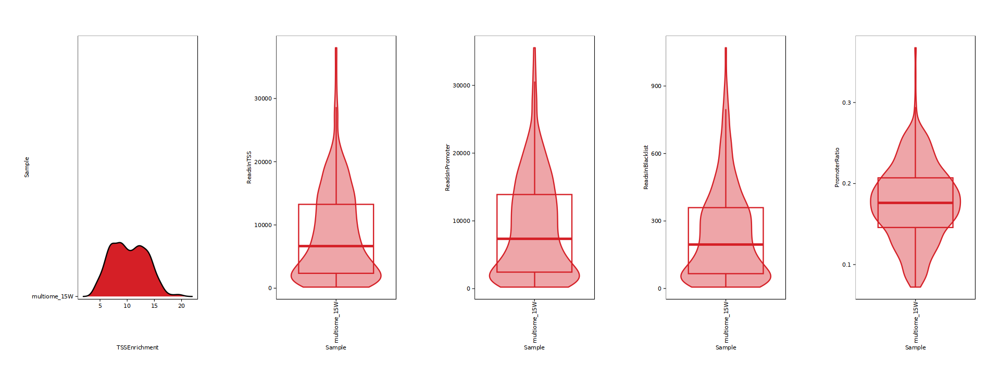

In [42]:
options(repr.plot.width=16, repr.plot.height=6)
ggAlignPlots(p1, p2, p3, p4, p5, type = "h")

## Additional filtering with RNA-seq modality

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    175    4070    5643    9069    8544  287439 

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


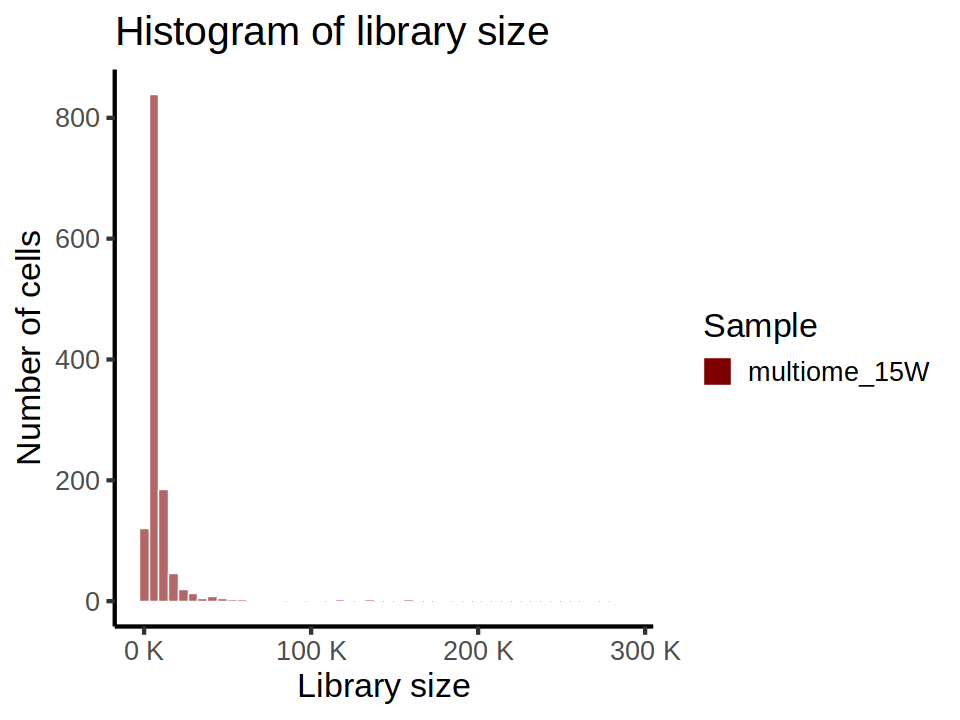

In [43]:
options(repr.plot.width=8, repr.plot.height=6)
# Print library size summary
summary(getCellColData(Aoib_w15_proj_multiome)$Gex_nUMI)

# Plot histogram
ggplot(as.data.frame(getCellColData(Aoib_w15_proj_multiome)), aes(x = Gex_nUMI, fill = Sample)) + 
    geom_histogram(color = "white", alpha = 0.6, size = 0.3, bins = 50) +
    scale_x_continuous(labels = unit_format(unit = "K", scale = 1e-3)) +
    scale_fill_manual(values = c_sample_col) + 
    guides(fill = guide_legend(override.aes = list(alpha = 1))) +
    theme_classic(base_size = 20) +
    labs(x = "Library size", y = "Number of cells", title = "Histogram of library size")

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    160    1948    2414    2820    3102   16264 

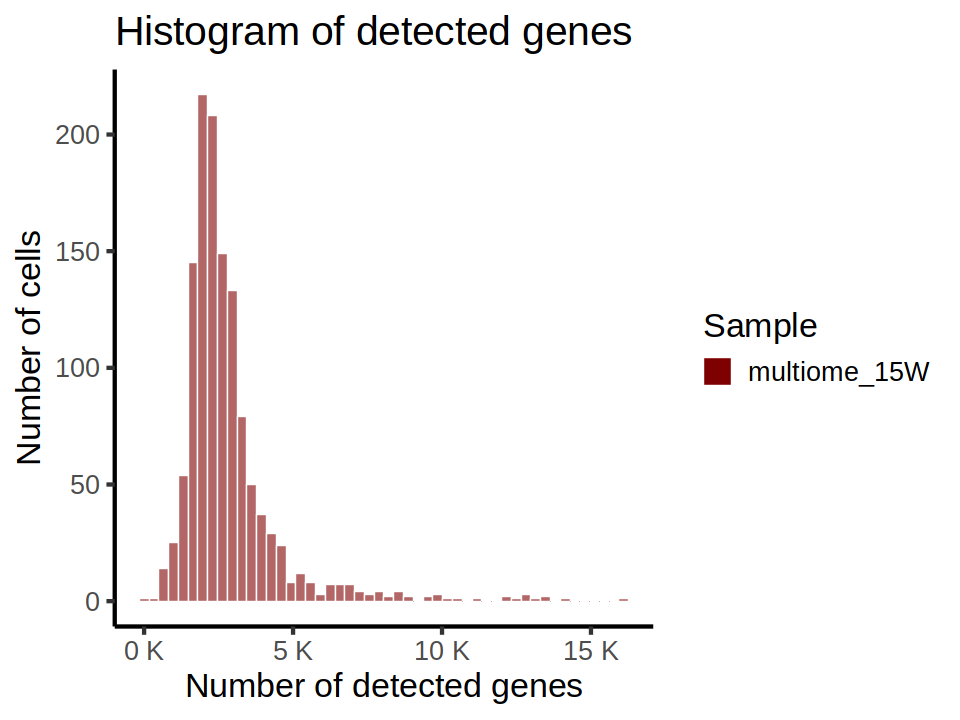

In [44]:
# Print detected genes summary
summary(getCellColData(Aoib_w15_proj_multiome)$Gex_nGenes)

# Plot histogram
ggplot(as.data.frame(getCellColData(Aoib_w15_proj_multiome)), aes(x = Gex_nGenes, fill = Sample)) +
    geom_histogram(color = "white", alpha = 0.6, size = 0.3, bins = 50) +
    scale_x_continuous(labels = unit_format(unit = "K", scale = 1e-3)) +
    scale_fill_manual(values = c_sample_col) + 
    guides(fill = guide_legend(override.aes = list(alpha = 1))) +
    theme_classic(base_size = 20) +
    labs(x = "Number of detected genes", y = "Number of cells", title = "Histogram of detected genes")

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.002900 0.003613 0.003740 0.004413 0.009444 

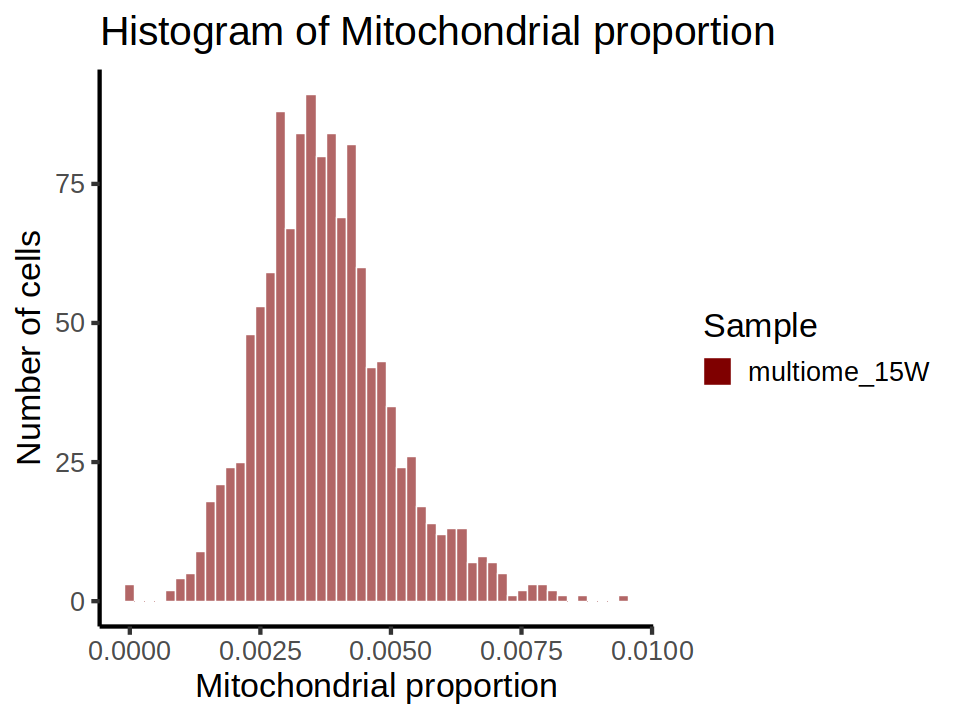

In [45]:
# Print mitochondrial proportion summary
summary(getCellColData(Aoib_w15_proj_multiome)$Gex_MitoRatio)

#print("Number of cells with 0% mitochondrial content:")
#data.frame(Sample = colData(cdSc)$Sample, ZeroMito = colData(cdSc)$subsets_Mt_percent == 0) %>%
#    count(Sample, ZeroMito, name = "Count") %>% group_by(Sample) %>% 
#    mutate(Percentage = round(prop.table(Count)*100, 2))

# Plot histogram
ggplot(as.data.frame(getCellColData(Aoib_w15_proj_multiome)), aes(x = Gex_MitoRatio, fill = Sample)) +
    geom_histogram(color = "white", alpha = 0.6, size = 0.3, bins = 50) +
    scale_fill_manual(values = c_sample_col) + 
    guides(fill = guide_legend(override.aes = list(alpha = 1))) +
    theme_classic(base_size = 20) +
    labs(x = "Mitochondrial proportion", y = "Number of cells", 
         title = "Histogram of Mitochondrial proportion")

In [46]:
log10_breaks <- trans_breaks("log10", function(x) 10^x)
log10_labels <- trans_format("log10", math_format(10^.x))

lower 
1069.12

lower 
1069.12

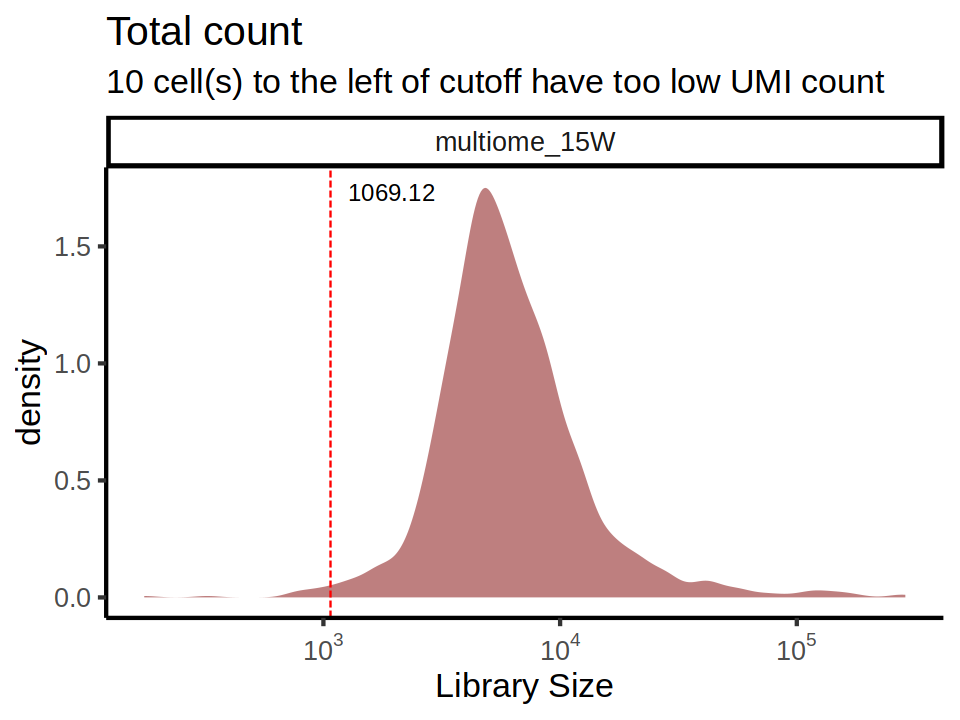

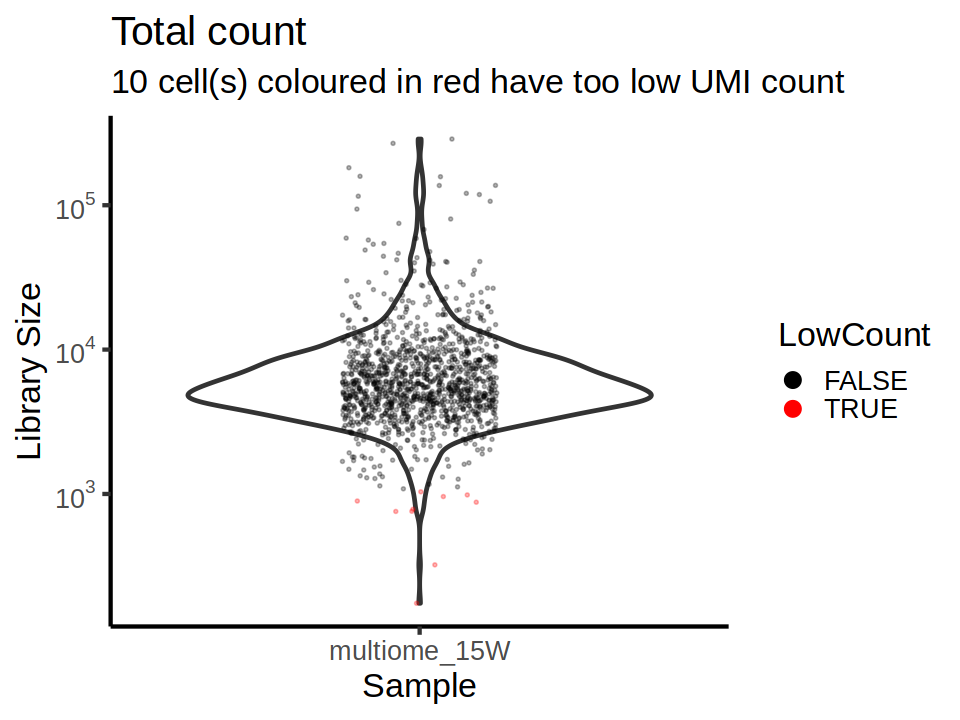

In [47]:
# Change this setting to adjust and show different threshold
mad1 <- 3
libsize.drop <- isOutlier(getCellColData(Aoib_w15_proj_multiome)$Gex_nUMI, nmads = mad1, type = "lower", log = TRUE)
cut_off_reads <- attr(libsize.drop, "thresholds")["lower"]
round(cut_off_reads, 2)

# Set minimum library size cutoff at 500 if the MAD cutoff is lower than 500
cut_off_reads <- ifelse(cut_off_reads < 500, 500, cut_off_reads)
round(cut_off_reads, 2)

libsize.drop <- getCellColData(Aoib_w15_proj_multiome)$Gex_nUMI < cut_off_reads

as.data.frame(getCellColData(Aoib_w15_proj_multiome)) %>%
    ggplot(aes(x = Gex_nUMI, fill = factor(Sample))) +
    geom_density(color = NA, alpha = 0.5) + facet_wrap(~ Sample) +
    geom_vline(xintercept = cut_off_reads, colour = "red", linetype = "longdash") +
    annotate("text", x = cut_off_reads, y = Inf, label = round(cut_off_reads, 2), 
             vjust = 2, hjust = -0.2, size = 5) +
    theme_classic(base_size = 20) + scale_fill_manual(values = c_sample_col) +
    scale_x_log10(breaks = log10_breaks, labels = log10_labels) +
    theme(legend.position = "none") +
    labs(x = "Library Size", y = "density", title = "Total count", fill = "Sample", 
         subtitle = paste(sum(libsize.drop), "cell(s) to the left of cutoff have too low UMI count"))

as.data.frame(getCellColData(Aoib_w15_proj_multiome)) %>% cbind(., libsize.drop) %>%
    rename(LowCount = libsize.drop) %>%
    ggplot(aes(x = factor(Sample), y = Gex_nUMI)) + geom_violin(size = 1) +
    geom_jitter(aes(color = LowCount), alpha = 0.3, size = 0.5, 
                position = position_jitter(height = 0, width = 0.15, seed = 123)) +
    theme_classic(base_size = 20) + scale_color_manual(values = c("black", "red")) +
    scale_y_log10(breaks = log10_breaks, labels = log10_labels) +
    guides(color = guide_legend(override.aes = list(size = 4, alpha = 1))) +
    labs(x = "Sample", y = "Library Size", title = "Total count", fill = "Sample", 
         subtitle = paste(sum(libsize.drop), "cell(s) coloured in red have too low UMI count"))

lower 
855.26

lower 
855.26

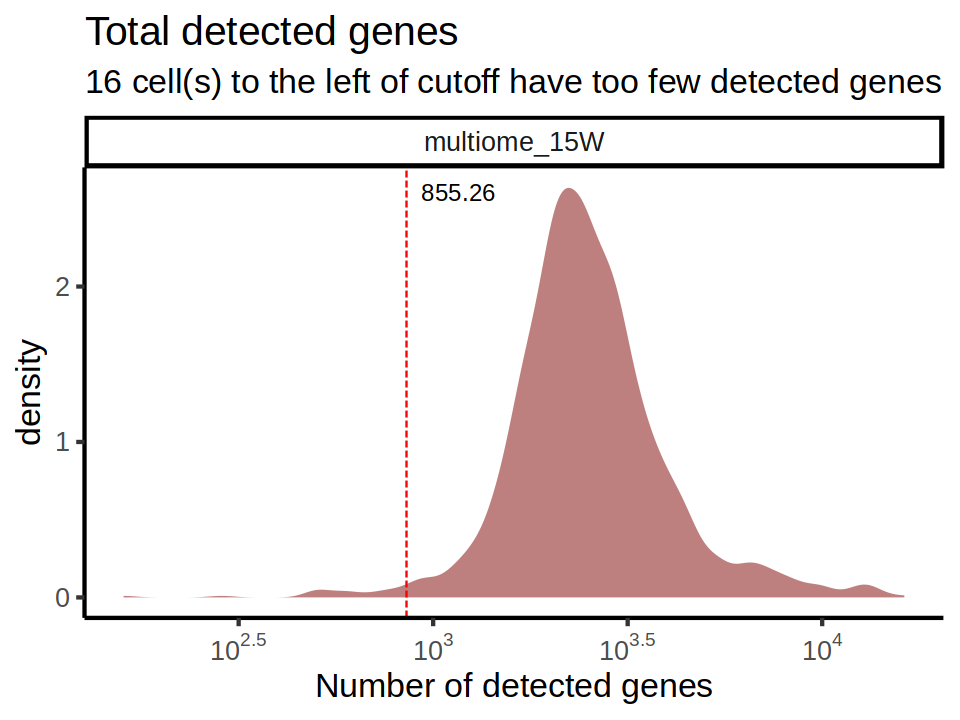

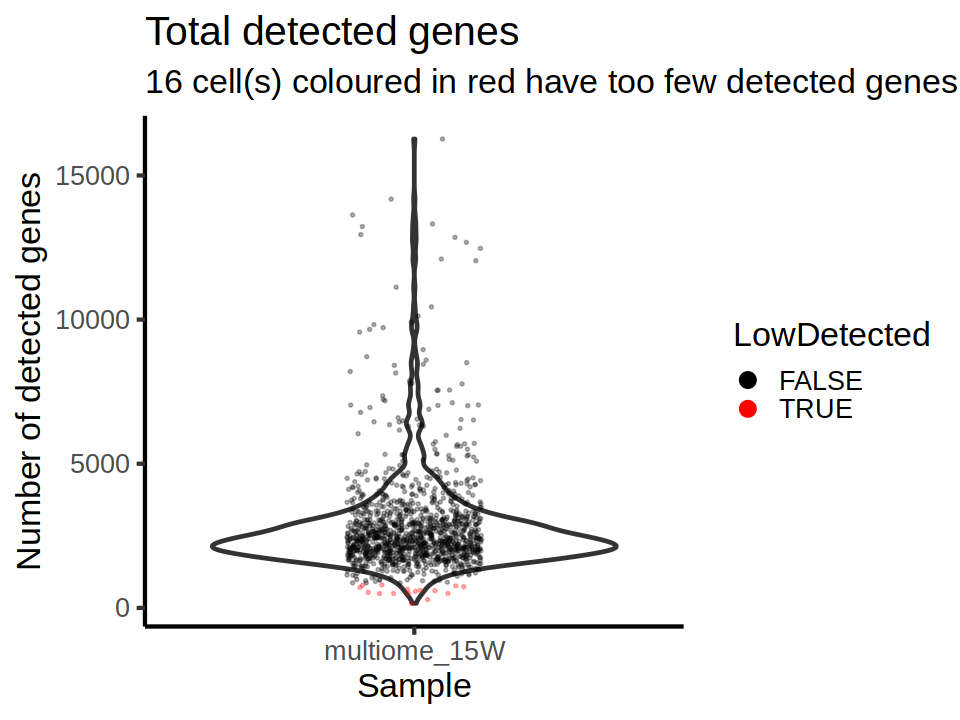

In [48]:
# Change this setting to adjust and show different threshold
mad2 <- 3
feature.drop <- isOutlier(getCellColData(Aoib_w15_proj_multiome)$Gex_nGenes, nmads = mad2, type = "lower", log = TRUE)
cut_off_genes <- attr(feature.drop, "thresholds")["lower"]
round(cut_off_genes, 2)

# Set minimum detected genes cutoff at 250 if the MAD cutoff is lower than 250
cut_off_genes <- ifelse(cut_off_genes < 250, 250, cut_off_genes)
round(cut_off_genes,2)

feature.drop <- getCellColData(Aoib_w15_proj_multiome)$Gex_nGenes < cut_off_genes

as.data.frame(getCellColData(Aoib_w15_proj_multiome)) %>%
    ggplot(aes(x = Gex_nGenes, fill = factor(Sample))) + 
    geom_density(color = NA, alpha = 0.5) + facet_wrap(~ Sample) +
    geom_vline(xintercept = cut_off_genes, colour = "red", linetype = "longdash") +
    annotate("text", x = cut_off_genes, y = Inf, label = round(cut_off_genes, 2), 
             vjust = 2, hjust = -0.2, size = 5) +
    theme_classic(base_size = 20) + scale_fill_manual(values = c_sample_col) +
    scale_x_log10(breaks = log10_breaks, labels = log10_labels) +
    theme(legend.position = "none") +
    labs(x = "Number of detected genes", y = "density", title = "Total detected genes", fill = "Sample", 
         subtitle = paste(sum(feature.drop), "cell(s) to the left of cutoff have too few detected genes"))

as.data.frame(getCellColData(Aoib_w15_proj_multiome)) %>% cbind(., feature.drop) %>%
    rename(LowDetected = feature.drop) %>%
    ggplot(aes(x = factor(Sample), y = Gex_nGenes)) + geom_violin(size = 1) +
    geom_jitter(aes(color = LowDetected), alpha = 0.3, size = 0.5, 
                position = position_jitter(height = 0, width = 0.15, seed = 123)) +
    theme_classic(base_size = 20) + scale_color_manual(values = c("black", "red")) + 
    guides(color = guide_legend(override.aes = list(size = 4, alpha = 1))) +
    labs(x = "Sample", y = "Number of detected genes", title = "Total detected genes", fill = "Sample", 
         subtitle = paste(sum(feature.drop), "cell(s) coloured in red have too few detected genes"))

higher 
  0.01

higher 
     5

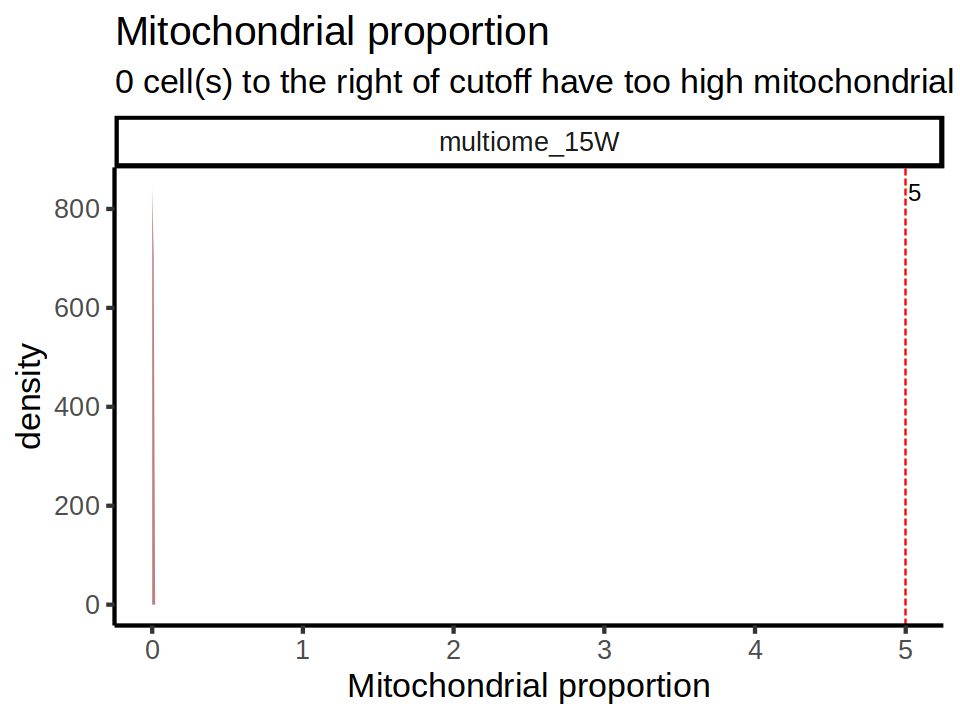

In [49]:
# Change this setting to adjust and show different threshold
mad3 <- 3
mito.drop <- isOutlier(getCellColData(Aoib_w15_proj_multiome)$Gex_MitoRatio, nmads = mad3, type = "higher")
cut_off_MT <- attr(mito.drop, "thresholds")["higher"]
round(cut_off_MT, 2)

# Set minimum cutoff at 10% if the MAD cutoff is lower than 10%
cut_off_MT <- ifelse(cut_off_MT < 5, 5, cut_off_MT)
# Set maximum cutoff at 15% if the MAD cutoff is higher than 15%
cut_off_MT <- ifelse(cut_off_MT > 15, 15, cut_off_MT)
round(cut_off_MT, 2)

mito.drop <- getCellColData(Aoib_w15_proj_multiome)$Gex_MitoRatio > cut_off_MT

p <- as.data.frame(getCellColData(Aoib_w15_proj_multiome)) %>% 
    ggplot(aes(x = Gex_MitoRatio, fill = factor(Sample))) + 
    geom_density(color = NA, alpha = 0.5) + facet_wrap(~ Sample) +
    geom_vline(xintercept = cut_off_MT, colour = "red", linetype = "longdash") +
    annotate("text", x = cut_off_MT, y = Inf, label = round(cut_off_MT, 2), 
             vjust = 2, hjust = -0.2, size = 5) +
    theme_classic(base_size = 20) + scale_fill_manual(values = c_sample_col) +
    theme(legend.position = "none") +
    labs(x = "Mitochondrial proportion", y = "density", title = "Mitochondrial proportion", fill = "Sample", 
         subtitle = paste(sum(mito.drop), "cell(s) to the right of cutoff have too high mitochondrial proportion"))

# Visual zoom to between 0 - 50%
if(max(getCellColData(Aoib_w15_proj_multiome)$Gex_MitoRatio) > 50) {
    p <- p + coord_cartesian(xlim = c(0, 50))
}

p

## Show summary

In [50]:
print(paste("Cells removed if:"))
print(paste("Read count below library size cutoff:", round(cut_off_reads, 4)))
print(paste("Number of genes expressed below feature cutoff:", round(cut_off_genes, 4)))
print(paste("MT percent above mito cutoff:", round(cut_off_MT, 4)))

[1] "Cells removed if:"
[1] "Read count below library size cutoff: 1069.1197"
[1] "Number of genes expressed below feature cutoff: 855.265"
[1] "MT percent above mito cutoff: 5"


In [51]:
# Discard summary
discard <- libsize.drop | feature.drop | mito.drop 
Aoib_w15_proj_multiome$discard = discard

venn.df <- data.frame(Sample = Aoib_w15_proj_multiome$Sample, LibSize = libsize.drop, FeaturesExp = feature.drop, 
                      MitoProp = mito.drop, Total = discard)

print(paste("Total number of cells removed:"))
DataFrame(Cells = colSums(venn.df[,2:5]))

[1] "Total number of cells removed:"


DataFrame with 4 rows and 1 column
                Cells
            <numeric>
LibSize            10
FeaturesExp        16
MitoProp            0
Total              16

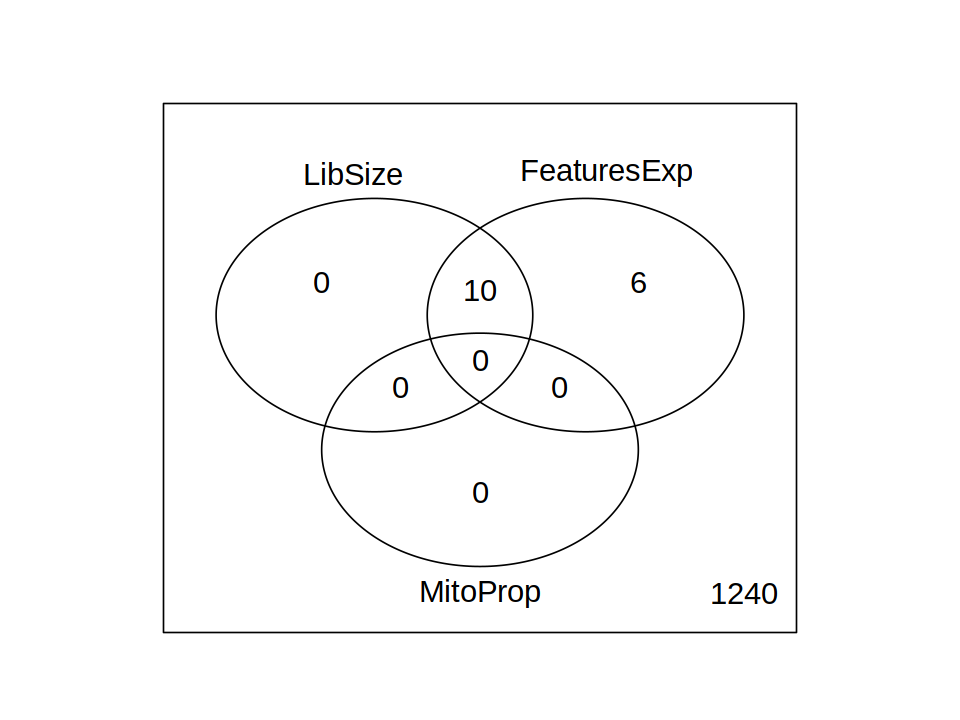

In [52]:
limma::vennDiagram(venn.df[,2:4], cex = c(1.5,1.2,1.0))

## Filter poor-quality cells

A new object is created with the filtered dataset.

In [53]:
Aoib_w15_proj_multiome <- Aoib_w15_proj_multiome[!discard]
Aoib_w15_proj_multiome


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W 
samples(1): multiome_15W
sampleColData names(1): ArrowFiles
cellColData names(20): Sample TSSEnrichment ... DoubletEnrichment
  discard
numberOfCells(1): 1240
medianTSS(1): 10.177
medianFrags(1): 22201.5

### Saving project

In [54]:
Aoib_w15_proj_multiome <- saveArchRProject(ArchRProj = Aoib_w15_proj_multiome)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

In [55]:
paste0("Memory Size = ", round(object.size(Aoib_w15_proj_multiome) / 10^6, 3), " MB")

[1] "Memory Size = 58.338 MB"

In [56]:
getAvailableMatrices(Aoib_w15_proj_multiome)

[1] "GeneExpressionMatrix" "GeneScoreMatrix"      "TileMatrix"

# 2 Dimensionality Reduction and Clustering

ArchR implements a **few different** LSI implementations and we have benchmarked many of these methods across multiple different test data sets. ArchR’s default LSI implementation is related to the method introduced by Timothy Stuart in [Signac](https://satijalab.org/signac/), which uses a term frequency that has been depth normalized to a constant (10,000) followed by normalization with the inverse document frequency and then log-transforming the resultant matrix (aka log(TF-IDF)).

One of the key inputs to LSI dimensionality reduction is the starting matrix. Thus far, the two main strategies in scATAC-seq have been to 
1. Use peak regions: However, using peak regions for LSI is inherently challenging because we do not have clusters or cluster-specific peaks prior to dimensionality reduction. Moreover, calling peaks on aggregated cells prior to clustering obscures cell type-specific peaks. Moreover, any union peak set will change when new samples are added to an experiment, making this strategy less stable.

2. Genome-wide tiles: mitigates these issues by using a consistent and unbiased feature set (genome-wide tiles). However, a genome-wide tile matrix of all cells by all regions can become prohibitively large. For this reason, most implementations use tiles that are greater than or equal to 5 kilobases in size. This drastically reduces the resolution of the approach because most accessible regions are only a few hundred basepairs long.

Because of the way that Arrow files are designed, ArchR is able to perform LSI very rapidly using genome-wide 500-bp tiles. This solves the problem of resolution and allows for the identification of clusters prior to calling peaks. The challenge is that 500-bp bins generate around 6 million features to be included in the cell by tile matrix. While ArchR is able to read this large amount of data into R by chunking the relevant matrices, we have also implemented an “estimated LSI” approach that performs the initial dimensionality reduction on a subset of the total cells. This estimated LSI approach has two main utilities - (i) it speeds up dimensionality reduction and (ii) as you decrease the number of cells used in the intial dimensionality reduction, this decreases the granularity of the data. This reduction in granularity can be used to your advantage to reduce batch effects in your data. However, it can also obscure true biology so estimated LSI approaches should be used under close manual supervision.

## 2.1 Iterative Latent Semantic Indexing (LSI)

In scRNA-seq identifying variable genes is a common way to compute dimensionality reduction (such as PCA). This is done because these highly variable genes are more likely to be biologically important and this reduces experimental noise. In scATAC-seq the data is **binary** and thus you cannot identify variable peaks for dimensionality reduction. Rather than identifying the most variable peaks, we have tried using the most accessible features as input to LSI; however, the results when running multiple samples have shown high degrees of noise and low reproducibility. To remedy this we introduced the **iterative LSI** approach ([Satpathy*, Granja* et al. Nature Biotechnology 2019](https://www.ncbi.nlm.nih.gov/pubmed/31375813) and [Granja*, Klemm* and McGinnis* et al. Nature Biotechnology 2019](https://www.ncbi.nlm.nih.gov/pubmed/31792411)). This approach computes an inital LSI transformation on the most accessible tiles and identifies lower resolution clusters that are not batch confounded. For example, when performed on peripheral blood mononuclear cells, this will identify clusters corresponding to the major cell types (T cells, B cells, and monocytes). Then `ArchR` computes the average accessibility for each of these clusters across all features. ArchR then identifies the most variable peaks across these clusters and uses these features for LSI again. In this **second iteration**, the most variable peaks are more similar to the variable genes used in scRNA-seq LSI implementations. The user can set how many iterations of LSI should be performed. We have found this approach to minimize observed batch effects and allow dimensionality reduction operations on a more reasonably sized feature matrix.

<img src="documentFigures/IterativeLSI_Flowchart.png" width="80%">

In [58]:
#LSI-ATAC
Aoib_w15_proj_multiome <- addIterativeLSI(
    ArchRProj = Aoib_w15_proj_multiome, 
    clusterParams = list(
      resolution = 0.2, 
      sampleCells = 10000,
      n.start = 10
    ),
    saveIterations = FALSE,
    useMatrix = "TileMatrix", 
    depthCol = "nFrags",
    name = "LSI_ATAC"
)


Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-3ab0653a253a-Date-2023-06-05_Time-14-46-36.log
If there is an issue, please report to github with logFile!

2023-06-05 14:46:36 : Computing Total Across All Features, 0.001 mins elapsed.

2023-06-05 14:46:37 : Computing Top Features, 0.014 mins elapsed.

###########
2023-06-05 14:46:38 : Running LSI (1 of 2) on Top Features, 0.038 mins elapsed.
###########

2023-06-05 14:46:38 : Creating Partial Matrix, 0.038 mins elapsed.

2023-06-05 14:46:44 : Computing LSI, 0.127 mins elapsed.

2023-06-05 14:46:58 : Identifying Clusters, 0.357 mins elapsed.

2023-06-05 14:46:59 : Identified 4 Clusters, 0.389 mins elapsed.

2023-06-05 14:46:59 : Creating Cluster Matrix on the total Group Features, 0.389 mins elapsed.

2023-06-05 14:47:31 : Computing Variable Features, 0.915 mins elapsed.

###########
2023-06-05 14:47:31 : Running LSI (2 of 2) on Variable Features, 0.917 mins elapsed.
###########

2023-06-05 14:47:31 : Creating Par

### Add LSI to RNA

In [59]:
#LSI-RNA
Aoib_w15_proj_multiome <- addIterativeLSI(
    ArchRProj = Aoib_w15_proj_multiome, 
    clusterParams = list(
      resolution = 0.2, 
      sampleCells = 10000,
      n.start = 10
    ),
    saveIterations = FALSE,
    useMatrix = "GeneExpressionMatrix", 
    depthCol = "Gex_nUMI",
    varFeatures = 2500,
    firstSelection = "variable",
    binarize = FALSE,
    name = "LSI_RNA"
)

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-3ab068f7ac63-Date-2023-06-05_Time-14-47-46.log
If there is an issue, please report to github with logFile!

2023-06-05 14:47:46 : Computing Variability Across All Features, 0.001 mins elapsed.

2023-06-05 14:47:47 : Computing Variable Features, 0.017 mins elapsed.

###########
2023-06-05 14:47:48 : Running LSI (1 of 2) on Top Features, 0.033 mins elapsed.
###########

2023-06-05 14:47:48 : Creating Partial Matrix, 0.034 mins elapsed.

2023-06-05 14:47:50 : Computing LSI, 0.066 mins elapsed.

2023-06-05 14:47:56 : Identifying Clusters, 0.163 mins elapsed.

2023-06-05 14:47:57 : Identified 9 Clusters, 0.187 mins elapsed.

2023-06-05 14:47:57 : Creating Cluster Matrix on the total Group Features, 0.187 mins elapsed.

2023-06-05 14:48:21 : Computing Variable Features, 0.588 mins elapsed.

###########
2023-06-05 14:48:21 : Running LSI (2 of 2) on Variable Features, 0.589 mins elapsed.
###########

2023-06-05 14:48:21 : C

## Combined dimensions

In [60]:
#Combined Dims
Aoib_w15_proj_multiome <- addCombinedDims(Aoib_w15_proj_multiome, 
                                         reducedDims = c("LSI_ATAC", "LSI_RNA"), name =  "LSI_Combined")

## UMAP on snATAC-seq

In [61]:
#UMAPs
Aoib_w15_proj_multiome <- addUMAP(Aoib_w15_proj_multiome, 
                                 reducedDims = "LSI_ATAC", name = "UMAP_ATAC", 
                                 minDist = 0.8, force = TRUE)

14:48:28 UMAP embedding parameters a = 0.2321 b = 1.681

14:48:28 Read 1240 rows and found 30 numeric columns

14:48:28 Using Annoy for neighbor search, n_neighbors = 40

14:48:28 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:48:29 Writing NN index file to temp file /tmp/RtmpmkkiWc/file3ab0f91c5b2

14:48:29 Searching Annoy index using 8 threads, search_k = 4000

14:48:29 Annoy recall = 100%

14:48:30 Commencing smooth kNN distance calibration using 8 threads
 with target n_neighbors = 40

14:48:31 Initializing from normalized Laplacian + noise (using irlba)

14:48:31 Commencing optimization for 500 epochs, with 71662 positive edges

14:48:34 Optimization finished

14:48:34 Creating temp model dir /tmp/RtmpmkkiWc/dir3ab0252b0a62

14:48:34 Creating dir /tmp/Rtmpmkki

## UMAP on snRNA-seq

In [62]:
#UMAPs
Aoib_w15_proj_multiome <- addUMAP(Aoib_w15_proj_multiome,
                                 reducedDims = "LSI_RNA", 
                                 name = "UMAP_RNA", minDist = 0.8, force = TRUE)

14:48:34 UMAP embedding parameters a = 0.2321 b = 1.681

14:48:34 Read 1240 rows and found 30 numeric columns

14:48:34 Using Annoy for neighbor search, n_neighbors = 40

14:48:34 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:48:34 Writing NN index file to temp file /tmp/RtmpmkkiWc/file3ab043cb76fb

14:48:34 Searching Annoy index using 8 threads, search_k = 4000

14:48:35 Annoy recall = 100%

14:48:35 Commencing smooth kNN distance calibration using 8 threads
 with target n_neighbors = 40

14:48:36 Initializing from normalized Laplacian + noise (using irlba)

14:48:37 Commencing optimization for 500 epochs, with 59170 positive edges

14:48:39 Optimization finished

14:48:39 Creating temp model dir /tmp/RtmpmkkiWc/dir3ab06c415806

14:48:39 Creating dir /tmp/Rtmpmkk

## Umap on combined dimensions

In [63]:
Aoib_w15_proj_multiome <- addUMAP(Aoib_w15_proj_multiome, 
                                 reducedDims = "LSI_Combined", 
                                 name = "UMAP_Combined", minDist = 0.8, force = TRUE)

14:48:40 UMAP embedding parameters a = 0.2321 b = 1.681

14:48:40 Read 1240 rows and found 60 numeric columns

14:48:40 Using Annoy for neighbor search, n_neighbors = 40

14:48:40 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:48:40 Writing NN index file to temp file /tmp/RtmpmkkiWc/file3ab08333c4a

14:48:40 Searching Annoy index using 8 threads, search_k = 4000

14:48:40 Annoy recall = 100%

14:48:41 Commencing smooth kNN distance calibration using 8 threads
 with target n_neighbors = 40

14:48:42 Initializing from normalized Laplacian + noise (using irlba)

14:48:42 Commencing optimization for 500 epochs, with 68098 positive edges

14:48:45 Optimization finished

14:48:45 Creating temp model dir /tmp/RtmpmkkiWc/dir3ab0184bd8b5

14:48:45 Creating dir /tmp/Rtmpmkki

**If we see downstream that you have subtle batch effects, another option is to add more LSI iterations and to start from a lower intial clustering resolution. Additionally the number of variable features can be lowered to increase focus on the more variable features.**

## 2.2 Add cluster

In `ArchR`, clustering is performed using the `addClusters()` function which permits additional clustering parameters to be passed to the `Seurat::FindClusters()` function via .... In our hands, clustering using `Seurat::FindClusters()` is deterministic, meaning that the exact same input will always result in the exact same output.

## Cluster on combined dimension

In [64]:
Aoib_w15_proj_multiome <- addClusters(Aoib_w15_proj_multiome, reducedDims = "LSI_Combined", 
                                     name = "Clusters", resolution = 0.4, force = TRUE)

ArchR logging to : ArchRLogs/ArchR-addClusters-3ab059f81178-Date-2023-06-05_Time-14-48-45.log
If there is an issue, please report to github with logFile!

2023-06-05 14:48:46 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.002 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1240
Number of edges: 47918

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9212
Number of communities: 9
Elapsed time: 0 seconds


2023-06-05 14:48:48 : Testing Outlier Clusters, 0.032 mins elapsed.

2023-06-05 14:48:48 : Assigning Cluster Names to 9 Clusters, 0.032 mins elapsed.

2023-06-05 14:48:48 : Finished addClusters, 0.034 mins elapsed.



## Cluster on ATAC dimension

In [65]:
Aoib_w15_proj_multiome <- addClusters(Aoib_w15_proj_multiome, reducedDims = "LSI_ATAC", 
                                     name = "Clusters_ATAC", resolution = 0.4, force = TRUE)

ArchR logging to : ArchRLogs/ArchR-addClusters-3ab02f9dfc20-Date-2023-06-05_Time-14-48-48.log
If there is an issue, please report to github with logFile!

2023-06-05 14:48:48 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.001 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1240
Number of edges: 55691

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8985
Number of communities: 7
Elapsed time: 0 seconds


2023-06-05 14:48:49 : Testing Outlier Clusters, 0.027 mins elapsed.

2023-06-05 14:48:49 : Assigning Cluster Names to 7 Clusters, 0.027 mins elapsed.

2023-06-05 14:48:49 : Finished addClusters, 0.028 mins elapsed.



## Cluster on RNA dimension

In [66]:
Aoib_w15_proj_multiome <- addClusters(Aoib_w15_proj_multiome, reducedDims = "LSI_RNA", 
                                     name = "Clusters_RNA", resolution = 0.4, force = TRUE)

ArchR logging to : ArchRLogs/ArchR-addClusters-3ab073dae218-Date-2023-06-05_Time-14-48-49.log
If there is an issue, please report to github with logFile!

2023-06-05 14:48:50 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.001 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1240
Number of edges: 34141

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9320
Number of communities: 12
Elapsed time: 0 seconds


2023-06-05 14:48:51 : Testing Outlier Clusters, 0.024 mins elapsed.

2023-06-05 14:48:51 : Assigning Cluster Names to 12 Clusters, 0.024 mins elapsed.

2023-06-05 14:48:51 : Finished addClusters, 0.025 mins elapsed.



In [67]:
df <- data.frame(Combined = Aoib_w15_proj_multiome$Clusters, 
                 ATAC = Aoib_w15_proj_multiome$Clusters_ATAC,
                 RNA = Aoib_w15_proj_multiome$Clusters_RNA)

In [68]:
head(df)

,Combined,ATAC,RNA
,<chr>,<chr>,<chr>
1,C1,C4,C6
2,C6,C1,C1
3,C8,C2,C11
4,C7,C3,C9
5,C4,C6,C3
6,C7,C3,C10


In [69]:
table(df[,c('Combined','ATAC')])

        ATAC
Combined  C1  C2  C3  C4  C5  C6  C7
      C1   0   0   0 191   2   2   4
      C2   0   0   0  11   0   1 125
      C3   0   8   2   1  74   8   6
      C4   0   1   1   0   0 177   1
      C5   0   0   0   0   0  72   0
      C6  44   6   4   0   1   0   0
      C7   0   3 170   0   0   2   0
      C8   0 278   0   0   1   0   0
      C9   0  44   0   0   0   0   0

In [70]:
table(df[,c('Combined','RNA')])

        RNA
Combined  C1 C10 C11 C12  C2  C3  C4  C5  C6  C7  C8  C9
      C1   0   0   0   0   0   1   0 194   3   1   0   0
      C2   0   0   0   0   0   2   0   1   1 133   0   0
      C3   0   0  11   0   0   1   0   1  55   1  30   0
      C4   0   0   0   0   1 172   4   1   1   1   0   0
      C5   1   0   0   0  20  10  40   0   0   1   0   0
      C6  55   0   0   0   0   0   0   0   0   0   0   0
      C7   0  32   0   0   0   2   0   0   1   0   0 140
      C8   0   0 275   0   0   1   0   0   2   0   0   1
      C9   0   0   0  44   0   0   0   0   0   0   0   0

In [71]:
table(df[,c('ATAC','RNA')])

    RNA
ATAC  C1 C10 C11 C12  C2  C3  C4  C5  C6  C7  C8  C9
  C1  44   0   0   0   0   0   0   0   0   0   0   0
  C2   6   2 277  44   1   1   0   0   7   0   0   2
  C3   4  29   1   0   0   3   0   0   2   0   0 138
  C4   0   0   1   0   0   1   0 186   3  12   0   0
  C5   1   0   6   0   0   1   0   3  37   0  30   0
  C6   1   1   1   0  20 180  44   3   8   3   0   1
  C7   0   0   0   0   0   3   0   5   6 122   0   0

In [72]:
table_samples_by_clusters <- as_tibble(df) %>%
  group_by(Combined, ATAC) %>%
  summarize(count = n()) %>%
  spread(ATAC, count, fill = 0) %>%
  ungroup() %>%
  mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c('Combined', 'total_cell_count', everything()))

`summarise()` has grouped output by 'Combined'. You can override using the `.groups` argument.


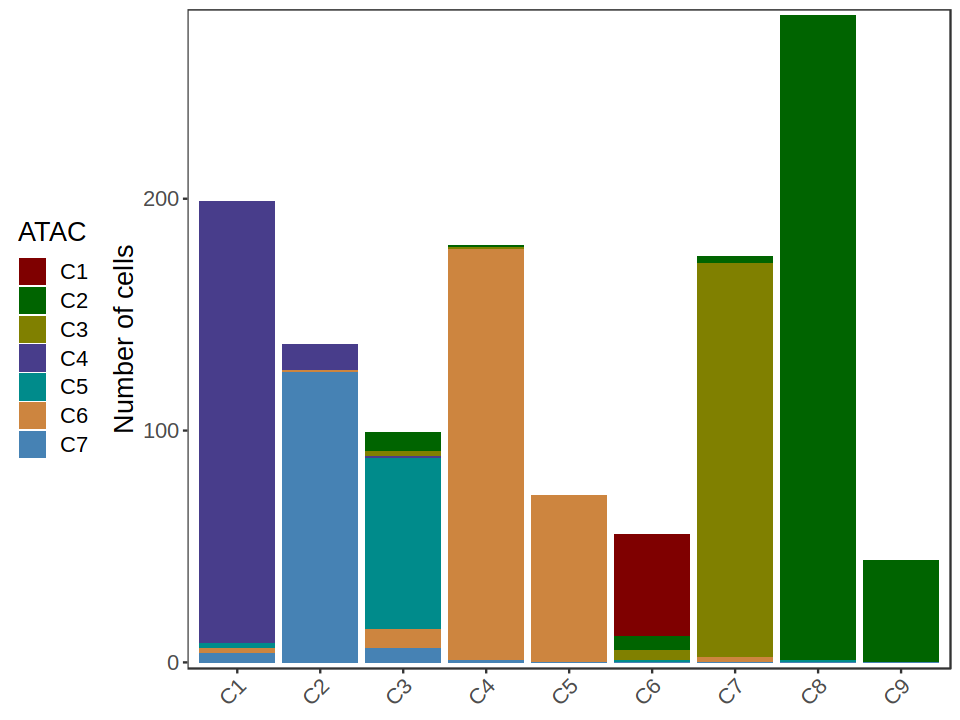

In [73]:
p1 <- table_samples_by_clusters %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'Combined') %>%
  mutate(Combined = factor(Combined)) %>%
  ggplot(aes(Combined, value, fill = variable)) +
  geom_bar(position = 'stack', stat = 'identity') +
  scale_fill_manual(name = 'ATAC', values = c_clust_col) +
  scale_y_continuous(name = 'Number of cells', labels = scales::comma, expand = c(0.01, 0)) +
  theme_bw() +
  theme(
    legend.position = 'left',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title.x = element_blank(),
    axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1)
  )
p1

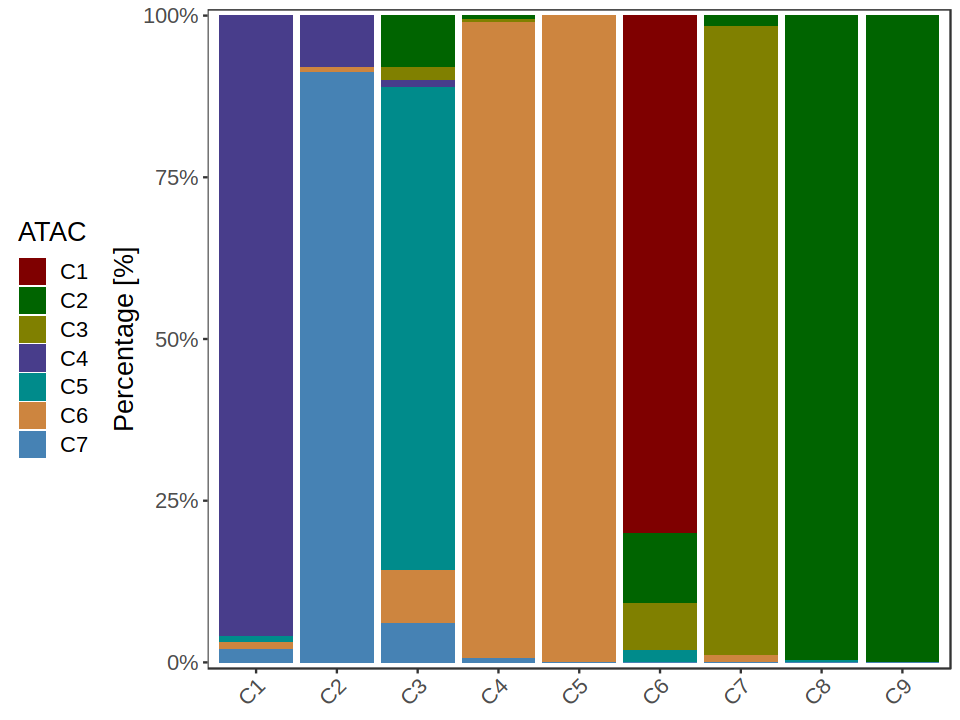

In [74]:
p1 <- table_samples_by_clusters %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'Combined') %>%
  mutate(Combined = factor(Combined)) %>%
  ggplot(aes(Combined, value, fill = variable)) +
  geom_bar(position = 'fill', stat = 'identity', show.legend = TRUE) +
  scale_fill_manual(name = 'ATAC', values = c_clust_col) +
  scale_y_continuous(name = 'Percentage [%]', labels = scales::percent_format(), expand = c(0.01,0)) +
  theme_bw() +
  theme(
    legend.position = 'left',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title.x = element_blank(),
    axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1)
  )
p1

In [75]:
table_samples_by_clusters <- as_tibble(df) %>%
  group_by(Combined, RNA) %>%
  summarize(count = n()) %>%
  spread(RNA, count, fill = 0) %>%
  ungroup() %>%
  mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c('Combined', 'total_cell_count', everything()))

`summarise()` has grouped output by 'Combined'. You can override using the `.groups` argument.


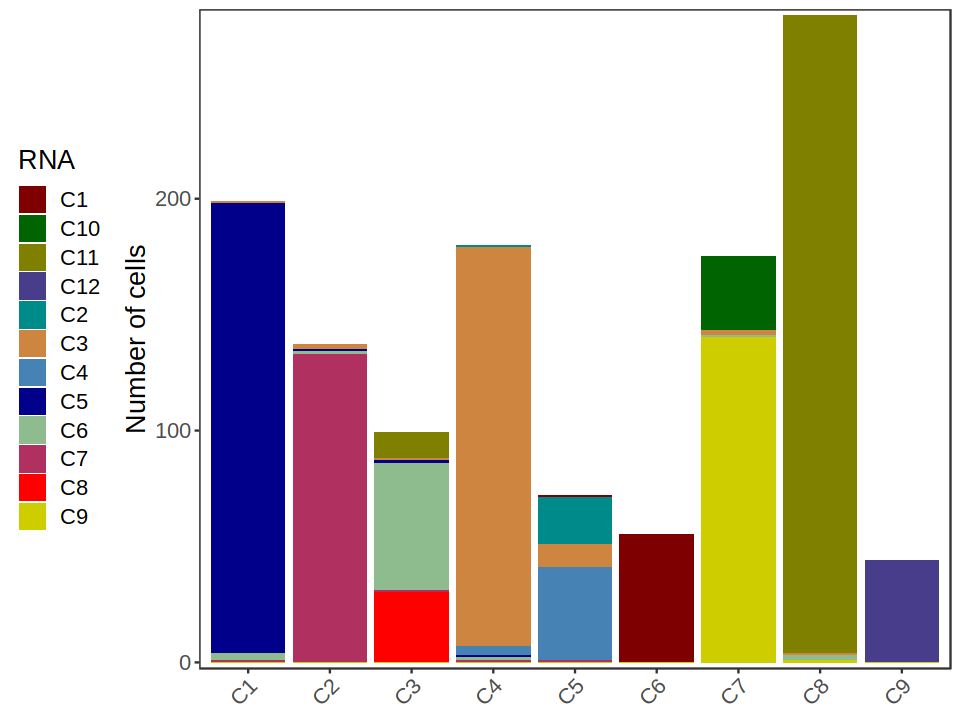

In [76]:
p1 <- table_samples_by_clusters %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'Combined') %>%
  mutate(Combined = factor(Combined)) %>%
  ggplot(aes(Combined, value, fill = variable)) +
  geom_bar(position = 'stack', stat = 'identity') +
  scale_fill_manual(name = 'RNA', values = c_clust_col) +
  scale_y_continuous(name = 'Number of cells', labels = scales::comma, expand = c(0.01, 0)) +
  theme_bw() +
  theme(
    legend.position = 'left',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title.x = element_blank(),
    axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1)
  )
p1

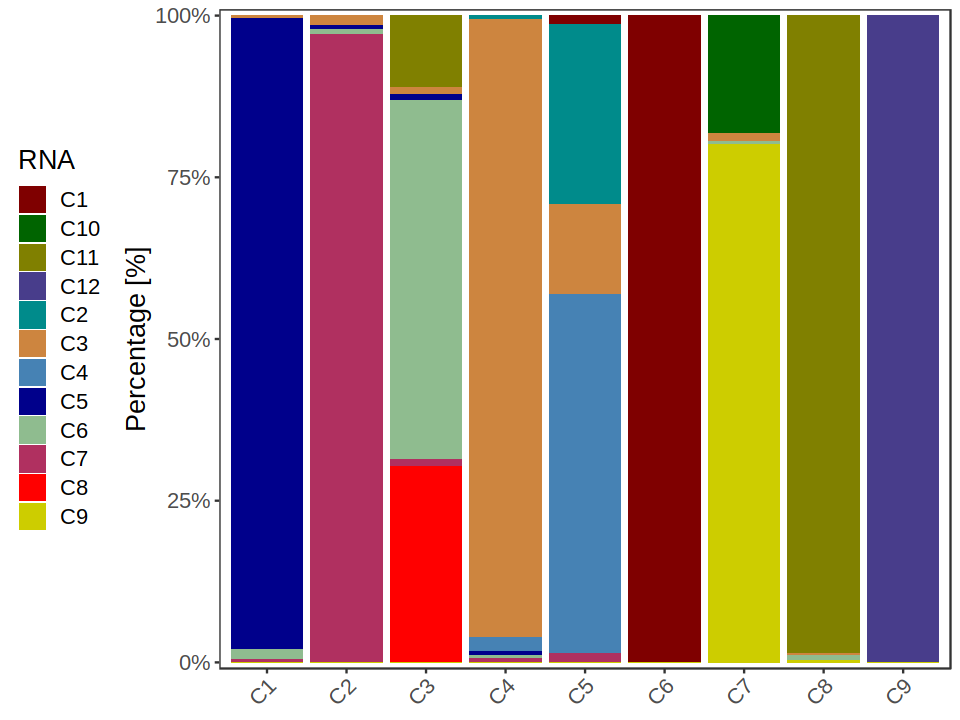

In [77]:
p1 <- table_samples_by_clusters %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'Combined') %>%
  mutate(Combined = factor(Combined)) %>%
  ggplot(aes(Combined, value, fill = variable)) +
  geom_bar(position = 'fill', stat = 'identity', show.legend = TRUE) +
  scale_fill_manual(name = 'RNA', values = c_clust_col) +
  scale_y_continuous(name = 'Percentage [%]', labels = scales::percent_format(), expand = c(0.01,0)) +
  theme_bw() +
  theme(
    legend.position = 'left',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title.x = element_blank(),
    axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1)
  )
p1

To better understand which samples reside in which clusters, we can create a cluster confusion matrix across each sample using the `confusionMatrix()` function.

In [78]:
cM <- confusionMatrix(paste0(Aoib_w15_proj_multiome$Clusters), paste0(Aoib_w15_proj_multiome$Clusters_ATAC))
cM

9 x 7 sparse Matrix of class "dgCMatrix"
    C4 C1  C2  C3  C6  C7 C5
C1 191  .   .   .   2   4  2
C6   . 44   6   4   .   .  1
C8   .  . 278   .   .   .  1
C7   .  .   3 170   2   .  .
C4   .  .   1   1 177   1  .
C5   .  .   .   .  72   .  .
C3   1  .   8   2   8   6 74
C2  11  .   .   .   1 125  .
C9   .  .  44   .   .   .  .

### Combined vs ATAC

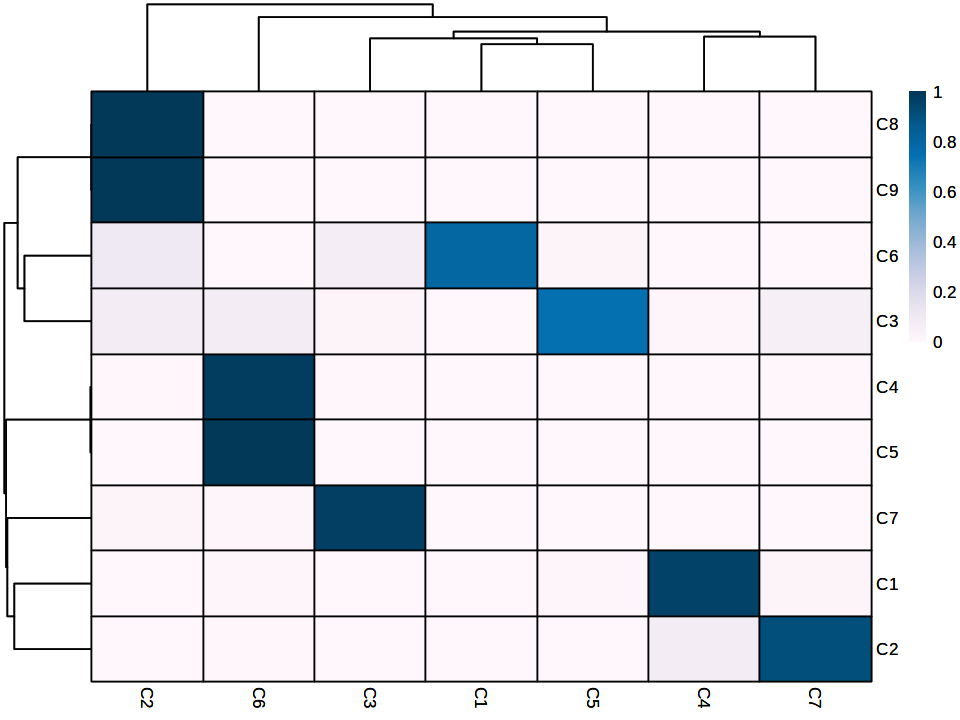

In [79]:
cM <- cM / Matrix::rowSums(cM)
p <- pheatmap::pheatmap(
    mat = as.matrix(cM), 
    color = paletteContinuous("whiteBlue"), 
    border_color = "black"
)
p

In [80]:
cM <- confusionMatrix(paste0(Aoib_w15_proj_multiome$Clusters), paste0(Aoib_w15_proj_multiome$Clusters_RNA))
cM

  [[ suppressing 12 column names ‘C6’, ‘C1’, ‘C11’ ... ]]



9 x 12 sparse Matrix of class "dgCMatrix"
                                           
C1  3  .   .   .   1  .  . 194   1  .  .  .
C6  . 55   .   .   .  .  .   .   .  .  .  .
C8  2  . 275   1   1  .  .   .   .  .  .  .
C7  1  .   . 140   2 32  .   .   .  .  .  .
C4  1  .   .   . 172  .  4   1   1  1  .  .
C5  .  1   .   .  10  . 40   .   1 20  .  .
C3 55  .  11   .   1  .  .   1   1  .  . 30
C2  1  .   .   .   2  .  .   1 133  .  .  .
C9  .  .   .   .   .  .  .   .   .  . 44  .

### Combined vs RNA

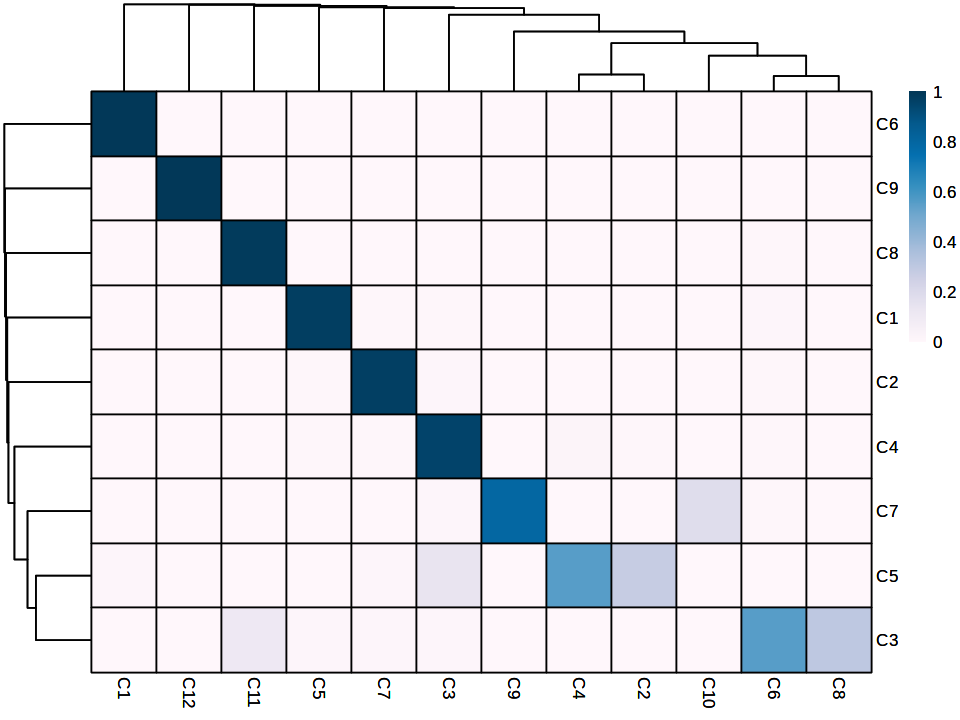

In [81]:
cM <- cM / Matrix::rowSums(cM)
p <- pheatmap::pheatmap(
    mat = as.matrix(cM), 
    color = paletteContinuous("whiteBlue"), 
    border_color = "black"
)
p

In [82]:
cM <- confusionMatrix(paste0(Aoib_w15_proj_multiome$Clusters_ATAC), paste0(Aoib_w15_proj_multiome$Clusters_RNA))
cM

  [[ suppressing 12 column names ‘C6’, ‘C1’, ‘C11’ ... ]]



7 x 12 sparse Matrix of class "dgCMatrix"
                                           
C4  3  .   1   .   1  .  . 186  12  .  .  .
C1  . 44   .   .   .  .  .   .   .  .  .  .
C2  7  6 277   2   1  2  .   .   .  1 44  .
C3  2  4   1 138   3 29  .   .   .  .  .  .
C6  8  1   1   1 180  1 44   3   3 20  .  .
C7  6  .   .   .   3  .  .   5 122  .  .  .
C5 37  1   6   .   1  .  .   3   .  .  . 30

### ATAC vs RNA

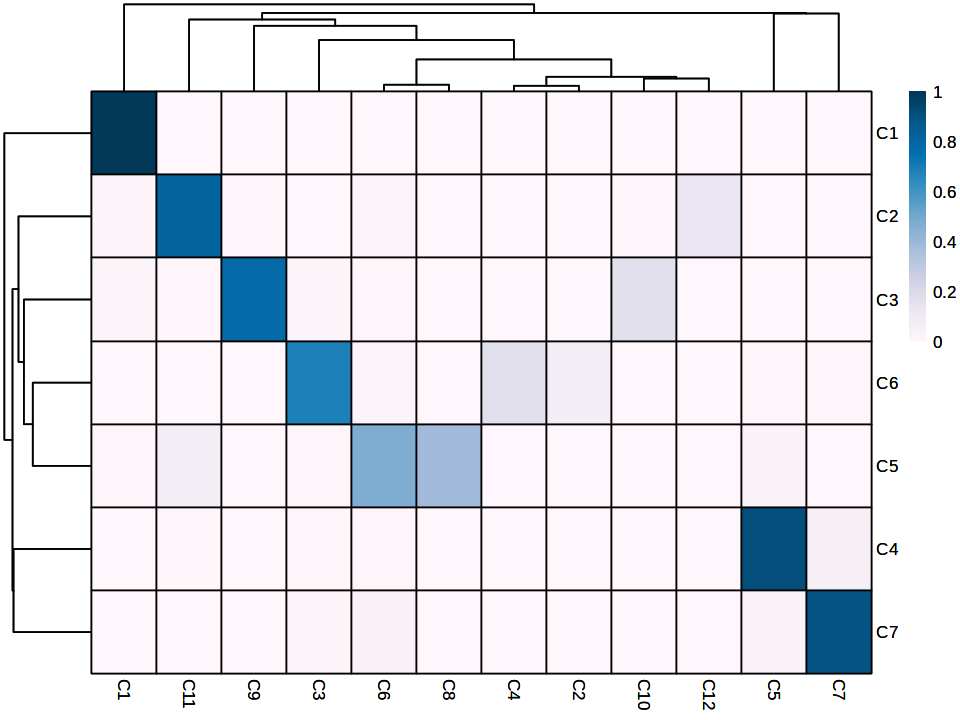

In [83]:
cM <- cM / Matrix::rowSums(cM)
p <- pheatmap::pheatmap(
    mat = as.matrix(cM), 
    color = paletteContinuous("whiteBlue"), 
    border_color = "black"
)
p

## 2.3 Visualizing in a 2D UMAP Embedding
We can visualize our scATAC-seq data using a 2-dimensional representation such as Uniform Manifold Approximation and Projection (UMAP). To do this, we add a UMAP embedding to our ArchRProject object with the addUMAP() function. This function uses the uwot package to perform UMAP.

Using this UMAP, we can visualize various attributes of our cells which are stored in a matrix called cellColData in our ArchRProject. To do this, we use the plotEmbedding() function and we specify the variable to use for coloration via a combination of the colorBy and name parameters.

For example, we can color by “Sample”:

In [84]:
p1 <- plotEmbedding(ArchRProj = Aoib_w15_proj_multiome, 
                    colorBy = "cellColData", 
                    name = "Clusters", 
                    embedding = "UMAP_Combined", 
                    alpha=0.5,
                    size=1)+ 
    theme_classic(base_size=12) + 
    guides(colour = guide_legend(override.aes = list(size=4))) 

p2 <- plotEmbedding(ArchRProj = Aoib_w15_proj_multiome, 
                    colorBy = "cellColData", 
                    name = "Clusters_ATAC", 
                    embedding = "UMAP_ATAC", 
                    alpha=0.5,
                    size=1)+ 
    theme_classic(base_size=12) + 
    guides(colour = guide_legend(override.aes = list(size=4)))

p3 <- plotEmbedding(ArchRProj = Aoib_w15_proj_multiome, 
                    colorBy = "cellColData", 
                    name = "Clusters_RNA", 
                    embedding = "UMAP_RNA", 
                    alpha=0.5,
                    size=1)+ 
    theme_classic(base_size=12) + 
    guides(colour = guide_legend(override.aes = list(size=4)))
#p2 <- plotEmbedding(ArchRProj = Ali_w17_proj, colorBy = "cellColData", name = "Clusters", embedding = "UMAP", size=1)+ 
#    theme_classic(base_size=12) + 
#    guides(colour = guide_legend(override.aes = list(size=4))) 

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3ab0546f5c59-Date-2023-06-05_Time-14-48-54.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3ab0546f5c59-Date-2023-06-05_Time-14-48-54.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3ab03ba1a0e0-Date-2023-06-05_Time-14-48-55.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3ab03ba1a0e0-Date-2023-06-05_Time-14-48-55.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3ab01c396f1b-Date-2023-06-05_Time-14-48-55.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3ab01c396f1b-Date-2023-06-05_Time-14-

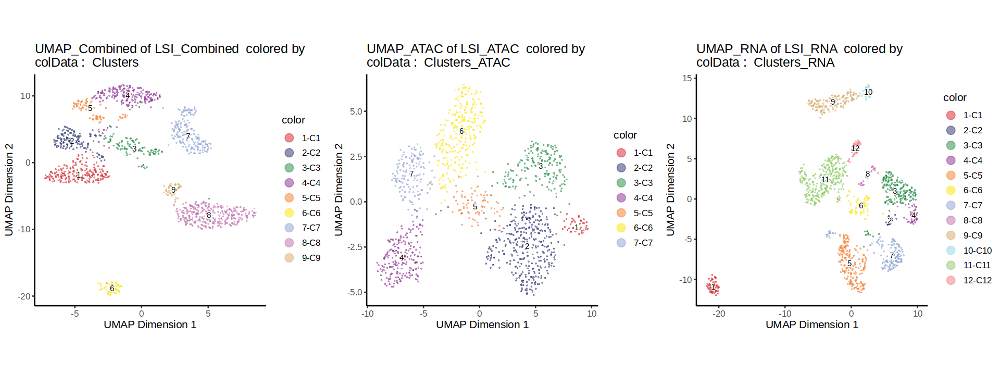

In [85]:
options(repr.plot.width=16, repr.plot.height=6)
ggAlignPlots(p1, p2, p3, type = "h")

In [86]:
plotPDF(p1,p2,p3, name = "Plot-UMAP-Own_UMAP_Clusters_multiome.pdf",
        ArchRProj = Aoib_w15_proj_multiome, addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



In [87]:
p1 <- plotEmbedding(ArchRProj = Aoib_w15_proj_multiome, 
                    colorBy = "cellColData", 
                    name = "Clusters", 
                    embedding = "UMAP_Combined", 
                    alpha=0.5,
                    size=1)+ 
    theme_classic(base_size=12) + 
    guides(colour = guide_legend(override.aes = list(size=4))) 

p2 <- plotEmbedding(ArchRProj = Aoib_w15_proj_multiome, 
                    colorBy = "cellColData", 
                    name = "Clusters_ATAC", 
                    embedding = "UMAP_Combined", 
                    alpha=0.5,
                    size=1)+ 
    theme_classic(base_size=12) + 
    guides(colour = guide_legend(override.aes = list(size=4))) 

p3 <- plotEmbedding(ArchRProj = Aoib_w15_proj_multiome, 
                    colorBy = "cellColData", 
                    name = "Clusters_RNA", 
                    embedding = "UMAP_Combined", 
                    alpha=0.5,
                    size=1)+ 
    theme_classic(base_size=12) + 
    guides(colour = guide_legend(override.aes = list(size=4)))

#p2 <- plotEmbedding(ArchRProj = Ali_w17_proj, colorBy = "cellColData", name = "Clusters", embedding = "UMAP", size=1)+ 
#    theme_classic(base_size=12) + 
#    guides(colour = guide_legend(override.aes = list(size=4))) 

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3ab06df8735b-Date-2023-06-05_Time-14-49-07.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3ab06df8735b-Date-2023-06-05_Time-14-49-07.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3ab0758953d7-Date-2023-06-05_Time-14-49-07.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3ab0758953d7-Date-2023-06-05_Time-14-49-07.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3ab07d92a266-Date-2023-06-05_Time-14-49-07.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3ab07d92a266-Date-2023-06-05_Time-14-

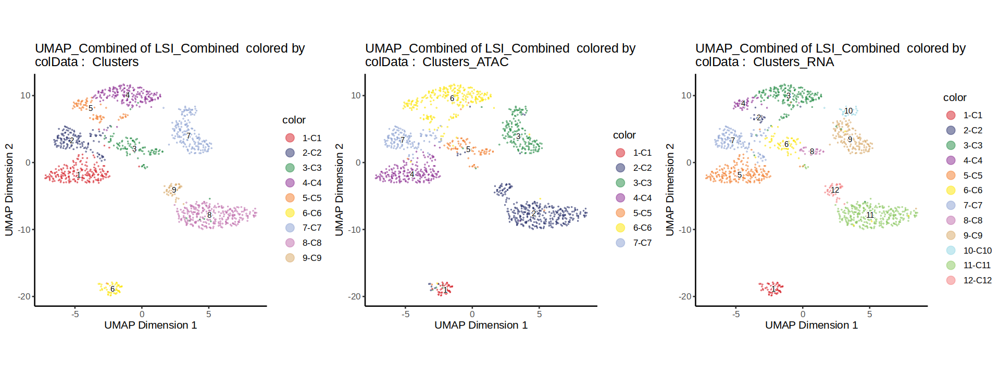

In [88]:
options(repr.plot.width=16, repr.plot.height=6)
ggAlignPlots(p1, p2, p3, type = "h")

In [89]:
plotPDF(p1,p2,p3, name = "Plot-UMAP-OnCombined_Umap-All_diff_Clusters.pdf",
        ArchRProj = Aoib_w15_proj_multiome, addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



In [7]:
#Aoib_w15_proj_multiome <- loadArchRProject('multiome_15W')

In [8]:
labelNew = names(table(getCellColData(Aoib_w15_proj_multiome)$Clusters))

In [9]:
labelNew

[1] "C1" "C2" "C3" "C4" "C5" "C6" "C7" "C8" "C9"

In [20]:
remapClust <- c(
    "C1" = "Enteric_neuronal",
    "C2" = "Enteric_glial",
    "C3" = "Immune_or_Endothelial",
    "C4" = "Stromal",
    "C5" = "Smooth_muscle",
    "C6" = "Ciliated_epithelial",
    "C7" = "Basal_and_pre_squamous_epithelial",
    "C8" = "BO_stem_like_transitional_gastric_or_intestinal_epithelial",
    "C9" = "BO_secretory_gastric_or_intestinal_epithelial"
)
remapClust <- remapClust[names(remapClust) %in% labelNew]

In [21]:
names(remapClust)

[1] "C1" "C2" "C3" "C4" "C5" "C6" "C7" "C8" "C9"

In [22]:
remapClust

C1 
                                          "Enteric_neuronal" 
                                                          C2 
                                             "Enteric_glial" 
                                                          C3 
                                     "Immune_or_Endothelial" 
                                                          C4 
                                                   "Stromal" 
                                                          C5 
                                             "Smooth_muscle" 
                                                          C6 
                                       "Ciliated_epithelial" 
                                                          C7 
                         "Basal_and_pre_squamous_epithelial" 
                                                          C8 
"BO_stem_like_transitional_gastric_or_intestinal_epithelial" 
                                                          C9 
             "BO_secretory_gastric_or_intestinal_epithelial"

In [23]:
labelNew2 <- mapLabels(labelNew, oldLabels = names(remapClust), newLabels = remapClust)
labelNew2

[1] "Enteric_neuronal"                                          
[2] "Enteric_glial"                                             
[3] "Immune_or_Endothelial"                                     
[4] "Stromal"                                                   
[5] "Smooth_muscle"                                             
[6] "Ciliated_epithelial"                                       
[7] "Basal_and_pre_squamous_epithelial"                         
[8] "BO_stem_like_transitional_gastric_or_intestinal_epithelial"
[9] "BO_secretory_gastric_or_intestinal_epithelial"

In [24]:
Aoib_w15_proj_multiome$Clusters2 <- mapLabels(Aoib_w15_proj_multiome$Clusters, newLabels = labelNew2, oldLabels = labelNew)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-14131554088cd-Date-2023-06-10_Time-15-26-37.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-14131554088cd-Date-2023-06-10_Time-15-26-37.log



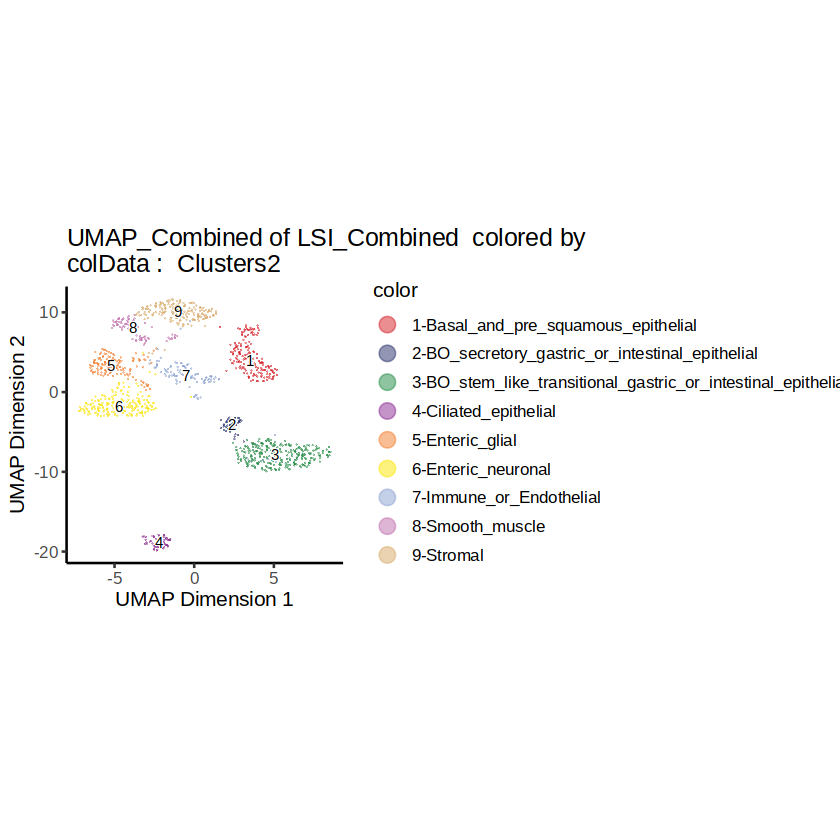

In [25]:
p1_new <- plotEmbedding(ArchRProj = Aoib_w15_proj_multiome, 
                    colorBy = "cellColData", 
                    name = "Clusters2", 
                    embedding = "UMAP_Combined", 
                    alpha=0.5,
                    size=1)+ 
    theme_classic(base_size=12) + 
    guides(colour = guide_legend(override.aes = list(size=4))) 
p1_new

In [26]:
plotPDF(p1_new, name = "Plot-UMAP-CellAnnotation.pdf",
        ArchRProj = Aoib_w15_proj_multiome, addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1413156bddf68-Date-2023-06-10_Time-15-27-32.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1413156bddf68-Date-2023-06-10_Time-15-27-32.log



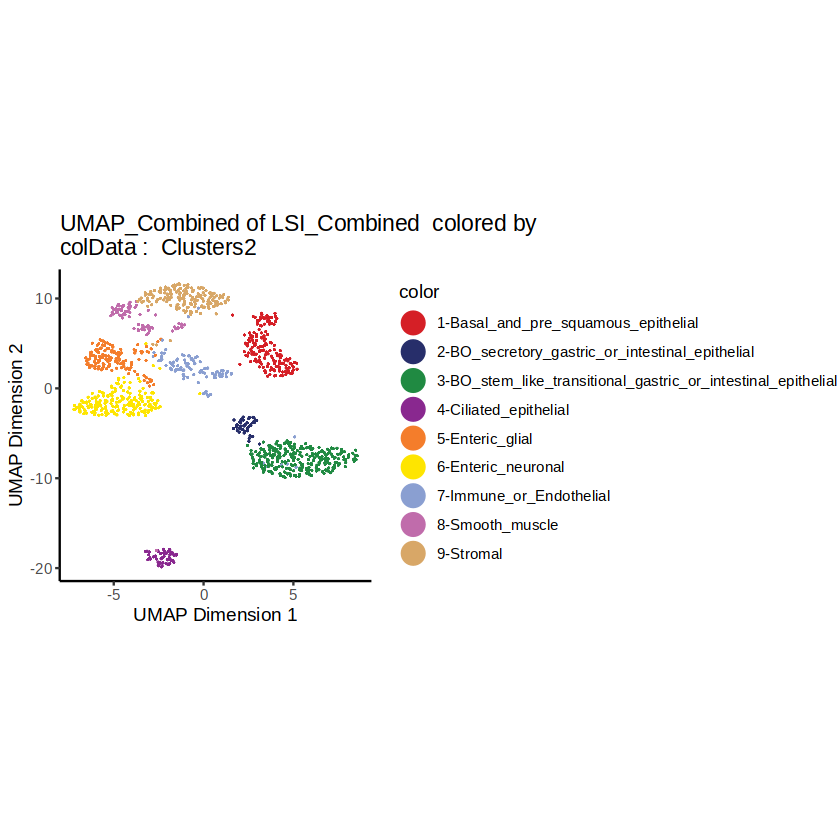

In [27]:
plot2 <- plotEmbedding(
    Aoib_w15_proj_multiome, 
    colorBy = "cellColData", 
    name = "Clusters2", 
    embedding = "UMAP_Combined",
    #name = "Clusters",
    #pal = clustPal,
    labelMeans=FALSE,
    size=1.5,
    baseSize=1,
    plot = "points"
)  +
    theme_classic() +
    guides(colour = guide_legend(override.aes = list(size=6))) 
plot2
ggsave(filename = 'UMAP_15_Week_cluster_annotated.png',width=8, height=8,device='png', dpi=700)

In [28]:
saveArchRProject(Aoib_w15_proj_multiome)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W 
samples(1): multiome_15W
sampleColData names(1): ArrowFiles
cellColData names(24): Sample TSSEnrichment ... Clusters_RNA Clusters2
numberOfCells(1): 1240
medianTSS(1): 10.177
medianFrags(1): 22201.5

# 3. Assigning Clusters with Gene Scores
We can try to assign biological labels to these clusters using marker genes of known hematopoietic regulators. First, we add imputation weights using [MAGIC](https://github.com/KrishnaswamyLab/MAGIC) to help smooth the dropout noise in our gene scores.



In [4]:
Aoib_w15_proj_multiome <- addImputeWeights(Aoib_w15_proj_multiome, reducedDims='LSI_Combined')

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-12b1332221cdd-Date-2023-06-08_Time-21-16-35.log
If there is an issue, please report to github with logFile!

2023-06-08 21:16:35 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



Now we can overlay our marker gene scores on our 2D UMAP embedding.

In [5]:
markerGenes  <- c(
    "SOX10",
"HNF4A",
"ERBB3",
"NOTCH1",
"NCAM1",
"VIP",
"SLC18A1"
  )

p <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_ATAC",
    imputeWeights = getImputeWeights(Aoib_w15_proj_multiome)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-12b133acb44c2-Date-2023-06-08_Time-21-16-39.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2023-06-08 21:16:42 : 

1 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-12b133acb44c2-Date-2023-06-08_Time-21-16-39.log



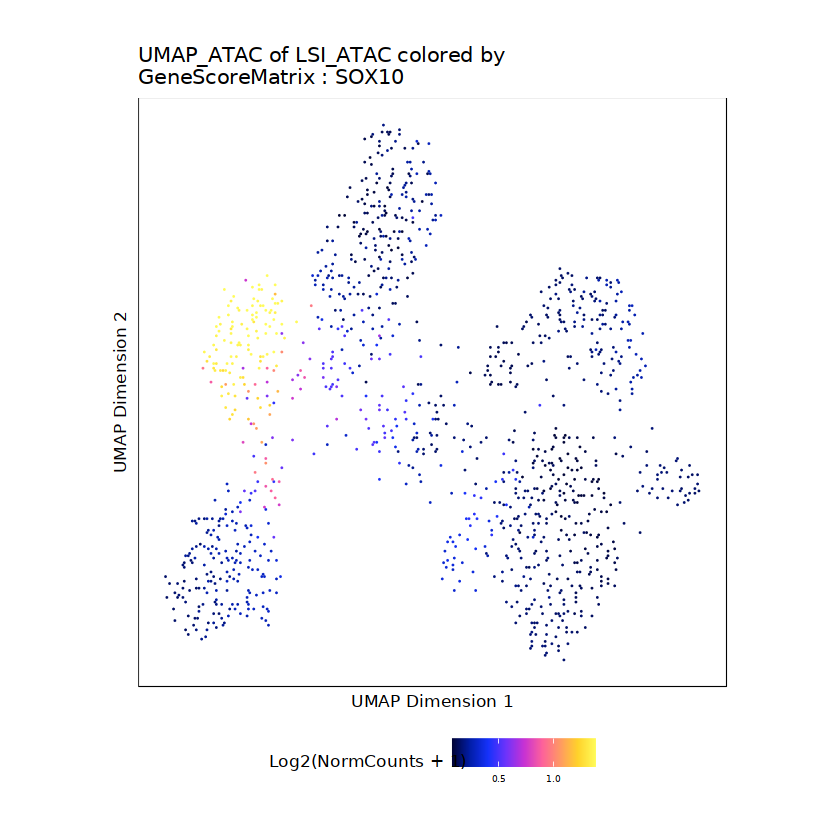

In [6]:
p$SOX10

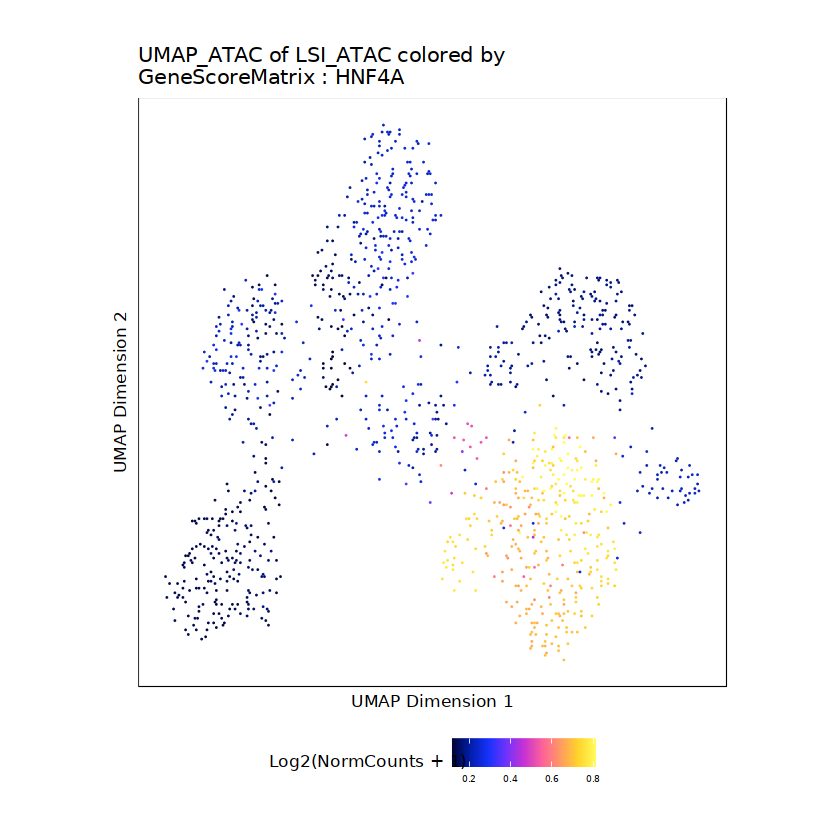

In [7]:
p$HNF4A

In [8]:
markerGenes  <- c(
    "SOX10",
"HNF4A",
"ERBB3",
"NOTCH1",
"NCAM1",
"VIP",
"SLC18A1"
  )

p <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_Combined",
    imputeWeights = getImputeWeights(Aoib_w15_proj_multiome)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-12b136051287e-Date-2023-06-08_Time-21-16-46.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2023-06-08 21:16:47 : 

1 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-12b136051287e-Date-2023-06-08_Time-21-16-46.log



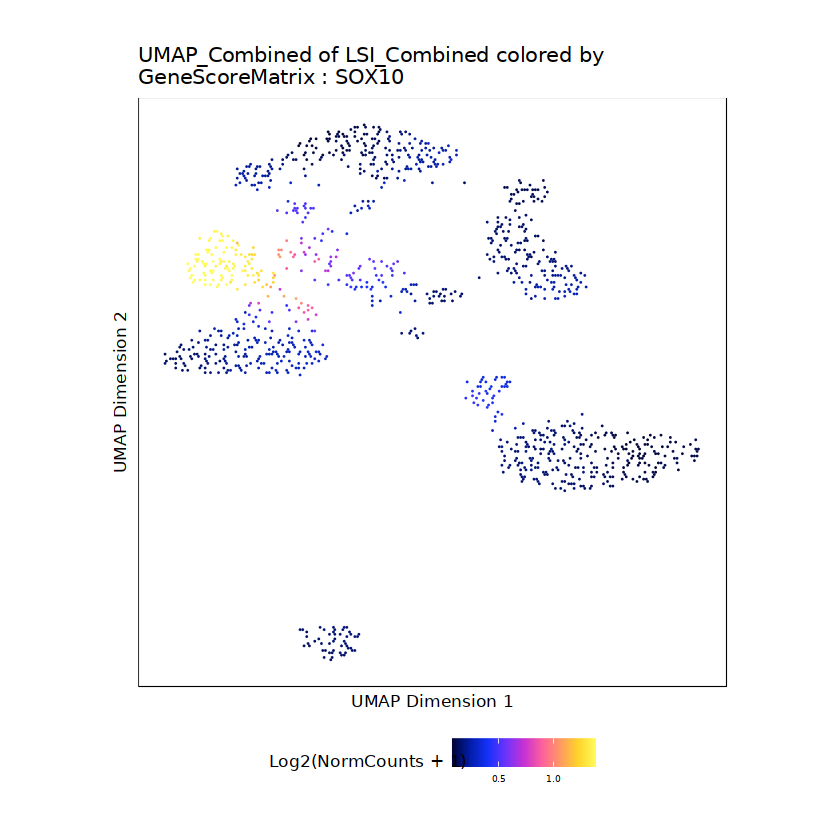

In [9]:
p$SOX10

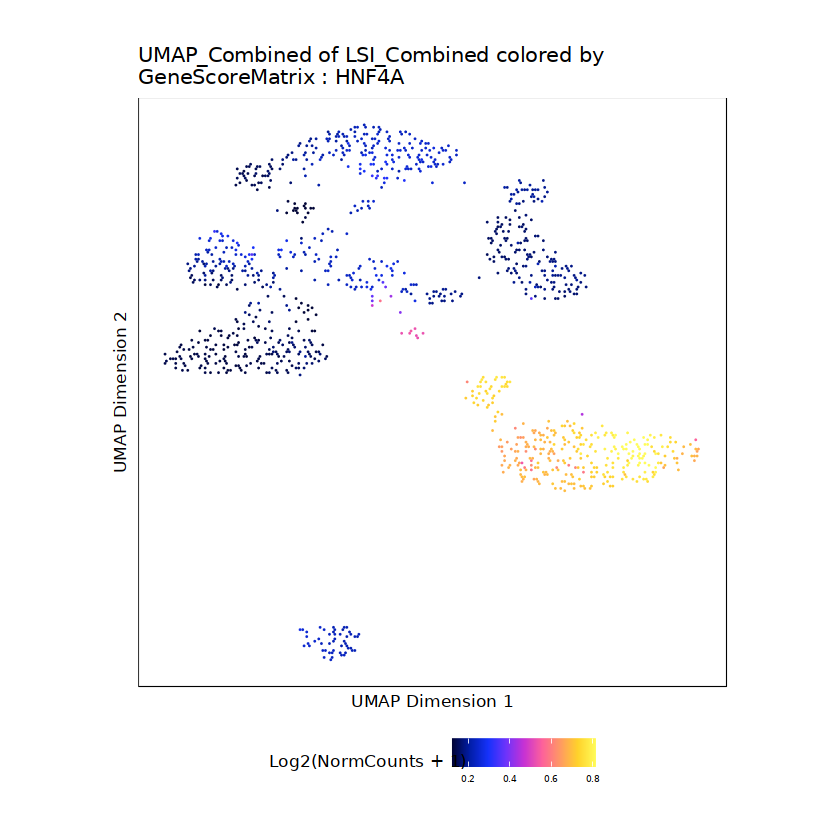

In [10]:
p$HNF4A

In [11]:
getAvailableMatrices(Aoib_w15_proj_multiome)

[1] "GeneExpressionMatrix" "GeneScoreMatrix"      "TileMatrix"

## 3.1 Visualizing Genome Browser Tracks
In addition to plotting gene scores per cell as a UMAP overlay, we can browse the local chromatin accessibility at these marker genes on a per cluster basis with genome browser tracks. To do this, we use the plotBrowserTrack() function which will create a list of plots, one for each of the genes specified by markerGenes.

In [97]:
p <- plotBrowserTrack(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Clusters", 
    geneSymbol = markerGenes, 
    upstream = 50000,
    downstream = 50000
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-2b38861f9d399f-Date-2022-08-31_Time-17-49-54.log
If there is an issue, please report to github with logFile!

2022-08-31 17:49:54 : Validating Region, 0.002 mins elapsed.



GRanges object with 7 ranges and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]    chr22   37970686-37987422      - |        6663       SOX10
  [2]    chr20   44355700-44434596      + |        3172       HNF4A
  [3]    chr12   56079857-56103505      + |        2065       ERBB3
  [4]     chr9 136494444-136545862      - |        4851      NOTCH1
  [5]    chr11 112961247-113278436      + |        4684       NCAM1
  [6]     chr6 152750798-152759765      + |        7432         VIP
  [7]     chr8   20144855-20183206      - |        6570     SLC18A1
  -------
  seqinfo: 24 sequences from hg38 genome


2022-08-31 17:49:54 : Adding Bulk Tracks (1 of 7), 0.004 mins elapsed.

Getting Region From Arrow Files 1 of 1

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-08-31 17:49:55 : Adding Gene Tracks (1 of 7), 0.011 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-08-31 17:49:55 : Plotting, 0.016 mins elapsed.

2022-08-31 17:49:57 : Adding Bulk Tracks (2 of 7), 0.051 mins elapsed.

Getting Region From Arrow Files 1 of 1

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-08-31 17:49:58 : Adding Gene Tracks (2 of 7), 0.058 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-08-31 17:49:58 : Plotting, 0.062 mins elapsed.

2022-08-31 17:49:59 : Adding Bulk Tracks (3 of 7), 0.086 mins elapsed.

Getting Region From Arrow 

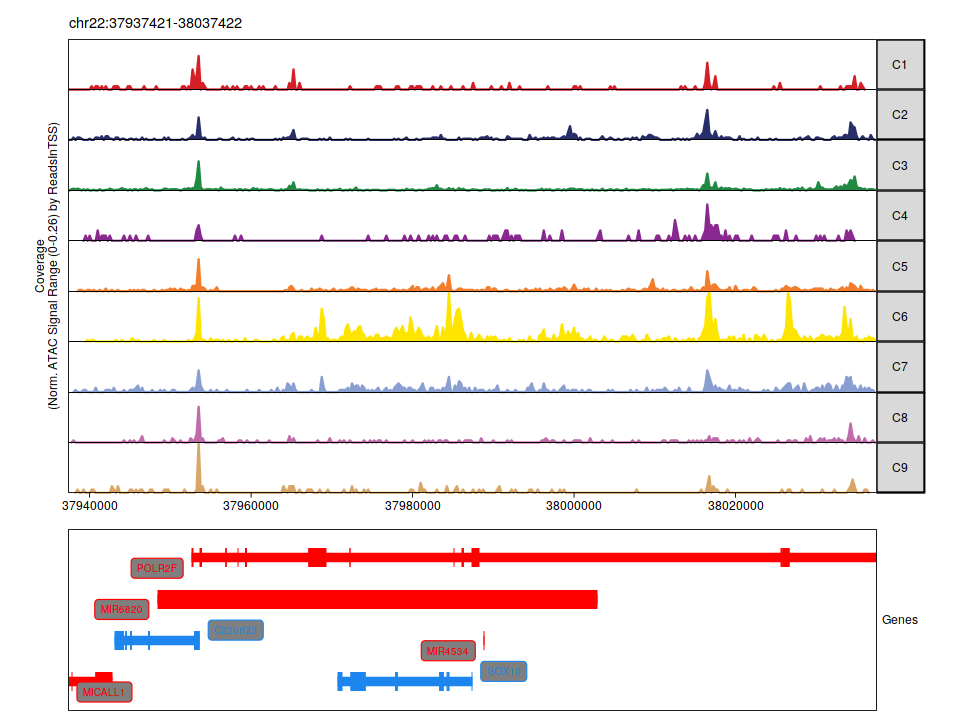

In [98]:
options(repr.plot.width=8, repr.plot.height=6)
grid::grid.draw(p$SOX10)

In [99]:
geneName = 'HNF4A'
p_gene <- plotBrowserTrack(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Clusters", 
    geneSymbol = geneName, 
    upstream = 50000,
    downstream = 50000
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-2b38864262c29a-Date-2022-08-31_Time-17-50-12.log
If there is an issue, please report to github with logFile!

2022-08-31 17:50:12 : Validating Region, 0.002 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames            ranges strand |     gene_id      symbol
         <Rle>         <IRanges>  <Rle> | <character> <character>
  [1]    chr20 44355700-44434596      + |        3172       HNF4A
  -------
  seqinfo: 24 sequences from hg38 genome


2022-08-31 17:50:12 : Adding Bulk Tracks (1 of 1), 0.003 mins elapsed.

Getting Region From Arrow Files 1 of 1

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-08-31 17:50:13 : Adding Gene Tracks (1 of 1), 0.01 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-08-31 17:50:13 : Plotting, 0.015 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-2b38864262c29a-Date-2022-08-31_Time-17-50-12.log



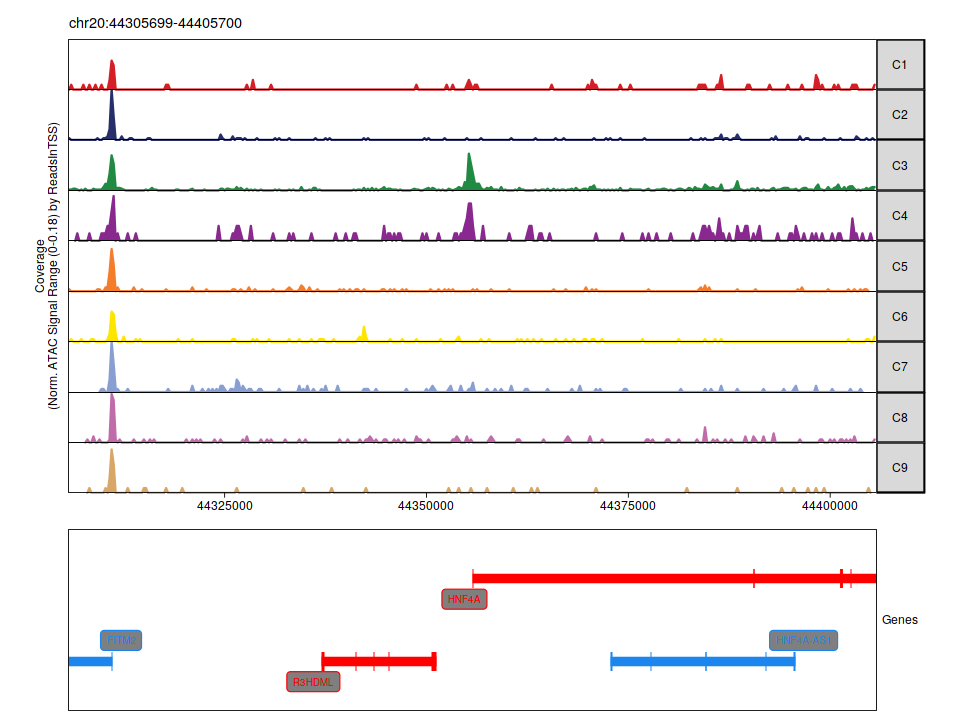

In [100]:
grid::grid.draw(p$HNF4A)

## 3.2 Identifying marker genes with GeneScoreMatrix

In addition to using prior knowledge of relevant marker genes for annotation of clusters, ArchR enables unbiased identification of marker features for any given cell groupings (for example, clusters). These features can be anything - peaks, genes (based on gene scores), or transcription factor motifs (based on chromVAR deviations). ArchR does this using the `getMarkerFeatures()` function which can take as input any matrix via the `useMatrix` parameter and it identifies features unique to the groups indicated by the `groupBy` parameter. If the `useMatrix` parameter is set to “GeneScoreMatrix”, then the function will identify the genes that appear to be uniquely active in each cell type. This provides an unbiased way of seeing which genes are predicted to be active in each cluster and can aid in cluster annotation.

As mentioned above, the same `getMarkerFeatures()` function can be used with any matrix stored in the Arrow files to identify features that are specific to certain cell groups. This is accomplished via the useMatrix parameter. For example, `useMatrix = "TileMatrix"` would identify genomic regions that are highly specific to a certain cell group and `useMatrix = "PeakMatrix"` would identify peaks that are highly specific to a certain cell group. Examples of how to use the `getMarkerFeatures()` function on other feature types are provided in later chapters.

#### How does marker feature identification happen?

This process of marker feature identification hinges on the selection of a group of bias-matched background cells for each cell group. Across all features, each cell group is compared to its own background group of cells to determine if the given cell group has significantly higher accessibility.

<img src="documentFigures/markerFeature_schematic.png" width="40%">

The selection of these background cell groups is critical to the success of this process and is performed across the multi-dimensional space provided by the user via the bias argument to `getMarkerFeatures()`. For each cell in the cell group, `ArchR` finds the nearest neighbor cell across the provided multi-dimensional space that is not a member of the given cell group and adds it to the background group of cells. In this way, `ArchR` creates a group of bias-matched cells that is as similar as possible to the given cell group, thus enabling a more robust determination of significance even if the group of cells is small.

The way ArchR does this is by taking all of the dimensions provided via the bias parameter and quantile normalizing their values to distribute the variance of each dimension across the same relative scale.


To identify marker genes based on gene scores, we call the `getMarkerFeatures()` function with `useMatrix = "GeneScoreMatrix"`. We specify that we want to know the cluster-specific features with `groupBy = "Clusters"` which tells ArchR to use the `“Clusters”` column in `cellColData` to stratify cell groups.


In [ ]:
Aoib_w15_proj_multiome$ClustersATAC

In [101]:
markersGS <- getMarkerFeatures(
    ArchRProj = Aoib_w15_proj_multiome, 
    useMatrix = "GeneScoreMatrix", 
    groupBy = "Clusters_ATAC",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon",
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-2b38862ddb826a-Date-2022-08-31_Time-17-50-17.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

Pairwise Test C1 : Seqnames chr1

Pairwise Test C1 : Seqnames chr10

Pairwise Test C1 : Seqnames chr11

Pairwise Test C1 : Seqnames chr12

Pairwise Test C1 : Seqnames chr13

Pairwise Test C1 : Seqnames chr14

Pairwise Test C1 : Seqnames chr15

Pairwise Test C1 : Seqnames chr16

Pairwise Test C1 : Seqnames chr17

Pairwise Test C1 : Seqnames chr18

Pairwise Test C1 : Seqnames chr19

Pairwise Test C1 : Seqnames chr2

Pairwise Test C1 : Seqnames chr20

Pairwise Test C1 : Seqnames chr21

Pairwise Test C1 : Seqnames chr22

Pairwise Test C1 : Seqnames chr3

Pairwise Test C1 : Seqnames chr4

Pairwise Test C1 : Seqnames chr5

Pairwise Test C1 : Seqnames chr6

Pairwise Test C1 : Seqnames chr7

Pairwise Test C1 : Seqnames chr8

Pairwise Test C1 : Seqnames chr9

Pairwise Test C1 : Seqnames chrX

Pairwi

This function returns a `SummarizedExperiment` object containing relevant information on the marker features identified. This type of return value is common in ArchR and is one of the key ways that ArchR enables downstream data analysis. `SummarizedExperiment` objects are similar to a matrix where rows represent features of interest (i.e. genes) and columns represent samples. A `SummarizedExperiment` object contains one or more assays, each represented by a matrix-like object of numeric data, and metadata that applies to the rows or columns of the assays matrices. It is beyond the scope of this tutorial to dive into `SummarizedExperiment` objects but check out the bioconductor page if you need more information.

We can get a list of DataFrame objects, one for each of our clusters, containing the relevant marker features using the `getMarkers()` function:

In [16]:
markersGS

ERROR: Error in eval(expr, envir, enclos): object 'markersGS' not found


In [ ]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.01 & Log2FC >= 1.25")
markerList$C6

In [ ]:
for(i in c(1:max(length(names(markerList))))){
    write.table(markerList[[i]], file=paste0("markerGenes_GeneScore_ATAC_Cluster/Aoib_GeneScore_multiome_15W_Upregulated_LFC_1.25_ATAC_Cluster",i,".tsv"), sep="\t", quote=FALSE, col.names=NA)
}

# 4. GeneExpression Matrix

It is a Mutliome so we do not need to integgrate the value

In [12]:
getAvailableMatrices(Aoib_w15_proj_multiome)

[1] "GeneExpressionMatrix" "GeneScoreMatrix"      "TileMatrix"

In [13]:
markersGE <- getMarkerFeatures(
    ArchRProj = Aoib_w15_proj_multiome, 
    useMatrix = "GeneExpressionMatrix", 
    groupBy = "Clusters_RNA",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon",
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-12b1348f4b59f-Date-2023-06-08_Time-21-16-53.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

Pairwise Test C1 : Seqnames chr1

Pairwise Test C1 : Seqnames chr10

Pairwise Test C1 : Seqnames chr11

Pairwise Test C1 : Seqnames chr12

Pairwise Test C1 : Seqnames chr13

Pairwise Test C1 : Seqnames chr14

Pairwise Test C1 : Seqnames chr15

Pairwise Test C1 : Seqnames chr16

Pairwise Test C1 : Seqnames chr17

Pairwise Test C1 : Seqnames chr18

Pairwise Test C1 : Seqnames chr19

Pairwise Test C1 : Seqnames chr2

Pairwise Test C1 : Seqnames chr20

Pairwise Test C1 : Seqnames chr21

Pairwise Test C1 : Seqnames chr22

Pairwise Test C1 : Seqnames chr3

Pairwise Test C1 : Seqnames chr4

Pairwise Test C1 : Seqnames chr5

Pairwise Test C1 : Seqnames chr6

Pairwise Test C1 : Seqnames chr7

Pairwise Test C1 : Seqnames chr8

Pairwise Test C1 : Seqnames chr9

Pairwise Test C1 : Seqnames chrX

Pairwis

This function returns a `SummarizedExperiment` object containing relevant information on the marker features identified. This type of return value is common in ArchR and is one of the key ways that ArchR enables downstream data analysis. `SummarizedExperiment` objects are similar to a matrix where rows represent features of interest (i.e. genes) and columns represent samples. A `SummarizedExperiment` object contains one or more assays, each represented by a matrix-like object of numeric data, and metadata that applies to the rows or columns of the assays matrices. It is beyond the scope of this tutorial to dive into `SummarizedExperiment` objects but check out the bioconductor page if you need more information.

We can get a list of DataFrame objects, one for each of our clusters, containing the relevant marker features using the `getMarkers()` function:

In [14]:
markersGE

class: SummarizedExperiment 
dim: 36438 12 
metadata(2): MatchInfo Params
assays(7): Log2FC Mean ... AUC MeanBGD
rownames(36438): 1 2 ... 36437 36438
rowData names(6): seqnames idx ... name strand
colnames(12): C1 C2 ... C11 C12
colData names(0):

In [15]:
markerList <- getMarkers(markersGE, cutOff = "FDR <= 0.01 & Log2FC >= 1.25")
markerList$C6

DataFrame with 1113 rows and 9 columns
      seqnames     idx     start       end    name  strand    Log2FC
         <Rle> <array>   <array>   <array> <array> <array> <numeric>
15530    chr17    1558  64390859  64390860  PECAM1       3   6.29215
9499     chr13     704 110307130 110307157  COL4A1       3   4.84421
24453     chr3     722  64687678  64688000 ADAMTS9       3   5.42689
22621    chr21     345  38498441  38661780     ERG       3   5.55494
32077     chr7    1284 131556608 131556628   PODXL       3   5.93246
...        ...     ...       ...       ...     ...     ...       ...
21962    chr20     650  45972202  45972203  ZNF335       3   1.92336
24507     chr3     776  72888045  72888046  GXYLT2       3   2.51882
30784     chr6    1818 170291077 170291078    DLL1       3   2.43971
14999    chr17    1027  41518889  41521719   KRT15       3   1.96406
28859     chr5    1703 177351646 177351668   LMAN2       3   1.57885
              FDR  MeanDiff
        <numeric> <numeric>
15530 5.

In [ ]:
for(i in c(1:max(length(names(markerList))))){
    write.table(markerList[[i]], file=paste0("markerGenes_GeneExpression_RNA_Cluster/Aoib_GeneExpression_multiome_15W_Upregulated_LFC_1.25_Cluster",i,".tsv"), sep="\t", quote=FALSE, col.names=NA)
}

we add impute weights to our project:

In [113]:
markerGenes  <- c(
    "E2F7", 
    "HNF4A", #Parenchymal
    "ONECUT1", 
    "CRB1",
    "CPEB4", #Monocytes
    "PAX5",
    "NDC1",
    "STAB2",
    "GATA6",
    "PTPRC"
    #"MAS1" #TCells
  )

p1 <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneExpressionMatrix", 
    name = markerGenes, 
    continuousSet = "horizonExtra",
    embedding = "UMAP_Combined"
    #imputeWeights = getImputeWeights(aoibAggrproj)
)


p2 <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    continuousSet = "horizonExtra",
    embedding = "UMAP_Combined"
    #imputeWeights = getImputeWeights(aoibAggrproj)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2b388672fc64bd-Date-2022-08-31_Time-19-11-52.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneExpressionMatrix

Getting Matrix Values...

2022-08-31 19:11:53 : 

1 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2b388672fc64bd-Date-2022-08-31_Time-19-11-52.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2b38862094d38a-Date-2022-08-31_Time-19-11-55.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-08-31 19:11:55 : 

1 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2b38862094d38a-Date-2022-08-31_Time-19-11-55.lo

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = F

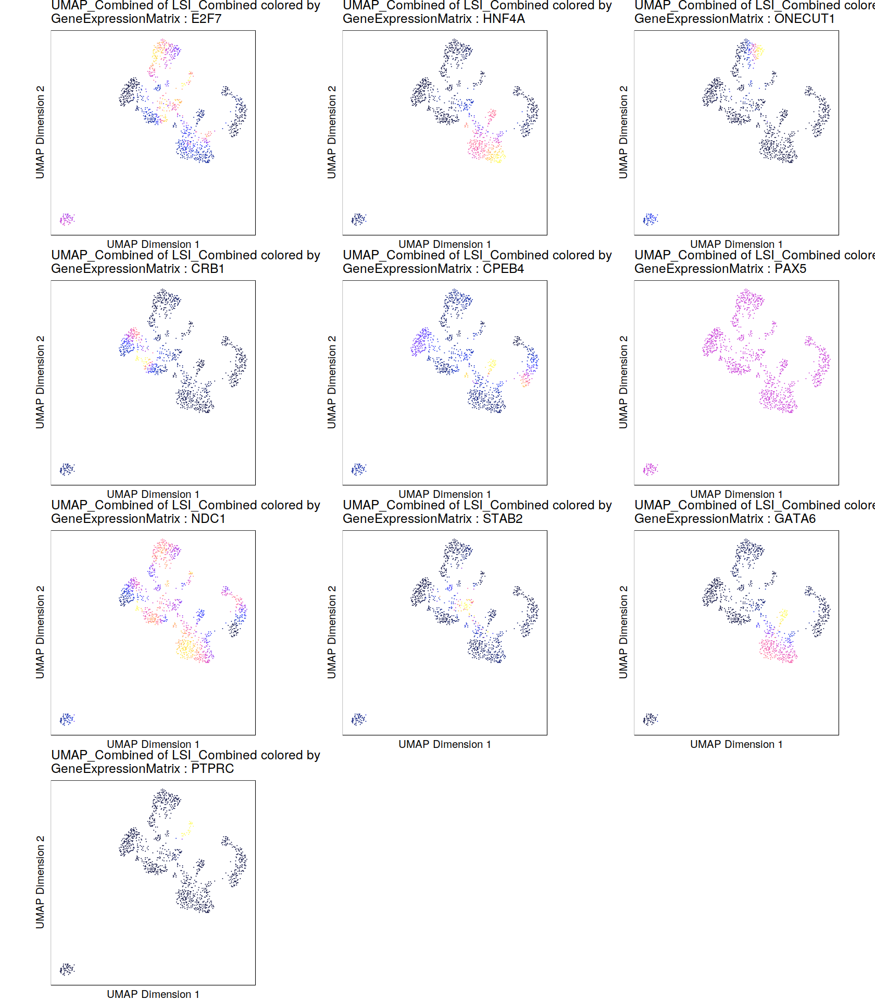

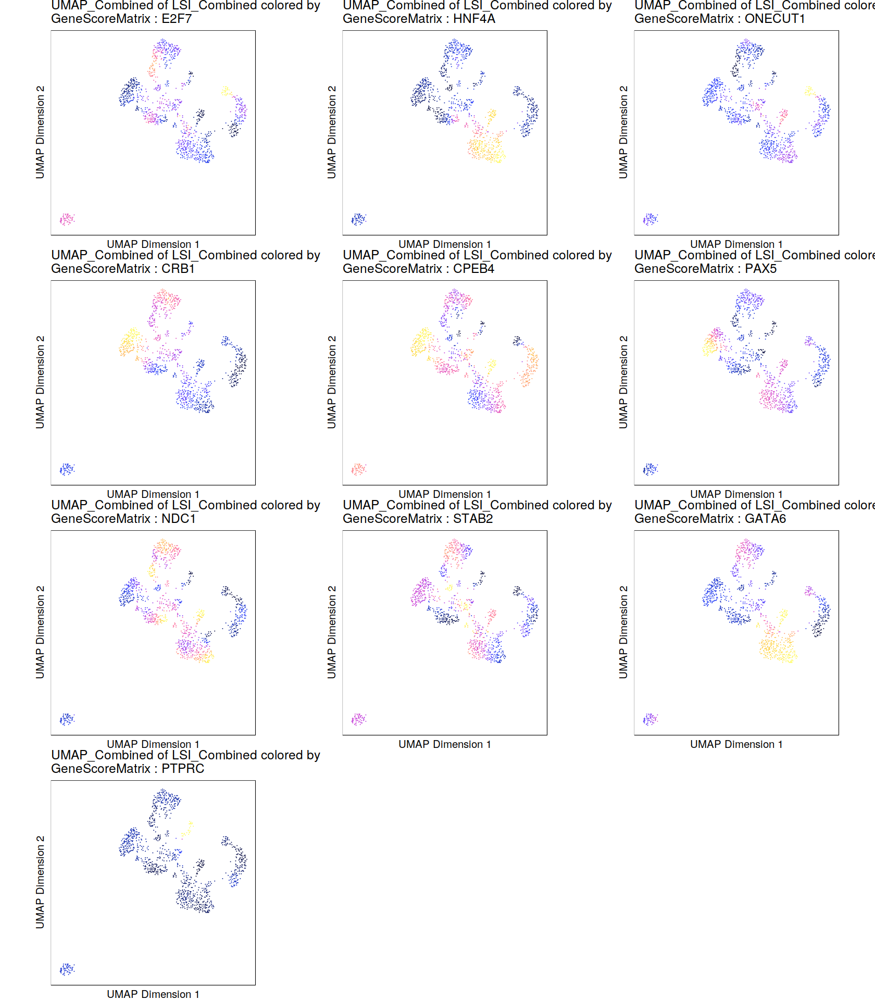

In [114]:
options(repr.plot.width=14, repr.plot.height=16)
p1c <- lapply(p1, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 12) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})

p2c <- lapply(p2, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 12) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})

do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c))

In [115]:
pdf('multiome_15W/Plots/geneExpression_Combined_UMAP.pdf')
do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c))
dev.off()

X11cairo 
       2

In [116]:
markerGenes  <- c(
    "STAB2", 
    "HNF4A", #Parenchymal
    "SHANK2", 
    "GATA6",
    "HHIP", #Monocytes
    "CSF1R",
    "PTPRC",
    "GATA2"
  )

p1 <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneExpressionMatrix", 
    name = markerGenes, 
    continuousSet = "horizonExtra",
    embedding = "UMAP_Combined"
    #imputeWeights = getImputeWeights(aoibAggrproj)
)


p2 <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    continuousSet = "horizonExtra",
    embedding = "UMAP_Combined"
    #imputeWeights = getImputeWeights(aoibAggrproj)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2b388613733c38-Date-2022-08-31_Time-19-12-07.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneExpressionMatrix

Getting Matrix Values...

2022-08-31 19:12:07 : 

1 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2b388613733c38-Date-2022-08-31_Time-19-12-07.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2b38867658b4a4-Date-2022-08-31_Time-19-12-09.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-08-31 19:12:09 : 

1 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2b38867658b4a4-Date-2022-08-31_Time-19-12-09.log



Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = F

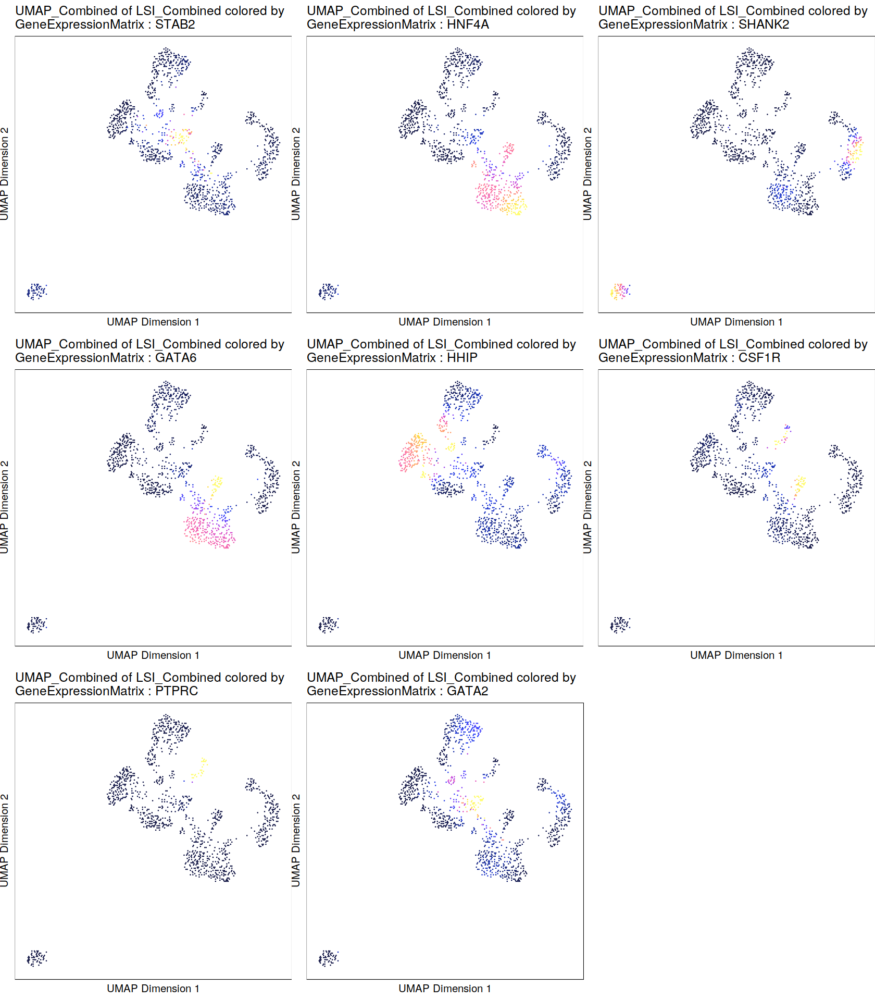

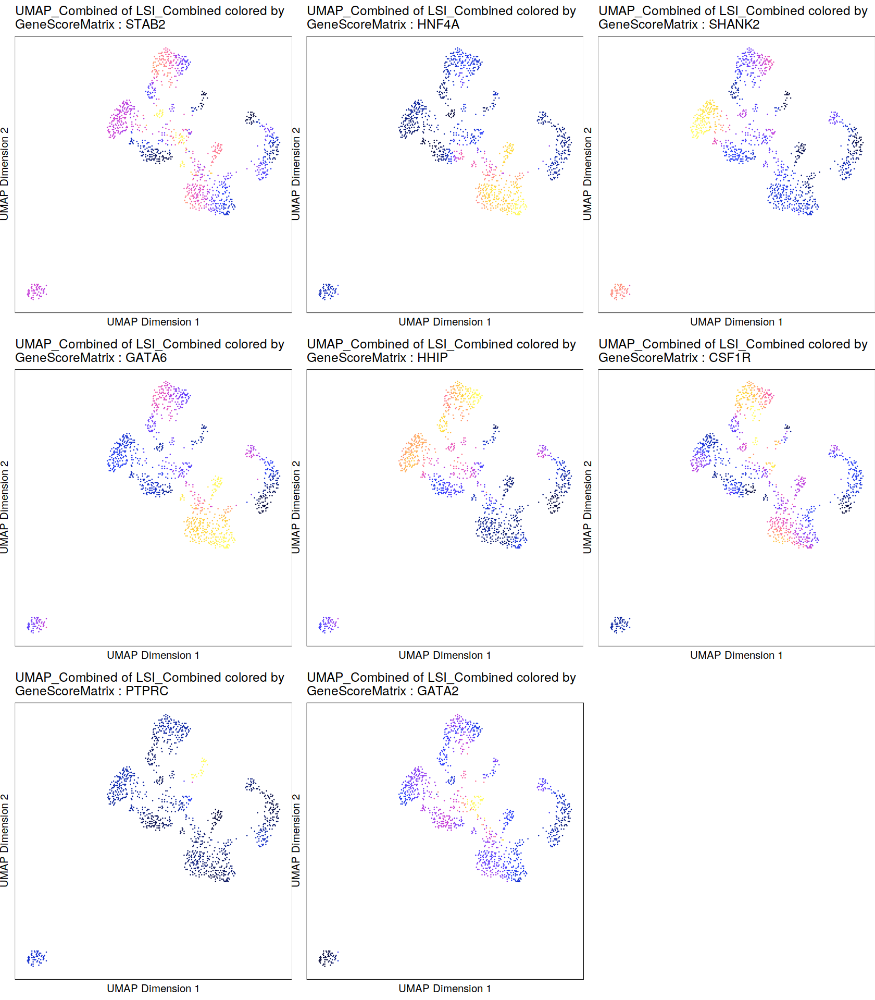

In [117]:
options(repr.plot.width=14, repr.plot.height=16)
p1c <- lapply(p1, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 12) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})

p2c <- lapply(p2, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 12) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})

do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c))

In [118]:
pdf('multiome_15W/Plots/geneExpression_Combined_UMAP_selected_genes.pdf')
do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c))
dev.off()

X11cairo 
       2

In [4]:
markersGE <- getMarkerFeatures(
    ArchRProj = Aoib_w15_proj_multiome, 
    useMatrix = "GeneExpressionMatrix", 
    groupBy = "Clusters",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon",
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-141311a67e2ea-Date-2023-06-08_Time-21-25-33.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

Pairwise Test C1 : Seqnames chr1

Pairwise Test C1 : Seqnames chr10

Pairwise Test C1 : Seqnames chr11

Pairwise Test C1 : Seqnames chr12

Pairwise Test C1 : Seqnames chr13

Pairwise Test C1 : Seqnames chr14

Pairwise Test C1 : Seqnames chr15

Pairwise Test C1 : Seqnames chr16

Pairwise Test C1 : Seqnames chr17

Pairwise Test C1 : Seqnames chr18

Pairwise Test C1 : Seqnames chr19

Pairwise Test C1 : Seqnames chr2

Pairwise Test C1 : Seqnames chr20

Pairwise Test C1 : Seqnames chr21

Pairwise Test C1 : Seqnames chr22

Pairwise Test C1 : Seqnames chr3

Pairwise Test C1 : Seqnames chr4

Pairwise Test C1 : Seqnames chr5

Pairwise Test C1 : Seqnames chr6

Pairwise Test C1 : Seqnames chr7

Pairwise Test C1 : Seqnames chr8

Pairwise Test C1 : Seqnames chr9

Pairwise Test C1 : Seqnames chrX

Pairwis

This function returns a `SummarizedExperiment` object containing relevant information on the marker features identified. This type of return value is common in ArchR and is one of the key ways that ArchR enables downstream data analysis. `SummarizedExperiment` objects are similar to a matrix where rows represent features of interest (i.e. genes) and columns represent samples. A `SummarizedExperiment` object contains one or more assays, each represented by a matrix-like object of numeric data, and metadata that applies to the rows or columns of the assays matrices. It is beyond the scope of this tutorial to dive into `SummarizedExperiment` objects but check out the bioconductor page if you need more information.

We can get a list of DataFrame objects, one for each of our clusters, containing the relevant marker features using the `getMarkers()` function:

In [5]:
markersGE

class: SummarizedExperiment 
dim: 36438 9 
metadata(2): MatchInfo Params
assays(7): Log2FC Mean ... AUC MeanBGD
rownames(36438): 1 2 ... 36437 36438
rowData names(6): seqnames idx ... name strand
colnames(9): C1 C2 ... C8 C9
colData names(0):

In [6]:
markerList <- getMarkers(markersGE, cutOff = "FDR <= 0.01 & Log2FC >= 1.25")
markerList$C6

DataFrame with 822 rows and 9 columns
      seqnames     idx     start       end     name  strand    Log2FC
         <Rle> <array>   <array>   <array>  <array> <array> <numeric>
3663     chr10     254  22928023  22928064    ARMC3       3   8.92650
4085     chr10     676  73291734  73358859   CFAP70       3   8.18700
5332     chr11     530  30992685  31369774    DCDC1       3   8.99642
8222     chr12    1355  96489576  96489577   CFAP54       3   7.00756
12847    chr16     524  21159440  21159441    DNAH3       3   8.09276
...        ...     ...       ...       ...      ...     ...       ...
27174     chr5      18    693351    693352     TPPP       3   3.03780
27348     chr5     192  17216822  17217631    BASP1       3   1.71918
37        chr1      37   1092173   1116098 C1orf159       3   1.79013
25880     chr4     257  20700412  20700476   PACRGL       3   1.82781
31848     chr7    1055 105679161 105876604  ATXN7L1       3   1.33888
             FDR  MeanDiff
       <numeric> <numeric

In [7]:
for(i in c(1:max(length(names(markerList))))){
    write.table(markerList[[i]], file=paste0("markerGenes_GeneExpression_Combined_Cluster/Aoib_GeneExpression_multiome_15W_Upregulated_LFC_1.25_Cluster",i,".tsv"), sep="\t", quote=FALSE, col.names=NA)
}

# 5. Calling Peaks with ArchR

Calling peaks is one of the most fundamental processes in ATAC-seq data analysis. Because per-cell scATAC-seq data is essentially binary (accessible or not accessible), we cannot call peaks on an individual cell basis. For this reason, we defined groups of cells, typically clusters, in a previous chapter. Moreover, we created pseudo-bulk replicates to allow us to assess the reproducibility of our peak calls.

We first introduced a strategy for [iterative overlap peak merging in 2018](https://science.sciencemag.org/content/362/6413/eaav1898). Other peak merging strategies suffer from a few key issues that we outline below.

### Fixed-width vs Variable-width Peaks

We use 501-bp fixed-width peaks because they make downstream computation easier as peak length does not need to be normalized. Moreover, the vast majority of peaks in ATAC-seq are less than 501-bp wide. Using variable-width peaks also makes it difficult to merge peak calls from multiple samples. In general, we do not feel that the potential benefit derived from using variable-width peaks outweighs the costs. More broadly, most analyses are stable with respect to the peak set or peak style used.


### Iterative Overlap In ArchR

Iterative overlap removal avoids the issues mentioned above. Peaks are first ranked by their significance. The most significant peak is retained and any peak that directly overlaps with the most significant peak is removed from further analysis. Then, of the remaining peaks, this process is repeated until no more peaks exist. This avoids daisy-chaining and still allows for use of fixed-width peaks.

<img src='documentFigures/peakCalling_IterativeOverlap.png' width='40%'>


As mentioned above, we generate a reproducible peak set in ArchR using the `addReproduciblePeakSet()` function. By default ArchR attempts to call peaks using `MACS2`; however, ArchR also implements its own native peak caller which could be used when `MACS2` cannot be installed (for example, we have not successfully installed `MACS2` on Windows) - this alternative peak calling method is described in the next section.

To call peaks using `MACS2`, ArchR must be able to find the `MACS2` executable. First, ArchR looks in your PATH environment variable. If this is unsuccessful, ArchR attempts to determine if you have installed MACS2 with either `pip` or `pip3`. If neither of these is successful, ArchR gives up and provides an error message. If you have MACS2 installed and ArchR cannot find it, you should provide the path to the `addReproduciblePeakSet()` function via the `pathToMacs2` parameter.

With the path to `MACS2` identified, we can then create a reproducible merged peak set w/ MACS2 (~5-10 minutes). To avoid bias from pseudo-bulk replicates that have very few cells, we can provide a cutoff for the upper limit of the number of peaks called per cell via the `peaksPerCell` parameter. This prevents clusters with very few cells from contributing lots of low quality peaks to the merged peak set. There are many other parameters that can be tweaked in `addReproduciblePeakSet()`.

Each `ArchRProject` object can only contain a **single peak set**. As such, we assign the output of `addReproduciblePeakSet()` to our desired `ArchRProject`. If you would like to experiment with different peak sets, you must save a copy of your ArchRProject and thus also copy the Arrow files. While this does use more on-disk storage space, this is unavoidable given the structure of Arrow files and the storage of peak matrix information in the Arrow files.

In [6]:
pathToMacs2 <- findMacs2()

Searching For MACS2..

Found with $path!



In [7]:
pathToMacs2

[1] "macs2"

In [8]:
addArchRThreads(threads = 1)

Setting default number of Parallel threads to 1.



In [10]:
library(BSgenome.Hsapiens.UCSC.hg38)

Loading required package: BSgenome

Loading required package: rtracklayer


Attaching package: ‘rtracklayer’


The following object is masked from ‘package:igraph’:

    blocks


The following object is masked from ‘package:AnnotationHub’:

    hubUrl




In [15]:
Aoib_w15_proj_multiome <- addGroupCoverages(Aoib_w15_proj_multiome, groupBy = "Clusters2", verbose=FALSE)

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-18fb027cbc86-Date-2023-07-28_Time-11-31-58.log
If there is an issue, please report to github with logFile!

Basal_and_pre_squamous_epithelial (1 of 9) : CellGroups N = 2

BO_secretory_gastric_or_intestinal_epithelial (2 of 9) : CellGroups N = 2

BO_stem_like_transitional_gastric_or_intestinal_epithelial (3 of 9) : CellGroups N = 2

Ciliated_epithelial (4 of 9) : CellGroups N = 2

Enteric_glial (5 of 9) : CellGroups N = 2

Enteric_neuronal (6 of 9) : CellGroups N = 2

Immune_or_Endothelial (7 of 9) : CellGroups N = 2

Smooth_muscle (8 of 9) : CellGroups N = 2

Stromal (9 of 9) : CellGroups N = 2

2023-07-28 11:31:59 : Creating Coverage Files!, 0.021 mins elapsed.

2023-07-28 11:31:59 : Batch Execution w/ safelapply!, 0.021 mins elapsed.

Number of Cells = 135

Coverage File Exists!

Added Coverage Group

Added Metadata Group

Added ArrowCoverage Class

Added Coverage/Info

Added Coverage/Info/CellNames

Number of Cells = 40

Coverage 

In [16]:
addArchRThreads(threads = 1)

Setting default number of Parallel threads to 1.



In [17]:
Aoib_w15_proj_multiome <- addReproduciblePeakSet(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Clusters2", # We are calling with clusters defined by tiles, 
                           # but can be called with Cluster2 which is the cluster from snRNA-seq
    peakMethod = "Macs2",
    pathToMacs2 = pathToMacs2
)

ArchR logging to : ArchRLogs/ArchR-addReproduciblePeakSet-18fb07e513cbb-Date-2023-07-28_Time-11-47-53.log
If there is an issue, please report to github with logFile!

Calling Peaks with Macs2

2023-07-28 11:47:53 : Peak Calling Parameters!, 0.005 mins elapsed.



                                                                                                                Group
Basal_and_pre_squamous_epithelial                                                   Basal_and_pre_squamous_epithelial
BO_secretory_gastric_or_intestinal_epithelial                           BO_secretory_gastric_or_intestinal_epithelial
BO_stem_like_transitional_gastric_or_intestinal_epithelial BO_stem_like_transitional_gastric_or_intestinal_epithelial
Ciliated_epithelial                                                                               Ciliated_epithelial
Enteric_glial                                                                                           Enteric_glial
Enteric_neuronal                                                                                     Enteric_neuronal
Immune_or_Endothelial                                                                           Immune_or_Endothelial
Smooth_muscle                                           

2023-07-28 11:47:53 : Batching Peak Calls!, 0.005 mins elapsed.

2023-07-28 11:47:53 : Batch Execution w/ safelapply!, 0 mins elapsed.

2023-07-28 11:47:53 : Group 1 of 17, Calling Peaks with MACS2!, 0 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 2.7e+09 --name Basal_and_pre_squamous_epithelial._.Rep1-1 --treatment /home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/InsertionBeds/Basal_and_pre_squamous_epithelial._.Rep1-1.insertions.bed --outdir /home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/InsertionBeds --format BED --call-summits --keep-dup all --nomodel --nolambda --shift -75 --extsize 150 -q 0.1

2023-07-28 11:49:44 : Group 2 of 17, Calling Peaks with MACS2!, 1.845 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 2.7e+09 --name Basal_and_pre_squamous_epithelial._.Rep2-2 --treatment /home/mqbsxsm2/Rna-seq_Data-Analysis/Aoib

[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/Basal_and_pre_squamous_epithelial-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/BO_secretory_gastric_or_intestinal_epithelial-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/BO_stem_like_transitional_gastric_or_intestinal_epithelial-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/Ciliated_epithelial-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/Enteric_glial-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/Enteric_neuronal-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/Immune_or_Endothelial-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/Smooth_muscle-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W_v2/multiome_15W/PeakCalls/Stromal-reproduciblePeaks.gr.rds"


2023-07-28 12:10:32 : Creating Union Peak Set!, 22.649 mins elapsed.

Converged after 6 iterations!

Plotting Ggplot!

2023-07-28 12:10:38 : Finished Creating Union Peak Set (195162)!, 22.749 mins elapsed.



In [18]:
Aoib_w15_proj_multiome <- addPeakMatrix(Aoib_w15_proj_multiome, verbose=FALSE)

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-18fb0127201a7-Date-2023-07-28_Time-12-10-38.log
If there is an issue, please report to github with logFile!

2023-07-28 12:10:38 : Batch Execution w/ safelapply!, 0 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addPeakMatrix-18fb0127201a7-Date-2023-07-28_Time-12-10-38.log



In [19]:
getAvailableMatrices(Aoib_w15_proj_multiome)

[1] "GeneExpressionMatrix" "GeneScoreMatrix"      "PeakMatrix"          
[4] "TileMatrix"

We save the projects with the peak

In [20]:
saveArchRProject(ArchRProj = Aoib_w15_proj_multiome, outputDirectory = "multiome_15W", load = FALSE)

Saving ArchRProject...



## 5.2 Identifying Marker Peaks with ArchR

We have introduced the identification of marker features previously in the chapter discussing gene scores. The same function (`getMarkerFeatures()`) can be used to identify marker features from any matrix stored in an `ArchRProject`. Marker features are features that are unique to a specific cell grouping. These can be very useful in understanding cluster- or cell type-specific biology. 

### Identifying Marker Peaks with ArchR

Often times, we are interested to know which peaks are unique to an individual cluster or a small group of clusters. We can do this in an unsupervised fashion in ArchR using the `addMarkerFeatures()` function in combination with `useMatrix = "PeakMatrix"`.


In [21]:
markersPeaks <- getMarkerFeatures(
    ArchRProj = Aoib_w15_proj_multiome, 
    useMatrix = "PeakMatrix", 
    groupBy = "Clusters2",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon",
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-18fb0763ccf06-Date-2023-07-28_Time-12-11-50.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr1

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr10

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr11

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr12

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr13

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr14

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr15

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr16

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr17

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr18

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr19

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr2

Pairwise Te

In [22]:
markerPeakList <- getMarkers(markersPeaks, cutOff = "FDR <= 0.01 & Log2FC >= 1")
markerPeakList

List of length 9
names(9): Basal_and_pre_squamous_epithelial ... Stromal

In [23]:
for(i in c(1:max(length(names(markerPeakList))))){
    write.table(markerPeakList[[i]], file=paste0("markerPeaks_Combined_Cluster/Aoib_Multiome_Peak_Upregulated_OnCombinedClusters_LFC_1.25_Cluster",i,".tsv"), sep="\t", quote=FALSE, col.names=NA)
}

In [24]:
heatmapPeaks <- plotMarkerHeatmap(
  seMarker = markersPeaks, 
  cutOff = "FDR <= 0.1 & Log2FC >= 0.5",
    #labelMarkers = rownames(markersPeaks),
  transpose = TRUE
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-18fb06bd7291-Date-2023-07-28_Time-12-15-42.log
If there is an issue, please report to github with logFile!

Identified 57012 markers!



 [1] "chr1:819914-820414"       "chr1:971244-971744"      
 [3] "chr1:1021578-1022078"     "chr1:1132379-1132879"    
 [5] "chr1:1157312-1157812"     "chr1:1303146-1303646"    
 [7] "chr1:1310431-1310931"     "chr1:1331669-1332169"    
 [9] "chr1:1347494-1347994"     "chr1:1423712-1424212"    
[11] "chr1:2001755-2002255"     "chr1:2128167-2128667"    
[13] "chr1:2160734-2161234"     "chr1:2239551-2240051"    
[15] "chr1:2248390-2248890"     "chr1:906710-907210"      
[17] "chr1:910478-910978"       "chr1:911109-911609"      
[19] "chr1:920272-920772"       "chr1:923599-924099"      
[21] "chr1:927663-928163"       "chr1:935746-936246"      
[23] "chr1:939596-940096"       "chr1:966196-966696"      
[25] "chr1:999927-1000427"      "chr1:1000625-1001125"    
[27] "chr1:1023596-1024096"     "chr1:1061951-1062451"    
[29] "chr1:1064136-1064636"     "chr1:1067713-1068213"    
[31] "chr1:1068561-1069061"     "chr1:1074632-1075132"    
[33] "chr1:1075150-1075650"     "chr1:1079387-1079887"  

Adding Annotations..

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-18fb06bd7291-Date-2023-07-28_Time-12-15-42.log



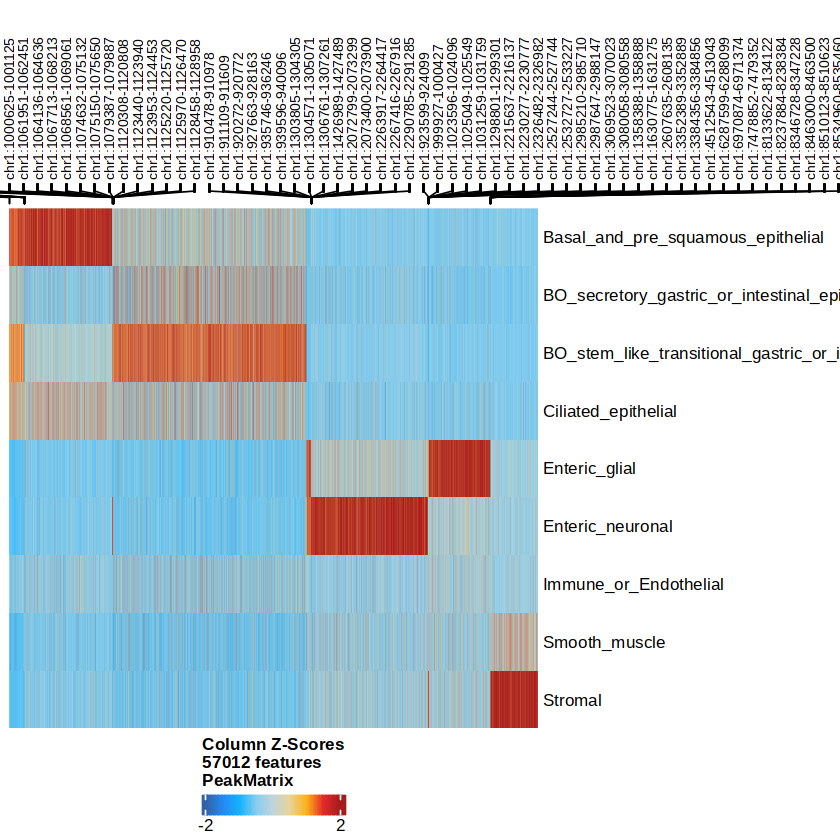

In [25]:
draw(heatmapPeaks, heatmap_legend_side = "bot", annotation_legend_side = "bot")

Warning message:
“Removed 132 rows containing missing values (`geom_point_rast()`).”


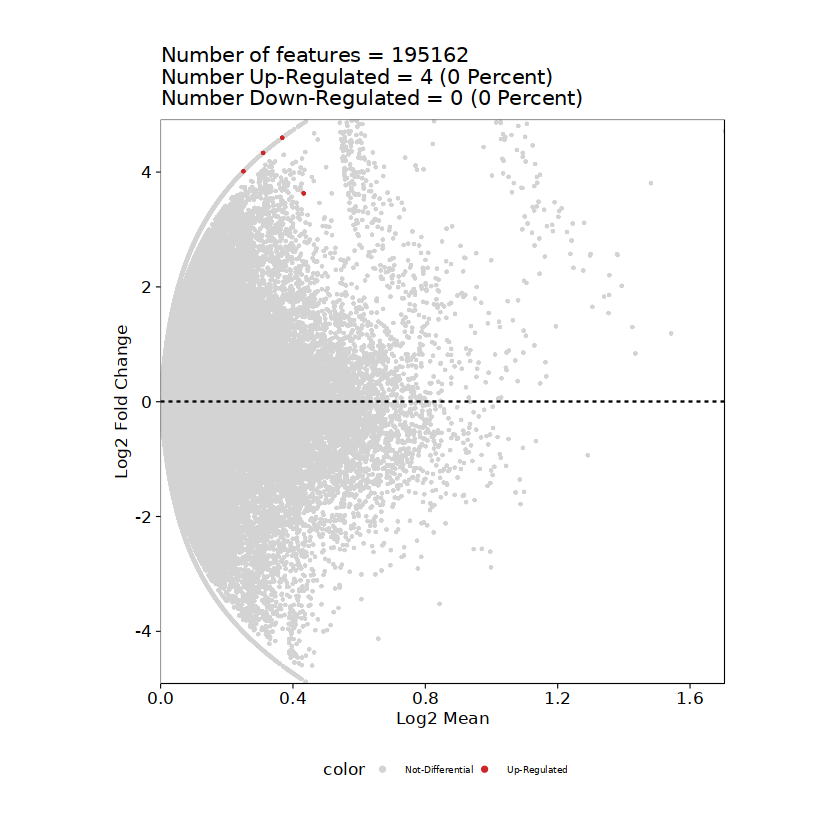

In [27]:
pma <- plotMarkers(seMarker = markersPeaks, name = "Ciliated_epithelial", cutOff = "FDR <= 0.1 & Log2FC >= 1", plotAs = "MA")
pma

In [28]:
pv <- plotMarkers(seMarker = markersPeaks, name = "C1", cutOff = "FDR <= 0.1 & Log2FC >= 1", plotAs = "Volcano")
pv

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'assays': <SummarizedExperiment>[,j] index out of bounds: C1


In [92]:
#makerPeakAndy <- c('ELF3','HNF4G','FOXA1','KRT7','GATA6','HNF1B','HNF4A','SOX9','KLF5')
makerPeakAndy <- c('TP63','HNF4G','HNF1B','HNF4A')
markerRachel <- c('GATA4','GATA6','SOX9','HNF1B','PDX1','GP2','NEUROG3','PTPRC','NKX2-2','NKX6-1','KRT19')

In [93]:
#Aoib_w15_proj_multiome <- addImputeWeights(Aoib_w15_proj_multiome)

In [94]:
p2_Andy <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneExpressionMatrix", 
    name = makerPeakAndy, 
    continuousSet = "horizonExtra",
    embedding = "UMAP_Combined",
    baseSize = 6,
    size=1,
    plotAs = 'points'
    #imputeWeights = getImputeWeights(Aoib_w15_proj_multiome)
)

Getting ImputeWeights

No imputeWeights found, returning NULL

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-18fb04bbb97b2-Date-2023-07-28_Time-16-17-17.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneExpressionMatrix

Getting Matrix Values...

2023-07-28 16:17:17 : 

1 


Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-18fb04bbb97b2-Date-2023-07-28_Time-16-17-17.log



In [97]:
p2_Andy_GS <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneScoreMatrix", 
    name = makerPeakAndy, 
    continuousSet = "horizonExtra",
    embedding = "UMAP_Combined",
    baseSize = 6,
    size=1,
    plotAs = 'points'
    #imputeWeights = getImputeWeights(Aoib_w15_proj_multiome)
)

Getting ImputeWeights

No imputeWeights found, returning NULL

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-18fb0dcd9c4b-Date-2023-07-28_Time-16-18-12.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2023-07-28 16:18:13 : 

1 


Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-18fb0dcd9c4b-Date-2023-07-28_Time-16-18-12.log



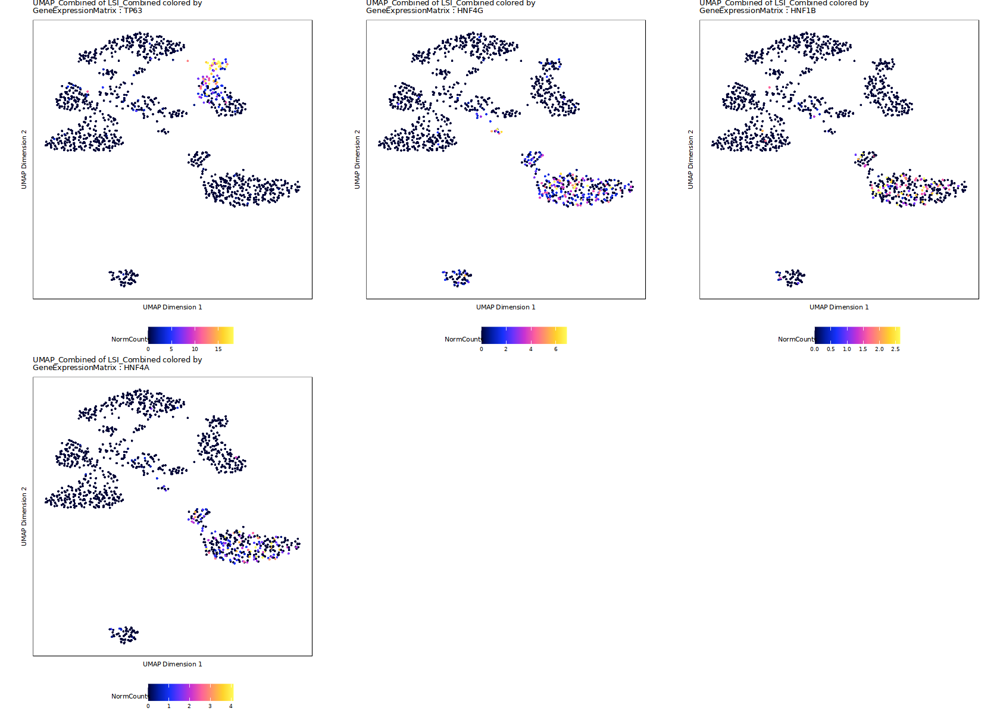

In [95]:
options(repr.plot.width=14, repr.plot.height=10)


p2c_Andy <- lapply(p2_Andy, function(x){
    x + 
    #guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})

#do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c_Andy))

In [100]:
png('geneExpression.png',res=200, height=3000, width=3000)
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c_Andy))
dev.off()

png 
  2

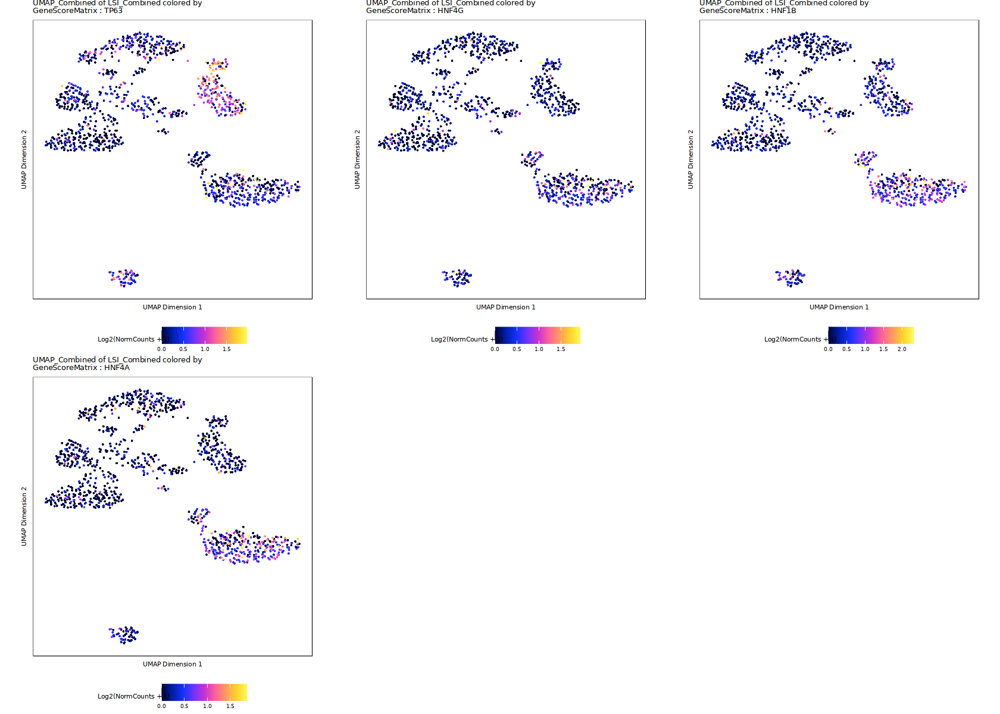

In [98]:
options(repr.plot.width=14, repr.plot.height=10)


p2c_Andy_GS <- lapply(p2_Andy_GS, function(x){
    x + 
    #guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})

#do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c_Andy_GS))

In [101]:
png('geneScore.png',res=200, height=3000, width=3000)
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c_Andy_GS))
dev.off()

png 
  2

In [37]:
plotPDF(plotList = p2c_Andy, 
    name = "Plot-GeneExpression_UMAP_Combined.pdf", 
    ArchRProj = Aoib_w15_proj_multiome, 
    addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



In [38]:
p2_Andy <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneExpressionMatrix", 
    name = markerRachel, 
    continuousSet = "horizonExtra",
    embedding = "UMAP_RNA",
    baseSize = 6
    #imputeWeights = getImputeWeights(aoibAggrproj)
)

Getting ImputeWeights

No imputeWeights found, returning NULL

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-18fb016c099df-Date-2023-07-28_Time-14-32-03.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneExpressionMatrix

Getting Matrix Values...

2023-07-28 14:32:03 : 

1 


Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-18fb016c099df-Date-2023-07-28_Time-14-32-03.log



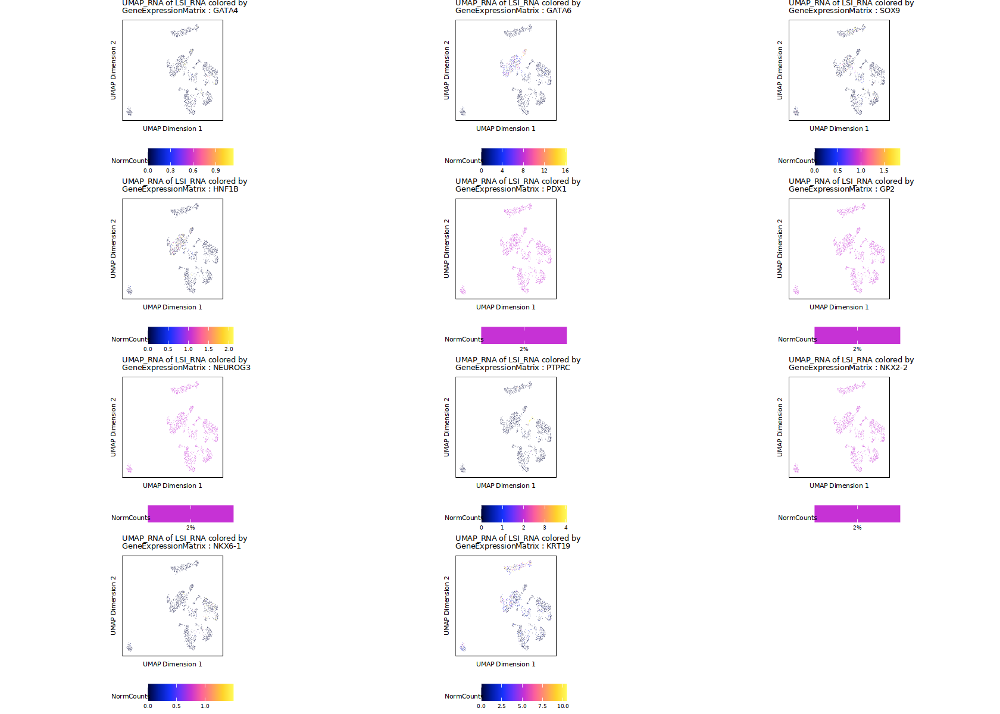

In [39]:
options(repr.plot.width=14, repr.plot.height=10)


p2c_Andy <- lapply(p2_Andy, function(x){
    x + 
    #guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})

#do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c_Andy))

In [40]:
plotPDF(plotList = p2c_Andy, 
    name = "Plot-GeneExpression_UMAP_RNA.pdf", 
    ArchRProj = Aoib_w15_proj_multiome, 
    addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



In [41]:
p2_Andy <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneExpressionMatrix", 
    name = makerPeakAndy, 
    continuousSet = "horizonExtra",
    embedding = "UMAP_ATAC",
    baseSize = 6
    #imputeWeights = getImputeWeights(aoibAggrproj)
)

Getting ImputeWeights

No imputeWeights found, returning NULL

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-18fb0628d4f2-Date-2023-07-28_Time-14-32-16.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneExpressionMatrix

Getting Matrix Values...

2023-07-28 14:32:16 : 

1 


Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-18fb0628d4f2-Date-2023-07-28_Time-14-32-16.log



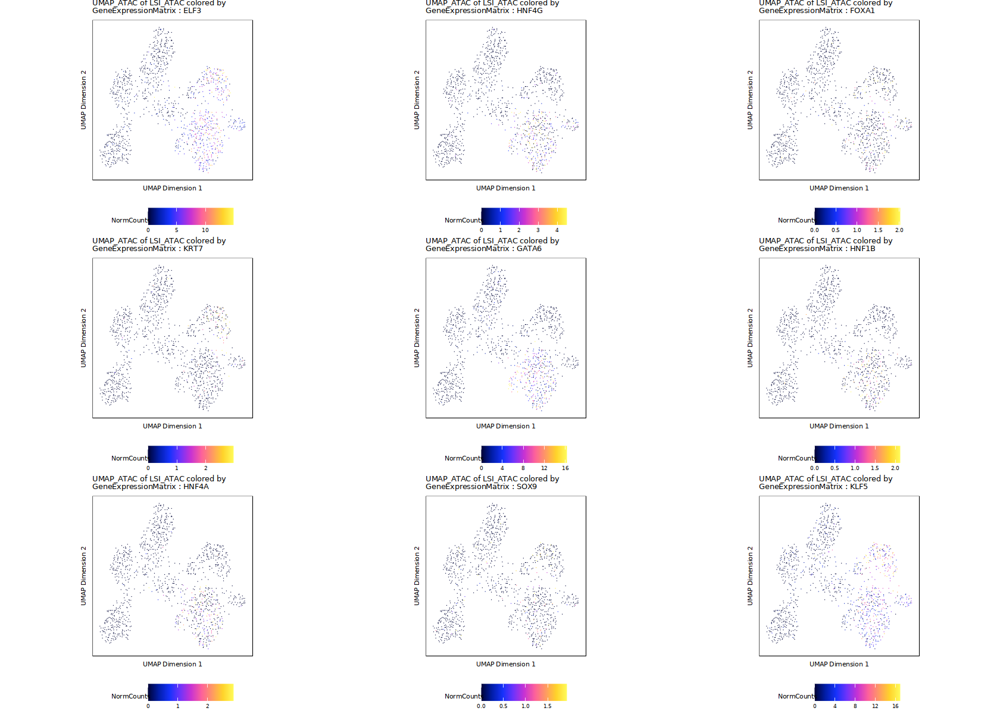

In [42]:
options(repr.plot.width=14, repr.plot.height=10)


p2c_Andy <- lapply(p2_Andy, function(x){
    x + 
    #guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})

#do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c_Andy))

In [43]:
pdf('TF_plots.pdf')
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c_Andy))
dev.off()

png 
  2

In [44]:
p <- plotBrowserTrack(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Clusters", 
    geneSymbol = makerPeakAndy, 
    upstream = 50000,
    downstream = 50000,
    loops = getCoAccessibility(Aoib_w15_proj_multiome),
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-18fb0fb1a52-Date-2023-07-28_Time-14-32-24.log
If there is an issue, please report to github with logFile!



GRanges object with 9 ranges and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]     chr1 202007945-202017188      + |        1999        ELF3
  [2]     chr8   75407942-75566843      + |        3174       HNF4G
  [3]    chr14   37589984-37595110      - |        3169       FOXA1
  [4]    chr12   52233114-52252186      + |        3855        KRT7
  [5]    chr18   22169443-22202528      + |        2627       GATA6
  [6]    chr17   37686432-37745247      - |        6928       HNF1B
  [7]    chr20   44355700-44434596      + |        3172       HNF4A
  [8]    chr17   72121020-72126420      + |        6662        SOX9
  [9]    chr13   73054976-73077542      + |         688        KLF5
  -------
  seqinfo: 24 sequences from hg38 genome


Getting Region From Arrow Files 1 of 1

Getting Region From Arrow Files 1 of 1

Getting Region From Arrow Files 1 of 1

Getting Region From Arrow Files 1 of 1

Getting Region From Arrow Files 1 of 1

Getting Region From Arrow Files 1 of 1

Getting Region From Arrow Files 1 of 1

Getting Region From Arrow Files 1 of 1

Getting Region From Arrow Files 1 of 1

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-18fb0fb1a52-Date-2023-07-28_Time-14-32-24.log



In [45]:
plotPDF(plotList = p, 
    name = "Plot-Tracks-TF-with-CoAccessibility.pdf", 
    ArchRProj = Aoib_w15_proj_multiome, 
    addDOC = FALSE, width = 5, height = 5)

Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


## 5.3 Motif and Feature Enrichment with ArchR

After identification of a robust peak set, we often want to predict what transcription factors may be mediating the binding events that create those accessible chromatin sites. This can be helpful in assessing marker peaks or differential peaks to understand if these groups of peaks are enriched for binding sites of specific transcription factors. For example, we often find enrichment of key lineage-defining TFs in cell type-specific accessible chromatin regions. In a similar fashion, we might want to test various groups of peaks for enrichment of other known features. For example, we might want to know if cell type-specific ATAC-seq peaks for cell type A are enriched for another set of genomic regions such as ChIP-seq peaks. This chapter details how these enrichments are performed in ArchR.

### Motif Enrichment in Differential Peaks

We now look for motifs that are enriched in peaks that are up or down in various cell types. To do this, we must first add these motif annotations to our `ArchRProject`. This effectively creates a binary matrix where the presence of a motif in each peak is indicated numerically. We do this using the `addMotifAnnotations()` function which determines motif presence in the peak set stored in the ArchRProject.

In [46]:
Aoib_w15_proj_multiome <- addMotifAnnotations(ArchRProj = Aoib_w15_proj_multiome, 
                                             motifSet = "cisbp", name = "Motif")

ArchR logging to : ArchRLogs/ArchR-addMotifAnnotations-18fb049b84f23-Date-2023-07-28_Time-14-32-45.log
If there is an issue, please report to github with logFile!

2023-07-28 14:32:49 : Gettting Motif Set, Species : Homo sapiens, 0.003 mins elapsed.

Using version 2 motifs!

2023-07-28 14:32:54 : Finding Motif Positions with motifmatchr!, 0.076 mins elapsed.

2023-07-28 14:38:15 : All Motifs Overlap at least 1 peak!, 5.427 mins elapsed.

2023-07-28 14:38:15 : Creating Motif Overlap Matrix, 5.427 mins elapsed.

2023-07-28 14:38:18 : Finished Getting Motif Info!, 5.477 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addMotifAnnotations-18fb049b84f23-Date-2023-07-28_Time-14-32-45.log



In [47]:
motifsUp <- peakAnnoEnrichment(
    seMarker = markersPeaks, # markerpeakss identified in the previous section
    ArchRProj = Aoib_w15_proj_multiome,
    peakAnnotation = "Motif",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  )

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-18fb04a24c889-Date-2023-07-28_Time-14-38-40.log
If there is an issue, please report to github with logFile!

2023-07-28 14:38:47 : Computing Enrichments 1 of 9, 0.11 mins elapsed.

2023-07-28 14:38:47 : Computing Enrichments 2 of 9, 0.115 mins elapsed.

2023-07-28 14:38:47 : Computing Enrichments 3 of 9, 0.118 mins elapsed.

2023-07-28 14:38:47 : Computing Enrichments 4 of 9, 0.123 mins elapsed.

2023-07-28 14:38:48 : Computing Enrichments 5 of 9, 0.128 mins elapsed.

2023-07-28 14:38:48 : Computing Enrichments 6 of 9, 0.133 mins elapsed.

2023-07-28 14:38:48 : Computing Enrichments 7 of 9, 0.14 mins elapsed.

2023-07-28 14:38:49 : Computing Enrichments 8 of 9, 0.144 mins elapsed.

2023-07-28 14:38:49 : Computing Enrichments 9 of 9, 0.148 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-peakAnnoEnrichment-18fb04a24c889-Date-2023-07-28_Time-14-38-40.log



In [48]:
df <- data.frame(TF = rownames(motifsUp), mlog10Padj = assay(motifsUp)[,1])
df <- df[order(df$mlog10Padj, decreasing = TRUE),]
df$rank <- seq_len(nrow(df))

In [49]:
head(df)

,TF,mlog10Padj,rank
,<chr>,<dbl>,<int>
142,FOSL1_142,350.7701,1
139,JUNB_139,343.4837,2
651,SMARCC1_651,327.8937,3
105,FOSL2_105,326.0641,4
137,FOS_137,319.1207,5
143,JUN_143,304.7949,6


Warning message:
“ggrepel: 9 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


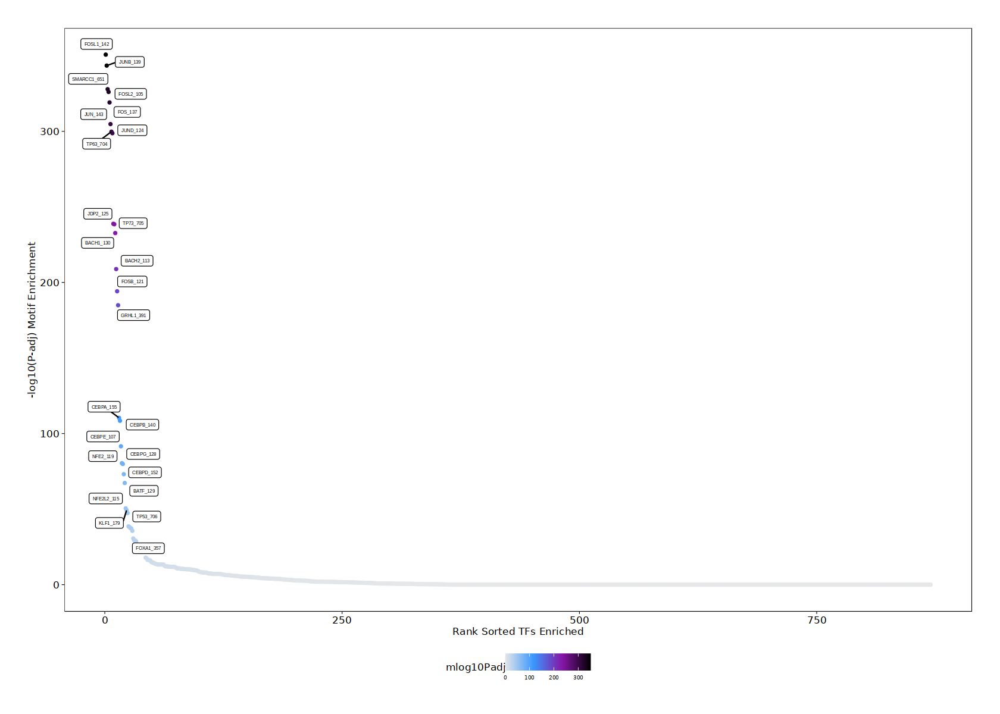

In [50]:
ggUp <- ggplot(df, aes(rank, mlog10Padj, color = mlog10Padj)) + 
  geom_point(size = 1) +
  ggrepel::geom_label_repel(
        data = df[rev(seq_len(30)), ], aes(x = rank, y = mlog10Padj, label = TF), 
        size = 1.5,
        nudge_x = 2,
        color = "black"
  ) + theme_ArchR() + 
  ylab("-log10(P-adj) Motif Enrichment") + 
  xlab("Rank Sorted TFs Enriched") +
  scale_color_gradientn(colors = paletteContinuous(set = "comet"))

ggUp

In [51]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = Aoib_w15_proj_multiome,
    peakAnnotation = "Motif",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  )

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-18fb060c4ed9c-Date-2023-07-28_Time-14-38-51.log
If there is an issue, please report to github with logFile!

2023-07-28 14:38:58 : Computing Enrichments 1 of 9, 0.111 mins elapsed.

2023-07-28 14:38:58 : Computing Enrichments 2 of 9, 0.116 mins elapsed.

2023-07-28 14:38:58 : Computing Enrichments 3 of 9, 0.12 mins elapsed.

2023-07-28 14:38:59 : Computing Enrichments 4 of 9, 0.126 mins elapsed.

2023-07-28 14:38:59 : Computing Enrichments 5 of 9, 0.131 mins elapsed.

2023-07-28 14:38:59 : Computing Enrichments 6 of 9, 0.135 mins elapsed.

2023-07-28 14:38:59 : Computing Enrichments 7 of 9, 0.14 mins elapsed.

2023-07-28 14:39:00 : Computing Enrichments 8 of 9, 0.144 mins elapsed.

2023-07-28 14:39:00 : Computing Enrichments 9 of 9, 0.15 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-peakAnnoEnrichment-18fb060c4ed9c-Date-2023-07-28_Time-14-38-51.log



In [52]:
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = 10, transpose = TRUE)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-18fb03df7ae7f-Date-2023-07-28_Time-14-39-00.log
If there is an issue, please report to github with logFile!

Adding Annotations..

Preparing Main Heatmap..



In [58]:
heatmapEM_MM <- plotEnrichHeatmap(enrichMotifs, n = 20, transpose = TRUE, returnMatrix = TRUE)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-18fb066c680b2-Date-2023-07-28_Time-14-54-20.log
If there is an issue, please report to github with logFile!



In [59]:
library(pheatmap)

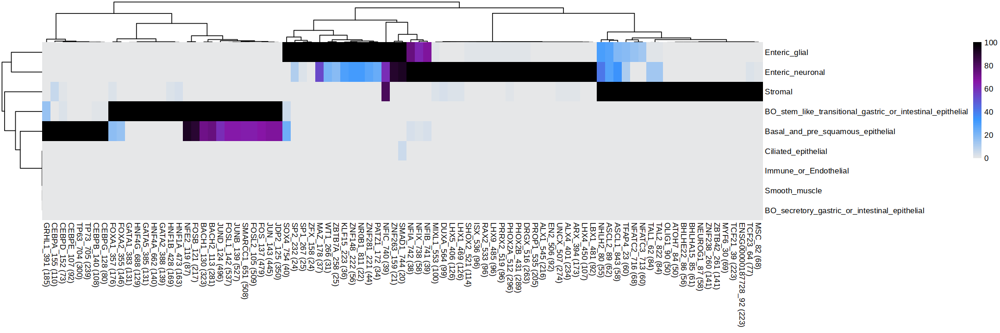

In [66]:
options(repr.plot.width=18, repr.plot.height=6)
pheatmap(heatmapEM_MM, color = paletteContinuous(set = "comet", n = 100))

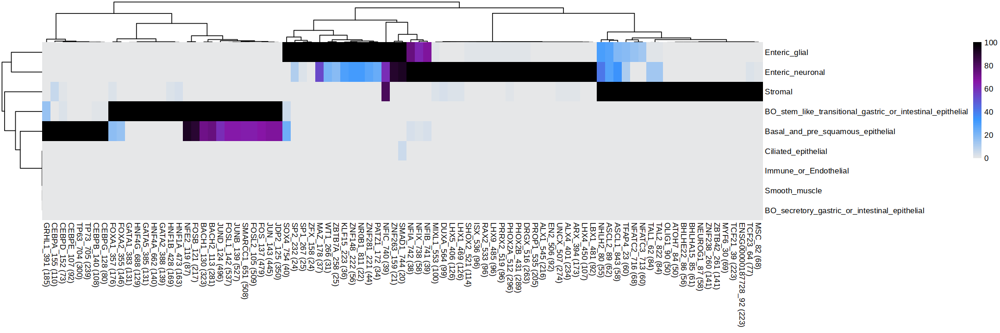

In [67]:
p1 <- pheatmap(heatmapEM_MM, color = paletteContinuous(set = "comet", n = 100))

In [71]:
plotPDF(p1, name = "Motifs-Enriched-Marker-Heatmap", width = 18, height = 6, 
        ArchRProj = Aoib_w15_proj_multiome, addDOC = FALSE)

Plotting Other



In [73]:
png('multiome_15W/Plots/Motifs-Enriched-Marker-Heatmap.png', width=1800, height=600, res=100)
p1
dev.off()

png 
  2

In [161]:
heatmapEMLarge <- plotEnrichHeatmap(enrichMotifs, n = 200, transpose = FALSE)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-2b388612395da1-Date-2022-08-31_Time-21-02-55.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..



In [162]:
plotPDF(heatmapEMLarge, name = "Motifs-Enriched-Marker-Heatmap-large", width = 8, height = 82, 
        ArchRProj = Aoib_w15_proj_multiome, addDOC = FALSE)

Plotting ComplexHeatmap!



In [163]:
heatmapEMLarge <- plotEnrichHeatmap(enrichMotifs, n = 20, transpose = FALSE)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-2b3886223f86cc-Date-2022-08-31_Time-21-03-05.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..



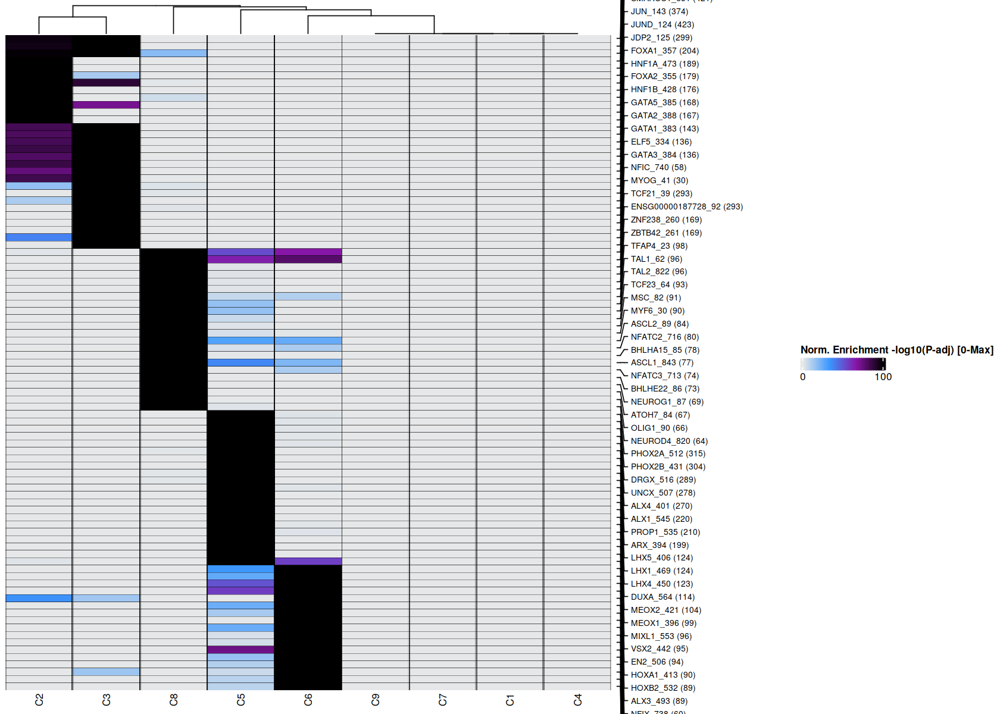

In [164]:
heatmapEMLarge

In [165]:
plotPDF(heatmapEMLarge, name = "Motifs-Enriched-Marker-Heatmap-large-top20", width = 8, height = 28, 
        ArchRProj = Aoib_w15_proj_multiome, addDOC = FALSE)

Plotting ComplexHeatmap!



## 5.4 ChromVAR Deviatons Enrichment with ArchR

As shown in previous chapters, TF motif enrichments can help us predict which regulatory factors are most active in our cell type of interest. These enrichments, however, are not calculated on a per-cell basis and they do not take into account the insertion sequence bias of the Tn5 transposase. chromVAR, an R packaged from the Greenlead Lab, was created to account for these issues. chromVAR is designed for predicting enrichment of TF activity on a per-cell basis from sparse chromatin accessibility data. The two primary outputs of chromVAR are:

1. “deviations” - A deviation is a bias-corrected measurement of how far the per-cell accessibility of a given feature (i.e motif) deviates from the expected accessibility based on the average of all cells or samples.
2. “z-score” - The z-score, also known as a “deviation score” is the z-score for each bias-corrected deviation across all cells. The absolute value of the deviation score is correlated with the per-cell read depth. This is because, with more reads, you have higher confidence that the difference in per-cell accessibility of the given feature (i.e. motif) from the expectation is greater than would occur by chance.

One of the primary limitations of chromVAR is that it was designed during the early era of scATAC-seq data generation when an experiment consisted of a few hundred of cells. At this experimental scale, chromVAR could easily read the entire cell-by-peak matrix into memory to quickly compute TF deviations. However, current experimental approaches use tens to hundreds of thousands of cells, generating cell-by-peak matrices that are much more difficult to read into memory. This leads to dramatic increases in run time and memory usage for even moderately sized datasets of 50,000 cells.

To circumvent these limitations, ArchR implements the same chromVAR analysis workflow by analyzing sample sub-matrices independently.

First, ArchR reads in the global accessibility per peak across all cells in each sub-sample. Second, for each peak, ArchR identifies a set of background peaks that are matched by GC-content and accessibility. Third, ArchR uses this background set of peaks and global accessibility to compute bias-corrected deviations with chromVAR for each sample independently. This implementation requires data from only 5,000-10,000 cells to be loaded into memory at any given time, minimizing the memory requirements, enabling scalable analysis with chromVAR, and improving run-time performance.

### Motif Deviations

First, lets make sure we have added motif annotations to our ArchRProject.


In [74]:
if("Motif" %ni% names(Aoib_w15_proj_multiome@peakAnnotation)){
    Aoib_w15_proj_multiome <- addMotifAnnotations(ArchRProj = Aoib_w15_proj_multiome, motifSet = "cisbp", name = "Motif")
}

We also need to add a set of background peaks which are used in computing deviations. Background peaks are chosen using the `chromVAR::getBackgroundPeaks()` function which samples peaks based on similarity in GC-content and number of fragments across all samples using the Mahalanobis distance.

In [75]:
Aoib_w15_proj_multiome <- addBgdPeaks(Aoib_w15_proj_multiome)

Identifying Background Peaks!



We are now ready to compute per-cell deviations accross all of our motif annotations using the `addDeviationsMatrix()` function. This function has an optional parameter called `matrixName` that allows us to define the name of the deviations matrix that will be stored in the Arrow files. If we do not provide a value to this parameter, as in the example below, this function creates a matrix name by adding the word “Matrix” to the name of the peakAnnotation. The example below creates a deviations matrix in each of our Arrow files called “MotifMatrix”.

In [76]:
Aoib_w15_proj_multiome <- addDeviationsMatrix(
  ArchRProj = Aoib_w15_proj_multiome, 
  peakAnnotation = "Motif",
  force = TRUE
)

Using Previous Background Peaks!

ArchR logging to : ArchRLogs/ArchR-addDeviationsMatrix-18fb0124b9cc8-Date-2023-07-28_Time-15-01-29.log
If there is an issue, please report to github with logFile!



NULL


'as(<lgCMatrix>, "dgCMatrix")' is deprecated.
Use 'as(., "dMatrix")' instead.
See help("Deprecated") and help("Matrix-deprecated").

2023-07-28 15:01:32 : Batch Execution w/ safelapply!, 0 mins elapsed.

2023-07-28 15:01:34 : chromVAR deviations multiome_15W (1 of 1) Schep (2017), 0.023 mins elapsed.

2023-07-28 15:02:09 : multiome_15W (1 of 1) : Deviations for Annotation 43 of 870, 0.468 mins elapsed.

2023-07-28 15:02:35 : multiome_15W (1 of 1) : Deviations for Annotation 86 of 870, 0.903 mins elapsed.

2023-07-28 15:02:59 : multiome_15W (1 of 1) : Deviations for Annotation 129 of 870, 1.309 mins elapsed.

2023-07-28 15:03:32 : multiome_15W (1 of 1) : Deviations for Annotation 172 of 870, 1.846 mins elapsed.

2023-07-28 15:04:12 : multiome_15W (1 of 1) : Deviations for Annotation 215 of 870, 2.518 mins elapsed.

2023-07-28 15:04:48 : multiome_15W (1 of 1) : Deviations for Annotation 258 of 870, 3.126 mins elapsed.

2023-07-28 15:05:21 : multiome_15W (1 of 1) : Deviations for Annotati

To access these deviations, we use the `getVarDeviations()` function. If we want this function to return a `ggplot` object, we set `plot = TRUE` otherwise, this function would return the `DataFrame` object. The head of that `DataFrame` object is displayed by default when the function is run.

In [77]:
plotVarDev <- getVarDeviations(Aoib_w15_proj_multiome, name = "MotifMatrix", plot = TRUE)

DataFrame with 6 rows and 6 columns
     seqnames     idx        name combinedVars combinedMeans      rank
        <Rle> <array>     <array>    <numeric>     <numeric> <integer>
f142        z     142   FOSL1_142      56.3115     -0.477206         1
f139        z     139    JUNB_139      56.3023     -0.469896         2
f124        z     124    JUND_124      54.5781     -0.485646         3
f105        z     105   FOSL2_105      54.5255     -0.478308         4
f651        z     651 SMARCC1_651      53.1111     -0.452463         5
f143        z     143     JUN_143      48.2409     -0.456457         6


From the above snapshot of the DataFrame, you can see that the seqnames of the `MotifMatrix` are not chromosomes. Typically, in matrices like the `TileMatrix`, `PeakMatrix`, and `GeneScoreMatrix`, we store the chromosome information in seqnames. The `MotifMatrix` does not have any corresponding position information but, instead, stores both the “devations” and “z-scores” from `chromVAR` into the same matrix using two different seqnames - deviations and z. This becomes important later on if you try to use the `MotifMatrix` (which is of class `Sparse.Assays.Matrix`) in functions such as `getMarkerFeatures()`. In these types of operations, ArchR will expect you to subset `MotifMatrix` to one of the two seqnames (i.e. select either z-scores or deviations to perform calculations).

We can then plot these variable deviations.

Warning message:
“ggrepel: 6 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


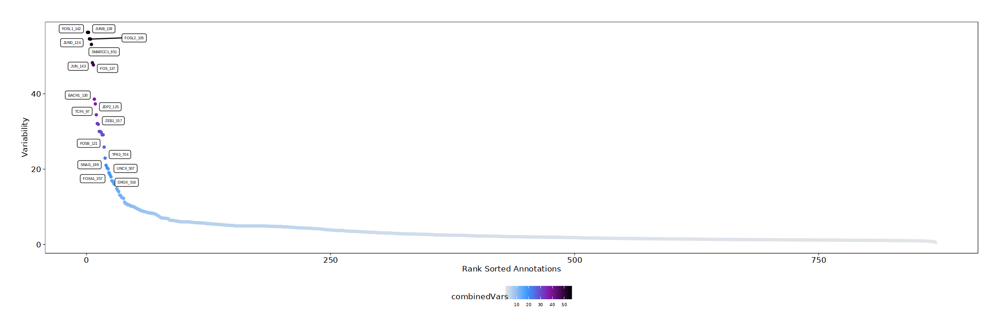

In [78]:
plotVarDev

To save an editable vectorized version of this plot, we use the plotPDF() function.

What if we want to extract a subset of motifs for downstream analysis? We can do this using the getFeatures() function. The paste(motifs, collapse="|") statement below creates a concatenated or statement that enables selection of all of the motifs.

In [79]:
motifs <- c("GATA1", "CEBPA", "EBF1", "IRF4", "TBX21", "PAX5")
markerMotifs <- getFeatures(Aoib_w15_proj_multiome, select = paste(motifs, collapse="|"), useMatrix = "MotifMatrix")
markerMotifs

[1] "z:TBX21_780"          "z:PAX5_709"           "z:IRF4_632"          
 [4] "z:GATA1_383"          "z:CEBPA_155"          "z:EBF1_67"           
 [7] "z:SREBF1_22"          "deviations:TBX21_780" "deviations:PAX5_709" 
[10] "deviations:IRF4_632"  "deviations:GATA1_383" "deviations:CEBPA_155"
[13] "deviations:EBF1_67"   "deviations:SREBF1_22"

As mentioned above, `MotifMatrix` contains seqnames for both z-scores and deviations, shown above by “z:” and “deviations:”. To get just the features corresponding to z-scores, we can use `grep`. Unfortunately, in the example motifs shown above, you can see that in addition to “EBF1”, we also selected “SREBF1” which we do not want to analyze. Because of this, we remove it below using the `%ni%` expression which is an ArchR helper function that provides the opposite of `%in%` from base R.

In [80]:
markerMotifs <- grep("z:", markerMotifs, value = TRUE)
markerMotifs <- markerMotifs[markerMotifs %ni% "z:SREBF1_22"]
markerMotifs

[1] "z:TBX21_780" "z:PAX5_709"  "z:IRF4_632"  "z:GATA1_383" "z:CEBPA_155"
[6] "z:EBF1_67"

Now that we have the names of the features that we are interested in, we can plot the distribution of `chromVAR` deviation scores for each cluster. Notice that we supply the impute weights that we calculated previously during our gene score analyses. As a reminder, these impute weights allow us to smooth the signal across nearby cells which is helpful in the context of our sparse scATAC-seq data.

In [81]:
p <- plotGroups(ArchRProj = Aoib_w15_proj_multiome, 
  groupBy = "Clusters", 
  colorBy = "MotifMatrix", 
  name = markerMotifs,
  imputeWeights = getImputeWeights(Aoib_w15_proj_multiome)
)

Getting ImputeWeights

No imputeWeights found, returning NULL

Getting Matrix Values...

2023-07-28 15:11:32 : 

1 


1 
2 
3 
4 
5 
6 




We can use cowplot to plot the distributions of all of these motifs in a single plot.

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as of ggplot2 3.3.4.”
Picking joint bandwidth of 0.325

Picking joint bandwidth of 0.338

Picking joint bandwidth of 0.442

Picking joint bandwidth of 0.564

Picking joint bandwidth of 0.527

Picking joint bandwidth of 0.467



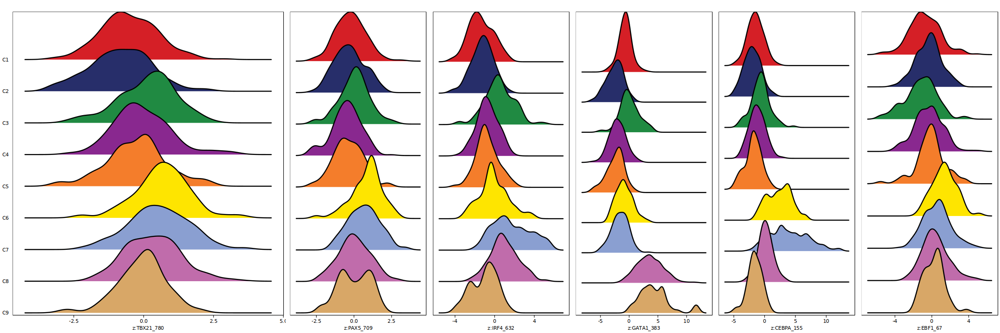

In [82]:
p2 <- lapply(seq_along(p), function(x){
  if(x != 1){
    p[[x]] + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0.1, 0.1, 0.1, 0.1), "cm")) +
    theme(
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank()
    ) + ylab("")
  }else{
    p[[x]] + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0.1, 0.1, 0.1, 0.1), "cm")) +
    theme(
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank()
    ) + ylab("")
  }
})
do.call(cowplot::plot_grid, c(list(nrow = 1, rel_widths = c(2, rep(1, length(p2) - 1))),p2))

Instead of looking at the distributions of these z-scores, we can overlay the z-scores on our UMAP embedding as we’ve done previously for gene scores.

In [83]:
p <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "MotifMatrix", 
    name = sort(markerMotifs), 
    embedding = "UMAP_Combined",
    imputeWeights = getImputeWeights(Aoib_w15_proj_multiome)
)

Getting ImputeWeights

No imputeWeights found, returning NULL

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-18fb05abdea61-Date-2023-07-28_Time-15-11-36.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2023-07-28 15:11:36 : 

1 


Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-18fb05abdea61-Date-2023-07-28_Time-15-11-36.log



We can plot all of these motif UMAPs using `cowplot`.

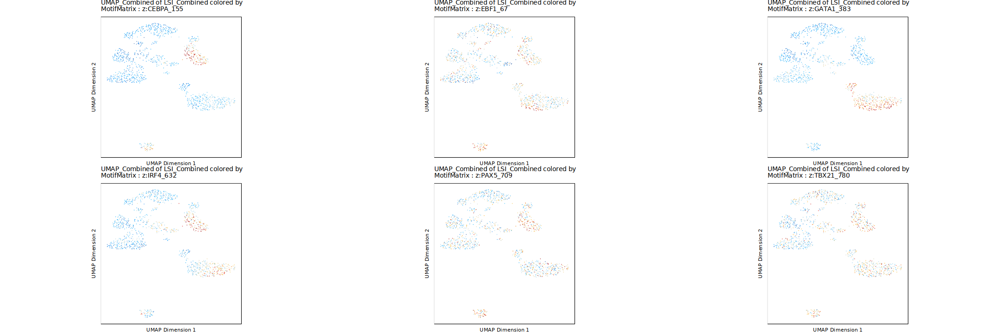

In [84]:
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

To see how these TF deviation z-scores compare to the inferred gene expression via gene scores of the corresponding TF genes, we can overlay the gene scores for each of these TFs on the UMAP embedding.

Similarly, because we previously linked our scATAC-seq data with corresponding scRNA-seq data, we can plot the linked gene expression for each of these TFs on the UMAP embedding.

In [85]:
markerRNA <- getFeatures(Aoib_w15_proj_multiome, select = paste(motifs, collapse="|"), useMatrix = "GeneExpressionMatrix")
markerRNA <- markerRNA[markerRNA %ni% c("SREBF1","CEBPA-DT")]
markerRNA

[1] "TBX21" "CEBPA" "EBF1"  "IRF4"  "PAX5"  "GATA1"

Getting ImputeWeights

No imputeWeights found, returning NULL

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-18fb058fe7e34-Date-2023-07-28_Time-15-11-40.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneExpressionMatrix

Getting Matrix Values...

2023-07-28 15:11:41 : 

1 


Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-18fb058fe7e34-Date-2023-07-28_Time-15-11-40.log



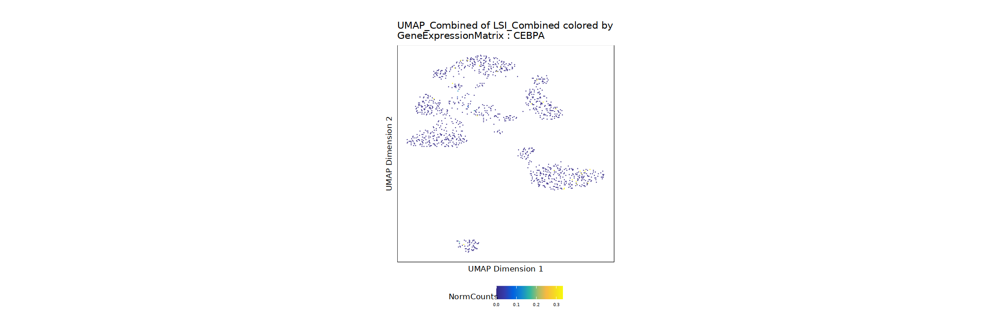

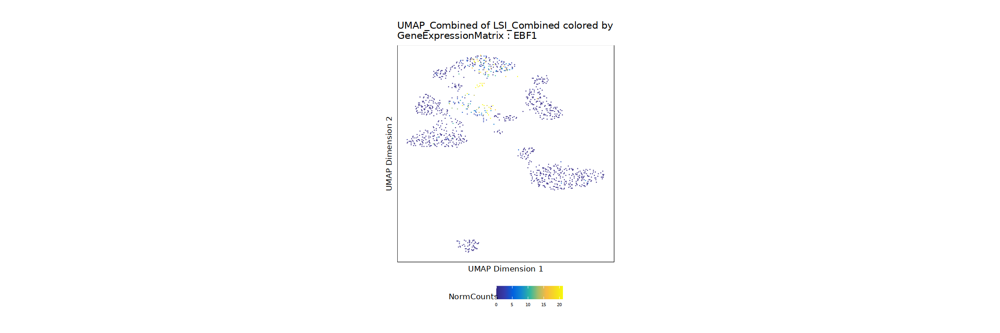

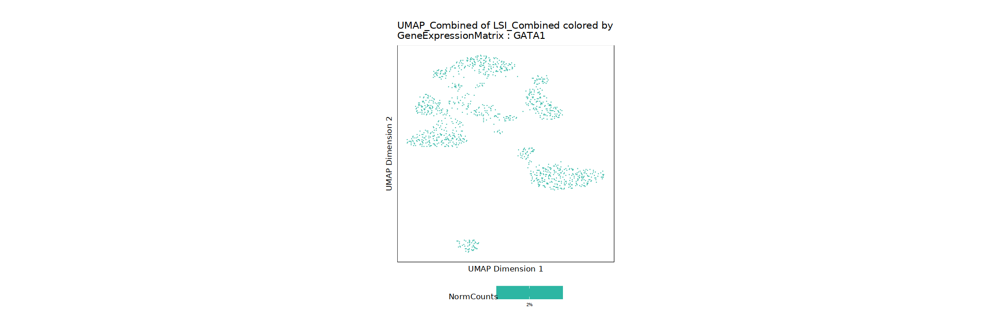

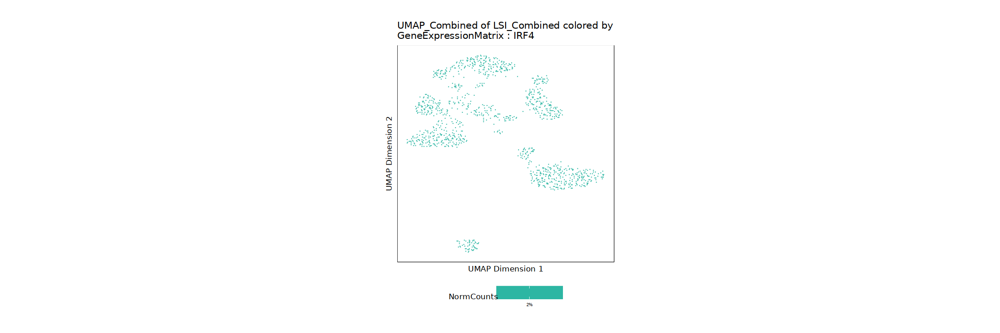

$CEBPA

$EBF1

$GATA1

$IRF4

$PAX5

$TBX21


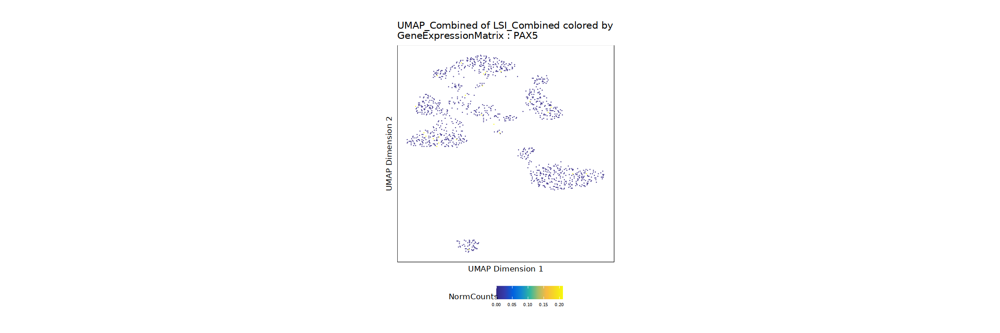

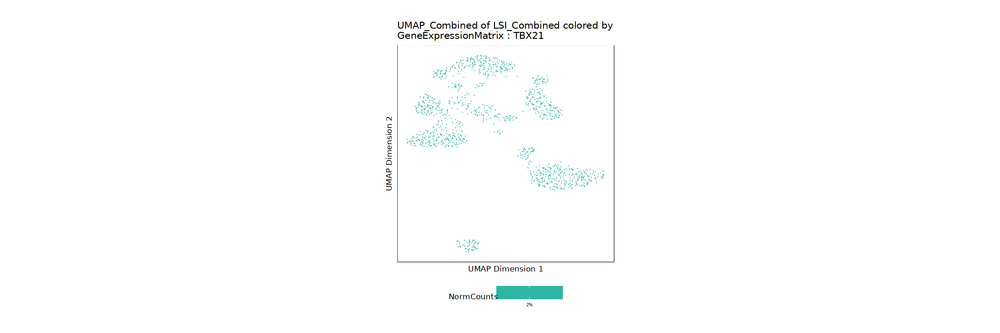

In [86]:
p <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneExpressionMatrix", 
    name = sort(markerRNA), 
    embedding = "UMAP_Combined",
    continuousSet = "blueYellow",
    imputeWeights = getImputeWeights(Aoib_w15_proj_multiome)
)
p

In [ ]:
saveA

# 6 Footprinting with ArchR

Transcription factor (TF) footprinting allows for the prediction of the precise binding location of a TF at a particular locus. This is because the DNA bases that are directly bound by the TF are actually protected from transposition while the DNA bases immediately adjacent to TF binding are accessible.

<img src='documentFigures/footprintingSchematic.png' width='30%'>

Ideally, TF footprinting is performed at a single site to determine the precise binding location of the TF. However, in practice, this requires very high sequencing depth, often much higher depth than what most users would obtain from either bulk or single-cell ATAC-seq. To get around this problem, we can combine Tn5 insertion locations across many instances of predicted TF binding. For example, we can take all peaks that harbor a CTCF motif and make an aggregate TF footprint for CTCF across the whole genome.

The accuracy of this footprint relies on generating a reliable curated list of predicted binding sites for the TF of interest. ArchR does this in a naive way via the `addMotifAnnotations()` functions by searching the peak regions for any DNA sequence matching a motif. Depending on the degeneracy of the motif of interest, this may or may not be sufficient. These motif annotations get added to the `ArchRProject` as a binary representation on a per peak basis `(0 = no motif, 1 = motif present)`. Once you have these motif annotations, ArchR performs footprinting using the `getFootprints()` function which takes as input an `ArchRProject` object and a `GenomicRanges` object that contains the positions of the motifs. These positions can be accessed from the `ArchRProjec`t via the `getPositions()` function. These footprints can then be plotted using the `plotFootprints()` function.

Perhaps most importantly, the footprinting analyses in ArchR account for known Tn5 insertion sequence bias. To do this, ArchR uses a matrix of hexamer position frequencies and a matrix of k-mer frequencies at Tn5 insertion sites:

<img src='documentFigures/footprintingMethods.png' width='50%'>

When footprinting, the first thing we need to do is obtain the positions of the relevant motifs. To do this, we call the `getPositions(`) function. This function has an optional parameter called name which can accept the `name` of the `peakAnnotation` object from which we would like to obtain the positions. If `name = NULL`, then ArchR will use the first entry in the `peakAnnotation` slot. In the code below, we do not specify `name` and `ArchR` uses the first entry which is our CIS-BP motifs.

In [180]:
motifPositions <- getPositions(Aoib_w15_proj_multiome)

In [181]:
motifPositions

GRangesList object of length 870:
$TFAP2B_1
GRanges object with 24883 ranges and 1 metadata column:
          seqnames              ranges strand |     score
             <Rle>           <IRanges>  <Rle> | <numeric>
      [1]     chr1       933737-933748      - |   8.72292
      [2]     chr1       937522-937533      + |   8.09512
      [3]     chr1       938095-938106      + |   8.40940
      [4]     chr1       939597-939608      + |   8.01629
      [5]     chr1       940125-940136      + |  10.12834
      ...      ...                 ...    ... .       ...
  [24879]     chrX 154547380-154547391      - |   8.42468
  [24880]     chrX 154751280-154751291      - |   9.00751
  [24881]     chrX 154762826-154762837      + |   8.24152
  [24882]     chrX 155071293-155071304      + |   8.80887
  [24883]     chrX 155071293-155071304      - |   8.03569
  -------
  seqinfo: 23 sequences from an unspecified genome; no seqlengths

...
<869 more elements>

In [182]:
motifs <- c("GATA1", "CEBPA", "EBF1", "IRF4", "TBX21", "PAX5")
markerMotifs <- unlist(lapply(motifs, function(x) grep(x, names(motifPositions), value = TRUE)))
markerMotifs <- markerMotifs[markerMotifs %ni% "SREBF1_22"]
markerMotifs

[1] "GATA1_383" "CEBPA_155" "EBF1_67"   "IRF4_632"  "TBX21_780" "PAX5_709"

To accurately profile TF footprints, a large number of reads are required. Therefore, cells are grouped to create pseudo-bulk ATAC-seq profiles that can be then used for TF footprinting. These pseudo-bulk profiles are stored as group coverage files which we originally created in a previous chapter to perform peak calling. If you haven’t already added group coverages to your `ArchRProject`, lets do that now.

In [183]:
Aoib_w15_proj_multiome <- addGroupCoverages(ArchRProj = Aoib_w15_proj_multiome, groupBy = "Clusters_ATAC")

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-2b38863b42ca0e-Date-2022-08-31_Time-21-21-21.log
If there is an issue, please report to github with logFile!



ERROR: Error in addGroupCoverages(ArchRProj = Aoib_w15_proj_multiome, groupBy = "Clusters_ATAC"): Group Coverages Already Computed, Set force = TRUE to continue!


With group coverages calculated, we can now compute footprints for the subset of marker motifs that we previously selected using the `getFootprints()` function. Even though ArchR implements a highly optimized footprinting workflow, it is recommended to perform footprinting on a subset of motifs rather than all motifs. As such, we provide the subset of motifs to footprint via the positions parameter.

In [184]:
seFoot <- getFootprints(
  ArchRProj = Aoib_w15_proj_multiome, 
  positions = motifPositions[markerMotifs], 
  groupBy = "Clusters_ATAC"
)

ArchR logging to : ArchRLogs/ArchR-getFootprints-2b388657ce91f5-Date-2022-08-31_Time-21-21-56.log
If there is an issue, please report to github with logFile!

2022-08-31 21:21:57 : Computing Kmer Bias Table, 0.003 mins elapsed.

2022-08-31 21:22:10 : Finished Computing Kmer Tables, 0.22 mins elapsed.

2022-08-31 21:22:10 : Computing Footprints, 0.224 mins elapsed.

2022-08-31 21:22:41 : Computing Footprints Bias, 0.744 mins elapsed.

2022-08-31 21:22:57 : Summarizing Footprints, 1.017 mins elapsed.



## 6.1 Normalization of Footprints for Tn5 Bias

One major challenge with TF footprinting using ATAC-seq data is the insertion sequence bias of the Tn5 transposase which can lead to misclassification of TF footprints. To account for Tn5 insertion bias, ArchR identifies the k-mer (user-defined length, default length 6) sequences surrounding each Tn5 insertion site. To do this analysis, ArchR identifies single-base resolution Tn5 insertion sites for each pseudo-bulk, resizes these 1-bp sites to k-bp windows (-k/2 and + (k/2 - 1) bp from insertion), and then creates a k-mer frequency table using the `oligonucleotidefrequency(w=k, simplify.as="collapse")` function from the `Biostrings` package. ArchR then calculates the expected k-mers genome-wide using the same function with the BSgenome-associated genome file. To calculate the insertion bias for a pseudo-bulk footprint, ArchR creates a k-mer frequency matrix that is represented as all possible k-mers across a window +/- N bp (user-defined, default 250 bp) from the motif center. Then, iterating over each motif site, ArchR fills in the positioned k-mers into the k-mer frequency matrix. This is then calculated for each motif position genome-wide. Using the sample’s k-mer frequency table, ArchR can then compute the expected Tn5 insertions by multiplying the k-mer position frequency table by the observed/expected Tn5 k-mer frequency.

All of this happens under the hood within the `plotFootprints()` function.

### Subtracting the Tn5 Bias

One normalization method subtracts the Tn5 bias from the footprinting signal. This normalization is performed by setting `normMethod = "Subtract"` when calling `plotFootprints()`.

In [185]:
plotFootprints(
  seFoot = seFoot,
  ArchRProj = Aoib_w15_proj_multiome, 
  normMethod = "Subtract",
  plotName = "Footprints-Subtract-Bias",
  addDOC = FALSE,
  smoothWindow = 5
)

ArchR logging to : ArchRLogs/ArchR-plotFootprints-2b3886732d3c4e-Date-2022-08-31_Time-21-22-59.log
If there is an issue, please report to github with logFile!

2022-08-31 21:22:59 : Plotting Footprint : GATA1_383 (1 of 6), 0.002 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-08-31 21:23:01 : Plotting Footprint : CEBPA_155 (2 of 6), 0.027 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-08-31 21:23:02 : Plotting Footprint : EBF1_67 (

# 7. Co-accessibility with ArchR

Co-accessibility is a correlation in accessibility between two peaks across many single cells. Said another way, when Peak A is accessible in a single cell, Peak B is often also accessible. We illustrate this concept visually below, showing that Enhancer E3 is often co-accessible with Promoter P.

<img src='documentFigures/ArchR_Coaccessibility.png' width='30%'>

One thing to note about co-accessibility analysis is that it often identified cell type-specific peaks as being co-accessibile. This is because these peaks are often all accessible together within a single cell type and often all not accessible in all other cell types. This drives a strong correlation but does not necessarily mean that there is a regulatory relationship between these peaks.

To calculate co-accessibility in ArchR, we use the `addCoAccessibility()` function which stores peak co-accessibility information in the ArchRProject.

In [186]:
Aoib_w15_proj_multiome <- addCoAccessibility(
    ArchRProj = Aoib_w15_proj_multiome,
    reducedDims = "LSI_ATAC",
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-addCoAccessibility-2b38864c0c9f10-Date-2022-08-31_Time-21-23-09.log
If there is an issue, please report to github with logFile!

ArchR logging successful to : ArchRLogs/ArchR-addCoAccessibility-2b38864c0c9f10-Date-2022-08-31_Time-21-23-09.log



We can retrieve this co-accessibility information from the ArchRProject via the `getCoAccessibility()` function which returns a DataFrame object if `returnLoops = FALSE`.

In [187]:
cA <- getCoAccessibility(
    ArchRProj = Aoib_w15_proj_multiome,
    corCutOff = 0.5,
    resolution = 1000,
    returnLoops = TRUE
)

cA[[1]]

GRanges object with 345176 ranges and 9 metadata columns:
           seqnames              ranges strand | correlation Variability1
              <Rle>           <IRanges>  <Rle> |   <numeric>    <numeric>
       [1]     chr1       858500-908500      * |    0.532564  0.000741280
       [2]     chr1       869500-876500      * |    0.523949  0.000604027
       [3]     chr1       869500-906500      * |    0.600214  0.003656624
       [4]     chr1       876500-906500      * |    0.646553  0.000604027
       [5]     chr1       902500-906500      * |    0.532269  0.000578397
       ...      ...                 ...    ... .         ...          ...
  [345172]     chrX 155001500-155024500      * |    0.647848  0.000353971
  [345173]     chrX           155612500      * |    0.503822  0.001130771
  [345174]     chrX 155747500-155758500      * |    0.655262  0.000540645
  [345175]     chrX 155747500-155767500      * |    0.534911  0.000540645
  [345176]     chrX 155758500-155767500      * |    0.

In [188]:
markerGenes  <- c(
    "CD34", #Early Progenitor
    "GATA1", #Erythroid
    "PAX5", "MS4A1", #B-Cell Trajectory
    "CD14", #Monocytes
    "CD3D", "CD8A", "TBX21", "IL7R" #TCells
  )

p <- plotBrowserTrack(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Clusters_ATAC", 
    geneSymbol = markerGenes, 
    upstream = 50000,
    downstream = 50000,
    loops = getCoAccessibility(Aoib_w15_proj_multiome),
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-2b388626f35078-Date-2022-08-31_Time-21-24-39.log
If there is an issue, please report to github with logFile!



GRanges object with 9 ranges and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]     chr1 207880972-207911402      - |         947        CD34
  [2]     chrX   48786554-48794311      + |        2623       GATA1
  [3]     chr9   36833275-37034185      - |        5079        PAX5
  [4]    chr11   60455752-60470760      + |         931       MS4A1
  [5]     chr5 140631728-140633701      - |         929        CD14
  [6]    chr11 118338954-118342744      - |         915        CD3D
  [7]     chr2   86784610-86808396      - |         925        CD8A
  [8]    chr17   47733244-47746119      + |       30009       TBX21
  [9]     chr5   35852695-35879603      + |        3575        IL7R
  -------
  seqinfo: 24 sequences from hg38 genome


Getting Region From Arrow Files 1 of 1

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Getting Region From Arrow Files 1 of 1

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Getting Region From Arrow Files 1 of 1

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guide

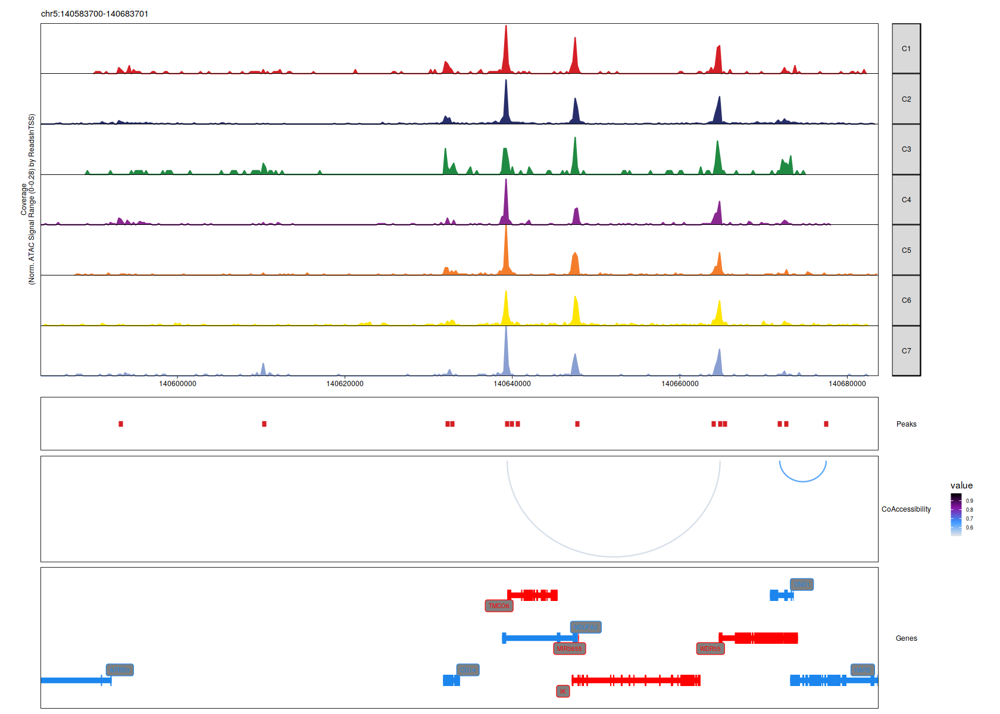

In [189]:
grid::grid.draw(p$CD14)

In [190]:
markerGenes  <- c(
    "HNF4A", #Early Progenitor
    "GATA6",
    "PDX1",
    "SOX9",
    "RFX6",
    "HNF1B",
    "ONECUT1",
    "NKX6-1",
    "RBPJL",
    "PTF1A"
  )

p <- plotBrowserTrack(
    ArchRProj = Aoib_w15_proj_multiome, 
    groupBy = "Clusters", 
    geneSymbol = markerGenes, 
    upstream = 5000,
    downstream = 100000,
    loops = getCoAccessibility(Aoib_w15_proj_multiome),
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-2b38863f2ef551-Date-2022-08-31_Time-21-25-03.log
If there is an issue, please report to github with logFile!



GRanges object with 10 ranges and 2 metadata columns:
       seqnames              ranges strand |     gene_id      symbol
          <Rle>           <IRanges>  <Rle> | <character> <character>
   [1]    chr20   44355700-44434596      + |        3172       HNF4A
   [2]    chr18   22169443-22202528      + |        2627       GATA6
   [3]    chr13   27920020-27926231      + |        3651        PDX1
   [4]    chr17   72121020-72126420      + |        6662        SOX9
   [5]     chr6 116877212-116932163      + |      222546        RFX6
   [6]    chr17   37686432-37745247      - |        6928       HNF1B
   [7]    chr15   52756989-52791078      - |        3175     ONECUT1
   [8]     chr4   84491987-84498450      - |        4825      NKX6-1
   [9]    chr20   45306851-45317824      + |       11317       RBPJL
  [10]    chr10   23192327-23194252      + |      256297       PTF1A
  -------
  seqinfo: 24 sequences from hg38 genome


Getting Region From Arrow Files 1 of 1

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Getting Region From Arrow Files 1 of 1

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Getting Region From Arrow Files 1 of 1

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guide

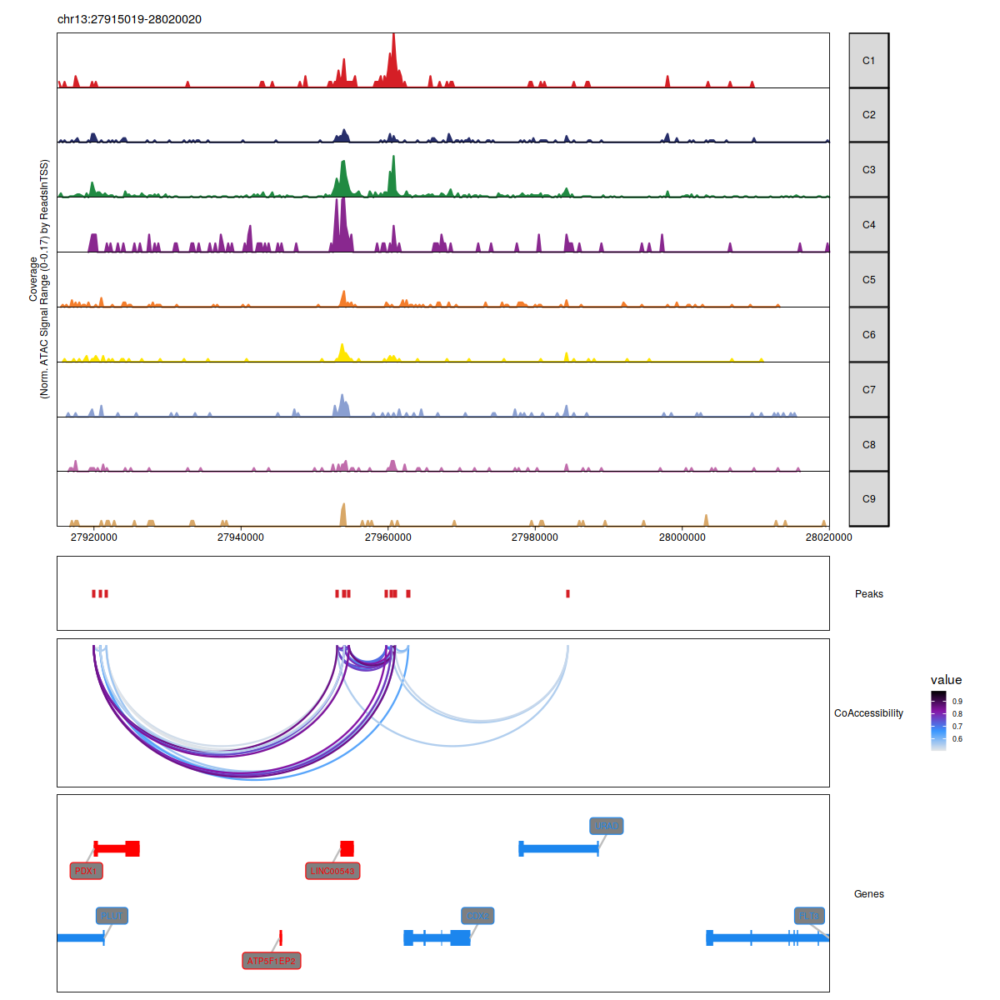

In [191]:
options(repr.plot.width=10, repr.plot.height=10)
grid::grid.draw(p$PDX1)

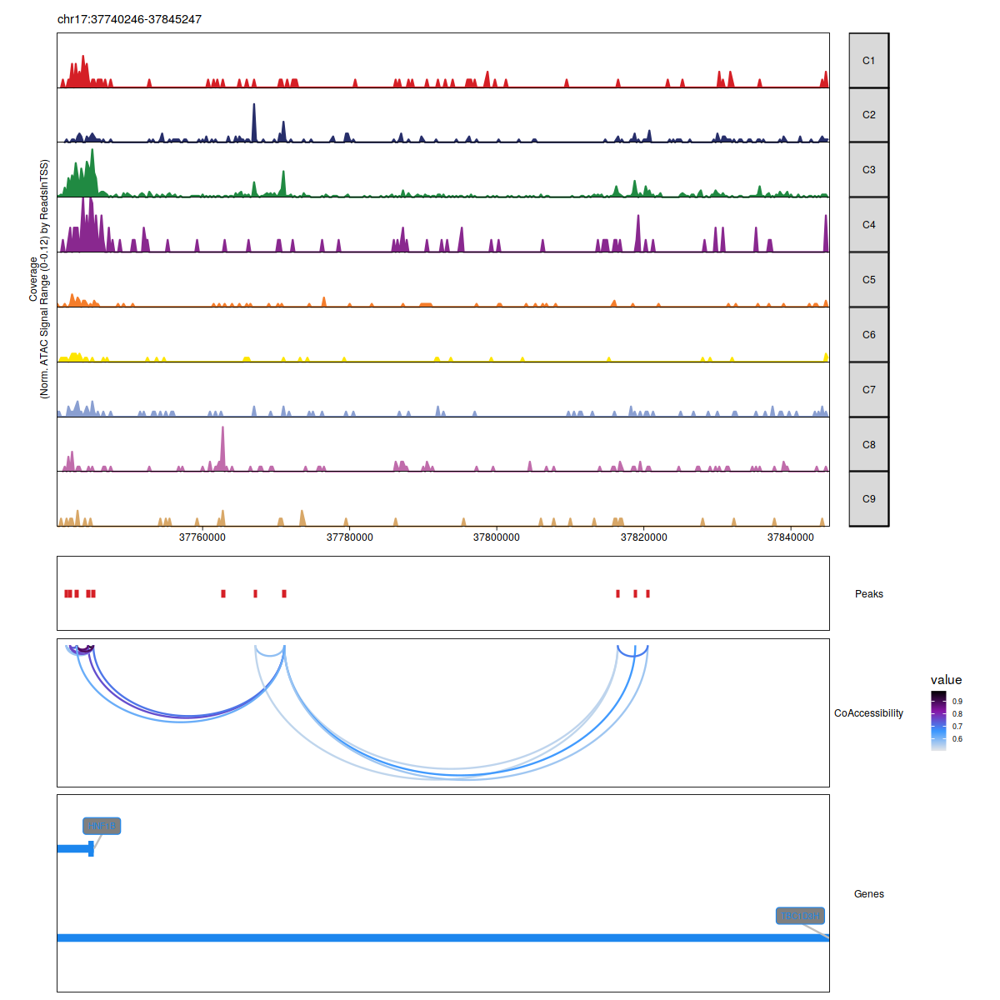

In [192]:
options(repr.plot.width=10, repr.plot.height=10)
grid::grid.draw(p$HNF1B)

In [193]:
plotPDF(plotList = p, 
    name = "Plot-Tracks-Marker-Genes-with-CoAccessibility.pdf", 
    ArchRProj = Aoib_w15_proj_multiome, 
    addDOC = FALSE, width = 5, height = 5)

Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


# Saving project

In [194]:
saveArchRProject(ArchRProj = Aoib_w15_proj_multiome, outputDirectory = "multiome_15W", load = FALSE)

Saving ArchRProject...



In [195]:
#Rachel_proj_multiome_7WPC <- loadArchRProject("multiome_7WPC")

In [119]:
#save.image('data.RData')

In [196]:
ArchRBrowser(ArchRProj = Aoib_w15_proj_multiome)

ArchR logging to : ArchRLogs/ArchR-ArchRBrowser-2b38865974cd42-Date-2022-08-31_Time-21-32-55.log
If there is an issue, please report to github with logFile!

Warning message:
“The select input "name" contains a large number of options; consider using server-side selectize for massively improved performance. See the Details section of the ?selectizeInput help topic.”

Listening on http://127.0.0.1:5215



ERROR: Error in launch.browser(appUrl): 'browser' must be a non-empty character string


In [4]:
#load('data.RData')

## Generating bigWig files

In [197]:
getGroupBW(ArchRProj = Aoib_w15_proj_multiome,
          groupBy = "Clusters",
          normMethod = "ReadsInTSS",
          tileSize = 100,
          maxCells = 1000)

ArchR logging to : ArchRLogs/ArchR-getGroupBW-2b38864b6d62cd-Date-2022-08-31_Time-21-33-04.log
If there is an issue, please report to github with logFile!

2022-08-31 21:33:18 : C1 (1 of 9) : Creating BigWig for Group, 0.23 mins elapsed.

2022-08-31 21:33:33 : C2 (2 of 9) : Creating BigWig for Group, 0.489 mins elapsed.

2022-08-31 21:33:51 : C3 (3 of 9) : Creating BigWig for Group, 0.789 mins elapsed.

2022-08-31 21:34:13 : C4 (4 of 9) : Creating BigWig for Group, 1.146 mins elapsed.

2022-08-31 21:34:27 : C5 (5 of 9) : Creating BigWig for Group, 1.38 mins elapsed.

2022-08-31 21:34:46 : C6 (6 of 9) : Creating BigWig for Group, 1.697 mins elapsed.

2022-08-31 21:35:02 : C7 (7 of 9) : Creating BigWig for Group, 1.963 mins elapsed.

2022-08-31 21:35:17 : C8 (8 of 9) : Creating BigWig for Group, 2.222 mins elapsed.

2022-08-31 21:35:34 : C9 (9 of 9) : Creating BigWig for Group, 2.511 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-getGroupBW-2b38864b6d62cd-Date-2022-08-31_Ti

[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Clusters/C1-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[2] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Clusters/C2-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[3] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Clusters/C3-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[4] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Clusters/C4-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[5] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Clusters/C5-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[6] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Clusters/C6-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[7] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Clusters/C7-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[8] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Clusters/C8-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[9] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Clusters/C9-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"

In [198]:
getGroupBW(ArchRProj = Aoib_w15_proj_multiome,
          groupBy = "Sample",
          normMethod = "ReadsInTSS",
          tileSize = 100,
          maxCells = 1000)

ArchR logging to : ArchRLogs/ArchR-getGroupBW-2b3886544e1587-Date-2022-08-31_Time-21-35-49.log
If there is an issue, please report to github with logFile!

2022-08-31 21:35:59 : multiome_15W (1 of 1) : Creating BigWig for Group, 0.155 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-getGroupBW-2b3886544e1587-Date-2022-08-31_Time-21-35-49.log



[1] "/home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W/GroupBigWigs/Sample/multiome_15W-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"

## Generating  co-accessibility as dataframe

In [199]:
cA <- getCoAccessibility(
    ArchRProj = Aoib_w15_proj_multiome,
    corCutOff = 0.8,
    resolution = 1000,
    returnLoops = TRUE
)

In [200]:
cA_DF <- as.data.frame(cA[[1]])

In [201]:
dim(cA_DF)

[1] 47703    14

In [202]:
cA_DF_mod <- data.frame(Peak1 = paste0(cA_DF$seqnames,'_',cA_DF$start,'_',cA_DF$start),
                       Peak2 = paste0(cA_DF$seqnames,'_',cA_DF$end,'_',cA_DF$end),
                       coaccess = cA_DF$value)

In [203]:
cA_DF_bed = data.frame(chrom = cA_DF$seqnames,
                      chromStart = cA_DF$start,
                      chromEnd = cA_DF$end,
                      name = 'EsophagusDevelop',
                      score = as.integer(cA_DF$value*1000),
                      value = cA_DF$value,
                      exp = '.',
                      color = '0',
                      sourceChrom = cA_DF$seqnames,
                       sourceStart = cA_DF$start,
                       sourceEnd = cA_DF$start,
                       sourceName = '.',
                       sourceStrand = '.',
                       targetChrom = cA_DF$seqnames,
                       targetStart = cA_DF$end,
                       targetEnd = cA_DF$end,
                       targetName = '.',
                       targetStrand = '.'
                      )

In [204]:
write.table(cA_DF,'coAccessibility.csv', sep='\t', quote=FALSE, row.names = FALSE)
write.table(cA_DF,'coAccessibility.bed', sep='\t', quote=FALSE, row.names = FALSE)
write.table(cA_DF_bed,'coAccessibility13.bed', sep='\t', quote=FALSE, row.names = FALSE)
write.table(cA_DF_mod,'coAccessibility_modified.csv', sep='\t', quote=FALSE, row.names = FALSE)

## 7. Identification of Positive TF-Regulators

ATAC-seq allows for the unbiased identification of TFs that exhibit large changes in chromatin accessibility at sites containing their DNA binding motifs. However, families of TFs (for ex. GATA factors) share similar features in their binding motifs when looking in aggregate through position weight matrices (PWMs).

This motif similarity makes it challenging to identify the specific TFs that might be driving observed changes in chromatin accessibility at their predicted binding sites. To circumvent this challenge, we have previously ATAC-seq and RNA-seq to identify TFs whose gene expression is positively correlated to changes in the accessibility of their corresponding motif. We term these TFs “positive regulators”. However, this analysis relies on matched gene expression data which may not be readily available in all experiments. To overcome this dependency, ArchR can identify TFs whose inferred gene scores are correlated to their chromVAR TF deviation z-scores. To achieve this, ArchR correlates chromVAR deviation z-scores of TF motifs with gene activity scores of TF genes from the low-overlapping cell aggregates. When using scRNA-seq integration with ArchR, gene expression of the TF can be used instead of inferred gene activity score.

### Step 1. Identify Deviant TF Motifs

The first part of identifying positive TF regulators is identification of deviant TF motifs. We performed this analysis in a previous chapter, creating a MotifMatrix of chromVAR deviations and deviation z-scores for all motifs. We can obtain this data, averaged by clusters, by using the getGroupSE() function which returns a SummarizedExperiment.

In [205]:
getAvailableMatrices(Aoib_w15_proj_multiome)

[1] "GeneExpressionMatrix" "GeneScoreMatrix"      "MotifMatrix"         
[4] "PeakMatrix"           "TileMatrix"

In [206]:
seGroupMotif <- getGroupSE(ArchRProj = Aoib_w15_proj_multiome, useMatrix = "MotifMatrix", groupBy = "Clusters_ATAC")

ArchR logging to : ArchRLogs/ArchR-getGroupSE-2b38863033e6d8-Date-2022-08-31_Time-21-36-38.log
If there is an issue, please report to github with logFile!

Getting Group Matrix

2022-08-31 21:36:38 : Constructing Group Matrix 1 of 2, 0 mins elapsed.

2022-08-31 21:36:39 : Finished Group Matrix 1 of 2, 0.024 mins elapsed.

2022-08-31 21:36:39 : Constructing Group Matrix 2 of 2, 0.025 mins elapsed.

2022-08-31 21:36:41 : Finished Group Matrix 2 of 2, 0.048 mins elapsed.

2022-08-31 21:36:41 : Successfully Created Group Matrix, 0.048 mins elapsed.

Normalizing by number of Cells

ArchR logging successful to : ArchRLogs/ArchR-getGroupSE-2b38863033e6d8-Date-2022-08-31_Time-21-36-38.log



Because this `SummarizedExperiment` object comes from the `MotifMatrix` is has two seqnames - “deviations” and “z” - corresponding to the raw deviations and deviation z-scores from chromVAR.

In [207]:
seGroupMotif

class: SummarizedExperiment 
dim: 1740 7 
metadata(0):
assays(1): MotifMatrix
rownames(1740): f1 f2 ... f1739 f1740
rowData names(3): seqnames idx name
colnames(7): C1 C2 ... C6 C7
colData names(21): TSSEnrichment ReadsInTSS ... FRIP nCells

We can subset this `SummarizedExperiment` to just the deviation z-scores.

In [208]:
seZ <- seGroupMotif[rowData(seGroupMotif)$seqnames=="z",]

Then we can identify the maximum delta in z-score between all clusters. This will be helpful in stratifying motifs based on the degree of variation observed across clusters.

In [209]:
rowData(seZ)$maxDelta <- lapply(seq_len(ncol(seZ)), function(x){
  rowMaxs(assay(seZ) - assay(seZ)[,x])
}) %>% Reduce("cbind", .) %>% rowMaxs

### Step 2. Identify Correlated TF Motifs and TF Gene Score/Expression

To identify TFs whose motif accessibility is correlated with with their own gene activity (either by gene score or gene expression), we use the `correlateMatrices()` function and provide the two matrices that we are interested in, in this case the `GeneScoreMatrix` and the `MotifMatrix`. As mentioned previously, these correlations are determined across many low-overlapping cell aggregates determined in the lower dimension space specified in the reducedDims parameter.

In [210]:
corGSM_MM <- correlateMatrices(
    ArchRProj = Aoib_w15_proj_multiome,
    useMatrix1 = "GeneScoreMatrix",
    useMatrix2 = "MotifMatrix",
    reducedDims = "LSI_Combined"
)

ArchR logging to : ArchRLogs/ArchR-correlateMatrices-2b38866910825f-Date-2022-08-31_Time-21-36-43.log
If there is an issue, please report to github with logFile!

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'z'!
If confused, try getFeatures(ArchRProj, 'MotifMatrix') to list out available seqnames for input!

2022-08-31 21:36:45 : Testing 869 Mappings!, 0.018 mins elapsed.

2022-08-31 21:36:45 : Computing KNN, 0.018 mins elapsed.

2022-08-31 21:36:45 : Identifying Non-Overlapping KNN pairs, 0.018 mins elapsed.

2022-08-31 21:36:46 : Identified 198 Groupings!, 0.034 mins elapsed.

2022-08-31 21:36:46 : Getting Group Matrix 1, 0.046 mins elapsed.

2022-08-31 21:37:16 : Getting Group Matrix 2, 0.549 mins elapsed.

Some entries in groupMat2 are less than 0, continuing without Log2 Normalization.
Most likely this assay is a deviations matrix.

Getting Correlations...

2022-08-31 21:37:19 : 

Computing Correlation (2

In [211]:
corGSM_MM

DataFrame with 869 rows and 14 columns
    GeneScoreMatrix_name MotifMatrix_name        cor        padj        pval
             <character>      <character>  <numeric>   <numeric>   <numeric>
1                   HES4          HES4_95  -0.521224 2.98511e-12 3.47106e-15
2                   HES5          HES5_98   0.393259 8.57579e-06 9.97184e-09
3                 PRDM16       PRDM16_211   0.604740 3.37766e-18 3.92751e-21
4                   TP73         TP73_705   0.784200 1.48742e-39 1.72956e-42
5               TP73-AS1         TP73_705  -0.316347 4.82938e-03 5.61556e-06
...                  ...              ...        ...         ...         ...
865                TFDP3        TFDP3_309  0.3325635 1.45657e-03 1.69368e-06
866               ZNF75D       ZNF75D_272  0.3863389 1.62657e-05 1.89137e-08
867                 ZIC3         ZIC3_215 -0.5032949 3.54557e-11 4.12276e-14
868                 SOX3         SOX3_759  0.5520028 2.98808e-14 3.47451e-17
869                MECP2        MECP2

We can perform the same analysis using the `GeneIntegrationMatrix` instead of the `GeneScoreMatrix`.

In [212]:
corGIM_MM <- correlateMatrices(
    ArchRProj = Aoib_w15_proj_multiome,
    useMatrix1 = "GeneExpressionMatrix",
    useMatrix2 = "MotifMatrix",
    reducedDims = "LSI_Combined"
)

ArchR logging to : ArchRLogs/ArchR-correlateMatrices-2b38865717f17c-Date-2022-08-31_Time-21-37-20.log
If there is an issue, please report to github with logFile!

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'z'!
If confused, try getFeatures(ArchRProj, 'MotifMatrix') to list out available seqnames for input!

2022-08-31 21:37:21 : Testing 898 Mappings!, 0.019 mins elapsed.

2022-08-31 21:37:21 : Computing KNN, 0.019 mins elapsed.

2022-08-31 21:37:21 : Identifying Non-Overlapping KNN pairs, 0.02 mins elapsed.

2022-08-31 21:37:22 : Identified 198 Groupings!, 0.036 mins elapsed.

2022-08-31 21:37:23 : Getting Group Matrix 1, 0.048 mins elapsed.

2022-08-31 21:37:52 : Getting Group Matrix 2, 0.532 mins elapsed.

Some entries in groupMat2 are less than 0, continuing without Log2 Normalization.
Most likely this assay is a deviations matrix.

Getting Correlations...

2022-08-31 21:37:55 : 

Computing Correlation (25

In [213]:
corGIM_MM

DataFrame with 898 rows and 14 columns
    GeneExpressionMatrix_name MotifMatrix_name        cor        padj
                  <character>      <character>  <numeric>   <numeric>
1                        HES4          HES4_95  0.0712689 1.00000e+00
2                        HES5          HES5_98 -0.0893603 1.00000e+00
3                   PRDM16-DT       PRDM16_211  0.8211633 9.61398e-47
4                      PRDM16       PRDM16_211  0.7772328 2.06932e-38
5                        TP73         TP73_705  0.5051777 2.47424e-11
...                       ...              ...        ...         ...
894                     TFDP3        TFDP3_309         NA          NA
895                    ZNF75D       ZNF75D_272         NA          NA
896                      ZIC3         ZIC3_215         NA          NA
897                      SOX3         SOX3_759  -0.407432 1.98240e-06
898                     MECP2        MECP2_645  -0.729375 2.90935e-31
           pval GeneExpressionMatrix_seqnames GeneE

### Step 3. Add Maximum Delta Deviation to the Correlation Data Frame

For each of these correlation analyses, we can annotate each motif with the maximum delta observed between clusters which we calculated in Step 1.

In [214]:
corGSM_MM$maxDelta <- rowData(seZ)[match(corGSM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]
corGIM_MM$maxDelta <- rowData(seZ)[match(corGIM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]

### Step 4. Identify Positive TF Regulators

We can use all of this information to identify positive TF regulators. In the examples below, we consider positive regulators as those TFs whose correlation between motif and gene score (or gene expression) is greater than 0.5 with an adjusted p-value less than 0.01 and a maximum inter-cluster difference in deviation z-score that is in the top quartile.

We apply these selection criteria and do a little text juggling to isolate the TF names.

In [215]:
corGSM_MM <- corGSM_MM[order(abs(corGSM_MM$cor), decreasing = TRUE), ]
corGSM_MM <- corGSM_MM[which(!duplicated(gsub("\\-.*","",corGSM_MM[,"MotifMatrix_name"]))), ]
corGSM_MM$TFRegulator <- "NO"
corGSM_MM$TFRegulator[which(corGSM_MM$cor > 0.5 & corGSM_MM$padj < 0.01 & corGSM_MM$maxDelta > quantile(corGSM_MM$maxDelta, 0.75))] <- "YES"
sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1])

[1] "BSX"      "CEBPA-DT" "CEBPB"    "CEBPD"    "CEBPG"    "DBX2"    
 [7] "DLX1"     "DLX2-DT"  "DLX3"     "DLX4"     "DLX5"     "DLX6-AS1"
[13] "DRGX"     "EHF"      "ELF3"     "ELF5"     "EN1"      "EVX2"    
[19] "FOS"      "FOSB"     "FOSL1"    "FOSL2"    "FOXA1"    "FOXA2"   
[25] "FOXA3"    "FOXB1"    "FOXJ1"    "FOXK2"    "GATA5"    "GATA6"   
[31] "GBX2"     "GRHL1"    "HNF1A"    "HNF1B"    "HNF4A"    "HNF4G"   
[37] "HOXB1"    "HOXB5"    "HOXD1"    "ISX"      "JUN"      "JUNB"    
[43] "KLF1"     "KLF3-AS1" "LBX1"     "LHX1"     "LHX5-AS1" "LHX9"    
[49] "LMX1A"    "MAFK"     "MIXL1"    "NFATC2"   "NFE2"     "NR2E1"   
[55] "PHOX2A"   "PHOX2B"   "POU6F2"   "PRRX2"    "RFX7"     "RUNX1"   
[61] "RXRB"     "SHOX2"    "SMARCC1"  "TCF21"    "TCF3"     "TFAP4"   
[67] "TP63"     "TP73"     "VSX1"     "VSX2"     "VTN"      "ZFHX2"   
[73] "ZFHX3"

Having identified these positive TF regulators from gene scores and motif deviation z-scores, we can highlight them in a dot plot.

In [216]:
library(ggrepel)

<ScaleContinuousPosition>
 Range:  
 Limits:    0 -- 15.4

Warning message:
“Removed 8 rows containing missing values (geom_point).”
Warning message:
“Removed 8 rows containing missing values (geom_text_repel).”
Warning message:
“ggrepel: 691 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


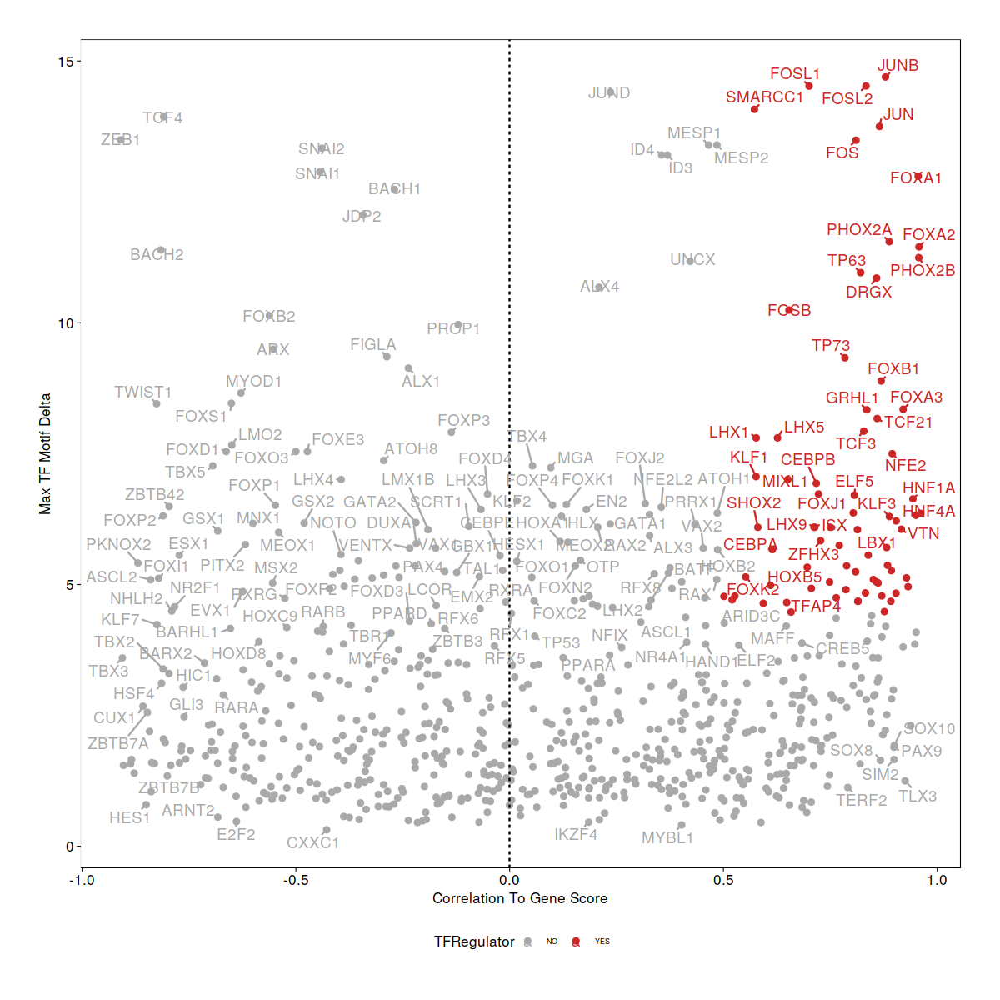

In [217]:
df <- data.frame(corGSM_MM)
p <- ggplot(df, aes(cor, maxDelta, color = TFRegulator)) +
  geom_point() + 
  theme_ArchR() +
  geom_vline(xintercept = 0, lty = "dashed") + 
  scale_color_manual(values = c("NO"="darkgrey", "YES"="firebrick3")) +
  xlab("Correlation To Gene Score") +
  ylab("Max TF Motif Delta") +
  geom_text_repel(aes(cor, maxDelta, label = GeneScoreMatrix_matchName), min.segment.length = 0.1)
  scale_y_continuous(
    expand = c(0,0), 
    limits = c(0, max(corGSM_MM$maxDelta)*1.05)
  )

p

In [218]:
pdf('multiome_15W/Plots/Correlation_with_Motif_GeneScore.pdf')
p
dev.off()

Warning message:
“Removed 8 rows containing missing values (geom_point).”
Warning message:
“Removed 8 rows containing missing values (geom_text_repel).”
Warning message:
“ggrepel: 689 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


X11cairo 
       2

In [219]:
corGIM_MM <- corGIM_MM[order(abs(corGIM_MM$cor), decreasing = TRUE), ]
corGIM_MM <- corGIM_MM[which(!duplicated(gsub("\\-.*","",corGIM_MM[,"MotifMatrix_name"]))), ]
corGIM_MM$TFRegulator <- "NO"
corGIM_MM$TFRegulator[which(corGIM_MM$cor > 0.5 & corGIM_MM$padj < 0.01 & corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.75))] <- "YES"
sort(corGIM_MM[corGIM_MM$TFRegulator=="YES",1])

[1] "CEBPD"    "DBX2"     "DLX1"     "DLX2"     "DLX3"     "DLX5"    
 [7] "DLX6"     "EHF"      "ELF3-AS1" "ESRRA"    "ESRRG"    "FOSL1"   
[13] "FOSL2"    "FOXA1"    "FOXA2"    "FOXA3"    "FOXK2"    "FOXN3"   
[19] "GATA6"    "GRHL1"    "HNF1A"    "HNF1B"    "HNF4A"    "HNF4G"   
[25] "HOXB5"    "JUN"      "JUNB"     "KLF3"     "LBX1-AS1" "NFATC3"  
[31] "PHOX2A"   "PHOX2B"   "RUNX1"    "RXRA"     "SMARCC1"  "TCF21"   
[37] "TFAP4"    "TP63"     "TP73"     "VTN"

<ScaleContinuousPosition>
 Range:  
 Limits:    0 -- 15.4

Warning message:
“Removed 110 rows containing missing values (geom_point).”
Warning message:
“Removed 110 rows containing missing values (geom_text_repel).”
Warning message:
“ggrepel: 596 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


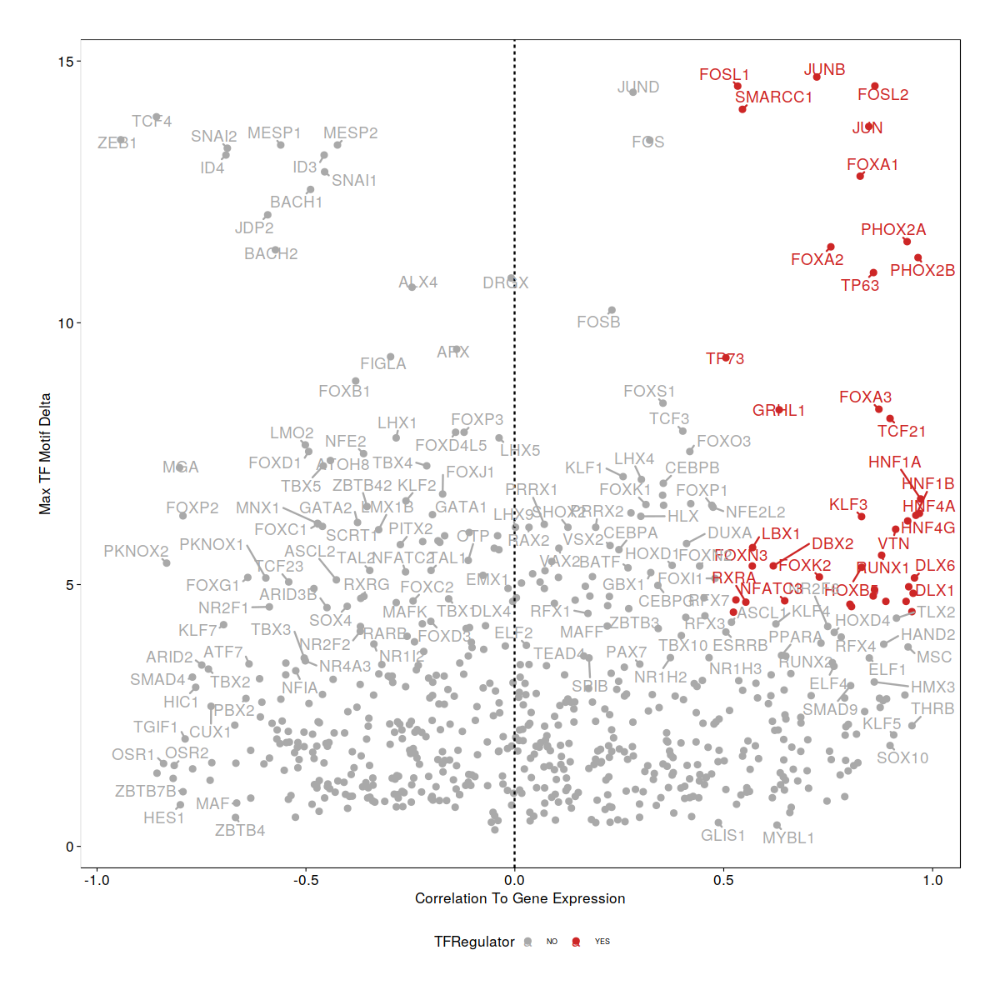

In [220]:
df <- data.frame(corGIM_MM)
p <- ggplot(df, aes(cor, maxDelta, color = TFRegulator)) +
  geom_point() + 
  theme_ArchR() +
  geom_vline(xintercept = 0, lty = "dashed") + 
  scale_color_manual(values = c("NO"="darkgrey", "YES"="firebrick3")) +
  xlab("Correlation To Gene Expression") +
  ylab("Max TF Motif Delta") +
  geom_text_repel(aes(cor, maxDelta, label = GeneExpressionMatrix_matchName), min.segment.length = 0.1)
  scale_y_continuous(
    expand = c(0,0), 
    limits = c(0, max(corGSM_MM$maxDelta)*1.05)
  )

p

In [221]:
pdf('multiome_15W/Plots/Correlation_with_Motif_GeneExpression.pdf')
p
dev.off()

Warning message:
“Removed 110 rows containing missing values (geom_point).”
Warning message:
“Removed 110 rows containing missing values (geom_text_repel).”
Warning message:
“ggrepel: 595 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


X11cairo 
       2

# Saving project

In [222]:
saveArchRProject(ArchRProj = Aoib_w15_proj_multiome, outputDirectory = "multiome_15W", load = FALSE)

Saving ArchRProject...



In [223]:
Aoib_w15_proj_multiome


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /home/mqbsxsm2/Rna-seq_Data-Analysis/Aoibheann_Mullan_All_Esophagus_Analysis/Multiome_15W/multiome_15W 
samples(1): multiome_15W
sampleColData names(1): ArrowFiles
cellColData names(25): Sample TSSEnrichment ... ReadsInPeaks FRIP
numberOfCells(1): 1287
medianTSS(1): 10.156
medianFrags(1): 22542

In [4]:
Aoib_w15_proj_multiome <- loadArchRProject(path="multiome_15W")

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [224]:
#Rachel_proj_multiome_7WPC <- loadArchRProject(path="multiome_7WPC")

In [13]:
GE_matrix <- getMatrixFromProject(Aoib_w15_proj_multiome, 'GeneExpressionMatrix')

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-263d4f5e8b9f-Date-2023-09-21_Time-10-36-09.log
If there is an issue, please report to github with logFile!

2023-09-21 10:36:14 : Organizing colData, 0.087 mins elapsed.

2023-09-21 10:36:14 : Organizing rowData, 0.087 mins elapsed.

2023-09-21 10:36:14 : Organizing rowRanges, 0.087 mins elapsed.

2023-09-21 10:36:14 : Organizing Assays (1 of 1), 0.087 mins elapsed.

2023-09-21 10:36:14 : Constructing SummarizedExperiment, 0.087 mins elapsed.

2023-09-21 10:36:15 : Finished Matrix Creation, 0.101 mins elapsed.



In [9]:
GE_variable_dev <- getVarDeviations(Aoib_w15_proj_multiome, 'GeneExpressionMatrix')

ERROR: Error in `rownames<-`(`*tmp*`, value = value[[1L]]): invalid rownames length


In [14]:
GE_matrix

class: SummarizedExperiment 
dim: 36438 1240 
metadata(0):
assays(1): GeneExpressionMatrix
rownames: NULL
rowData names(6): seqnames idx ... name strand
colnames(1240): multiome_15W#CGTTTGGAGGAACCGG-1
  multiome_15W#GAGTGATCAGTCTATG-1 ... multiome_15W#ACCACACCATCGCTCC-1
  multiome_15W#CTGGTAAGTCATTAGG-1
colData names(26): BlacklistRatio DoubletEnrichment ... ReadsInPeaks
  FRIP

In [15]:
colData(GE_matrix)

DataFrame with 1240 rows and 26 columns
                                     BlacklistRatio DoubletEnrichment
                                            <array>           <array>
multiome_15W#CGTTTGGAGGAACCGG-1  0.0041444820909971               2.4
multiome_15W#GAGTGATCAGTCTATG-1 0.00543142634418944                 9
multiome_15W#ATGAAGCCACCTGCTC-1 0.00568605232801478              14.2
multiome_15W#TTGTTGTTCCTCACAC-1 0.00456059889352775               3.8
multiome_15W#GACAATACATTAGCCA-1 0.00374429034563477               5.6
...                                             ...               ...
multiome_15W#ACTATCCGTTAGGTGC-1 0.00772200772200772               1.2
multiome_15W#CTTGCATGTAACCAGC-1 0.00389863547758285               0.8
multiome_15W#CCCTAATGTTGTCCAT-1 0.00489715964740451               0.2
multiome_15W#ACCACACCATCGCTCC-1  0.0157946692991115               0.6
multiome_15W#CTGGTAAGTCATTAGG-1 0.00839920948616601                 1
                                    DoubletScore  

In [16]:
rowData(GE_matrix)

DataFrame with 36438 rows and 6 columns
      seqnames     idx     start       end        name  strand
         <Rle> <array>   <array>   <array>     <array> <array>
1         chr1       1     29553     30267 MIR1302-2HG       3
2         chr1       2     36080     36081     FAM138A       3
3         chr1       3     65418     69055       OR4F5       3
4         chr1       4     91104     91105  AL627309.3       3
5         chr1       5    120931    133723  AL627309.1       3
...        ...     ...       ...       ...         ...     ...
36434     chrX    1142 155612876 155612952       TMLHE       3
36435     chrX    1143 155767811 155767812       SPRY3       3
36436     chrX    1144 155881344 155881378       VAMP7       3
36437     chrX    1145 155997580 155997706        IL9R       3
36438     chrX    1146 156016836 156016837      WASIR1       3

In [17]:
saveRDS(GE_matrix,'GE_matrix.RDS')

In [116]:
PE_matrix <- getMatrixFromProject(Aoib_w15_proj_multiome, 'PeakMatrix')

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-3ab02d08b13c-Date-2023-06-06_Time-09-48-26.log
If there is an issue, please report to github with logFile!



ERROR: Error in getMatrixFromProject(Aoib_w15_proj_multiome, "PeakMatrix"): useMatrix is not in Available Matrices see getAvailableMatrices


In [230]:
PE_matrix

class: RangedSummarizedExperiment 
dim: 207177 1287 
metadata(0):
assays(1): PeakMatrix
rownames: NULL
rowData names(1): idx
colnames(1287): multiome_15W#CGTTTGGAGGAACCGG-1
  multiome_15W#GAGTGATCAGTCTATG-1 ... multiome_15W#ACCACACCATCGCTCC-1
  multiome_15W#CTGGTAAGTCATTAGG-1
colData names(25): BlacklistRatio DoubletEnrichment ... ReadsInPeaks
  FRIP

In [231]:
PeakSet <- getPeakSet(Aoib_w15_proj_multiome)

In [236]:
PeakSet.DF <- data.frame(PeakSet)

In [239]:
head(paste0(PeakSet.DF[,1],'_',PeakSet.DF[,2], '_',PeakSet.DF[,3]))

[1] "chr1_818014_818514" "chr1_818517_819017" "chr1_819802_820302"
[4] "chr1_827291_827791" "chr1_858590_859090" "chr1_869660_870160"

In [240]:
rownames(PE_matrix) <- paste0(PeakSet.DF[,1],'_',PeakSet.DF[,2], '_',PeakSet.DF[,3])

In [241]:
saveRDS(PE_matrix,'PE_matrix.RDS')

In [222]:
UMAP_Combined <- getEmbedding(Rachel_proj_multiome_7WPC, embedding = "UMAP_Combined", returnDF=TRUE)
UMAP_ATAC <- getEmbedding(Rachel_proj_multiome_7WPC, embedding = "UMAP_ATAC", returnDF=TRUE)
UMAP_RNA <- getEmbedding(Rachel_proj_multiome_7WPC, embedding = "UMAP_RNA", returnDF=TRUE)

In [223]:
UMAP_Combined <- cbind(UMAP_Combined, colData(GE_matrix)[,c('Clusters','Clusters_ATAC','Clusters_RNA')])
UMAP_Combined

,LSI_Combined#UMAP_Dimension_1,LSI_Combined#UMAP_Dimension_2,Clusters,Clusters_ATAC,Clusters_RNA
,<dbl>,<dbl>,<chr>,<chr>,<chr>
multiome_7WPC#TCAGGAGCAGTACCGT-1,-6.13586457,2.03408286,C11,C4,C6
multiome_7WPC#ATGTAACGTTAATGAC-1,5.66388576,-2.37111873,C2,C1,C1
multiome_7WPC#TCTTGTCCAATACTGT-1,-4.69179471,9.75651532,C10,C5,C5
multiome_7WPC#GGGCATGAGAGAGCCG-1,-5.19855673,2.11844888,C11,C4,C6
multiome_7WPC#GGTATTTCATGATTGT-1,-5.30250580,5.44264537,C12,C4,C7
multiome_7WPC#CGTTATTTCGCTAGTG-1,-1.91462190,0.98448962,C7,C3,C9
multiome_7WPC#GCAGGACCAAAGGCCA-1,-4.71852191,6.26380878,C12,C4,C7
multiome_7WPC#GTGCTCAAGAAGGTGC-1,-2.12728722,1.18584615,C7,C3,C9
multiome_7WPC#AGGATCCGTCATCATC-1,-2.05303342,1.82170885,C13,C4,C9


In [224]:
write.table(UMAP_Combined, 'UMAP_Combined.tsv')

In [225]:
UMAP_RNA <- cbind(UMAP_RNA, colData(GE_matrix)[,c('Clusters','Clusters_ATAC','Clusters_RNA')])
write.table(UMAP_RNA, 'UMAP_RNA.tsv')

In [226]:
UMAP_ATAC <- cbind(UMAP_ATAC, colData(GE_matrix)[,c('Clusters','Clusters_ATAC','Clusters_RNA')])
write.table(UMAP_ATAC, 'UMAP_ATAC.tsv')

## Motif deviation and gene expression in epithelical cells

In [3]:
Aoib_w15_proj_multiome <- loadArchRProject('multiome_15W')

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [13]:
table(Aoib_w15_proj_multiome$Clusters2)


                         Basal_and_pre_squamous_epithelial 
                                                       175 
             BO_secretory_gastric_or_intestinal_epithelial 
                                                        44 
BO_stem_like_transitional_gastric_or_intestinal_epithelial 
                                                       279 
                                       Ciliated_epithelial 
                                                        55 
                                             Enteric_glial 
                                                       137 
                                          Enteric_neuronal 
                                                       199 
                                     Immune_or_Endothelial 
                                                        99 
                                             Smooth_muscle 
                                                        72 
                                       

In [11]:
getAvailableMatrices(Aoib_w15_proj_multiome)

[1] "GeneExpressionMatrix" "GeneScoreMatrix"      "MotifMatrix"         
[4] "PeakMatrix"           "TileMatrix"

In [14]:
#cellNames <- getCellNames(aoibAggrproj_v2[!((aoibAggrproj_v2$Clusters2 %in% c(NA)) | (aoibAggrproj_v2$Clusters2 %in% 
#                      c('7w_rep2_4_Epithelial/progenitor_snATAC_clust_C2', '7w_rep2_8_Epithelial/stromal_snATAC_clust_C2')))])

cellNames <- getCellNames(Aoib_w15_proj_multiome[(Aoib_w15_proj_multiome$Clusters2 %in% c('Basal_and_pre_squamous_epithelial', 
                                                            'BO_secretory_gastric_or_intestinal_epithelial',
                                                           'BO_stem_like_transitional_gastric_or_intestinal_epithelial',
                                                           'Ciliated_epithelial'))])

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-261422021172b-Date-2023-09-07_Time-10-07-25.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-261422021172b-Date-2023-09-07_Time-10-07-25.log



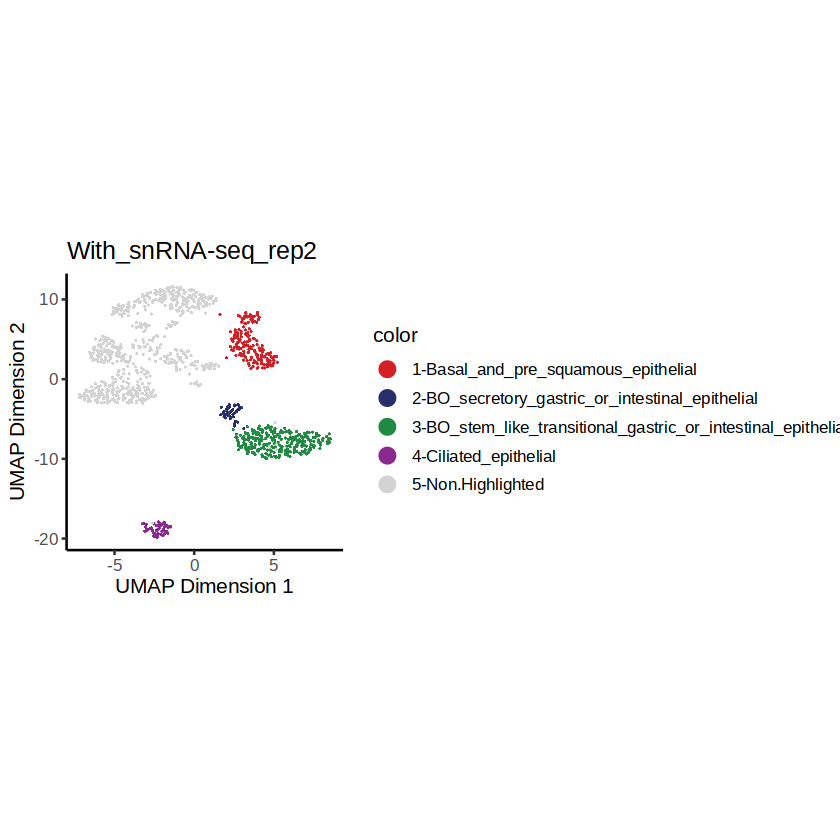

In [16]:
plot4 <- plotEmbedding(
    Aoib_w15_proj_multiome, 
    colorBy = "cellColData", 
    name = "Clusters2", 
    #name = "Clusters",
    #pal = c_clust_col,
    highlightCells = cellNames,
    embedding = 'UMAP_Combined',
    size=1.7,
    plot = "points",
    labelMeans = FALSE
)  +
    theme_classic(base_size=12) + 
    ggtitle('With_snRNA-seq_rep2')+
    guides(colour = guide_legend(override.aes = list(size=4)))
   
plot4

In [17]:
head(plot4$data)

,x,y,color
,<dbl>,<dbl>,<fct>
1017,-0.4607738,9.423292,5-Non.Highlighted
471,4.3991484,1.819397,1-Basal_and_pre_squamous_epithelial
1211,7.6817645,-7.033607,3-BO_stem_like_transitional_gastric_or_intestinal_epithelial
330,2.7128457,-7.668745,3-BO_stem_like_transitional_gastric_or_intestinal_epithelial
37,3.7811726,7.229112,1-Basal_and_pre_squamous_epithelial
878,-2.4105145,11.159366,5-Non.Highlighted


In [18]:
df <- plot4$data

In [19]:
head(df)

,x,y,color
,<dbl>,<dbl>,<fct>
1017,-0.4607738,9.423292,5-Non.Highlighted
471,4.3991484,1.819397,1-Basal_and_pre_squamous_epithelial
1211,7.6817645,-7.033607,3-BO_stem_like_transitional_gastric_or_intestinal_epithelial
330,2.7128457,-7.668745,3-BO_stem_like_transitional_gastric_or_intestinal_epithelial
37,3.7811726,7.229112,1-Basal_and_pre_squamous_epithelial
878,-2.4105145,11.159366,5-Non.Highlighted


In [39]:
df_filt <- df[!(df$color %in% c('5-Non.Highlighted')),]

In [40]:
names(table(df_filt$color))

[1] "1-Basal_and_pre_squamous_epithelial"                         
[2] "2-BO_secretory_gastric_or_intestinal_epithelial"             
[3] "3-BO_stem_like_transitional_gastric_or_intestinal_epithelial"
[4] "4-Ciliated_epithelial"                                       
[5] "5-Non.Highlighted"

In [41]:
head(df_filt)

,x,y,color
,<dbl>,<dbl>,<fct>
471,4.399148,1.819397,1-Basal_and_pre_squamous_epithelial
1211,7.681764,-7.033607,3-BO_stem_like_transitional_gastric_or_intestinal_epithelial
330,2.712846,-7.668745,3-BO_stem_like_transitional_gastric_or_intestinal_epithelial
37,3.781173,7.229112,1-Basal_and_pre_squamous_epithelial
485,3.431755,3.718295,1-Basal_and_pre_squamous_epithelial
874,-1.805070,-18.263375,4-Ciliated_epithelial


In [42]:
getAvailableMatrices(Aoib_w15_proj_multiome)

[1] "GeneExpressionMatrix" "GeneScoreMatrix"      "MotifMatrix"         
[4] "PeakMatrix"           "TileMatrix"

In [27]:
Aoib_w15_proj_multiome <- addImputeWeights(Aoib_w15_proj_multiome, reducedDims = 'LSI_Combined')

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-2614221108a2e-Date-2023-09-07_Time-10-09-44.log
If there is an issue, please report to github with logFile!

2023-09-07 10:09:44 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



In [30]:
#motifs <- c("GATA1", "CEBPA", "EBF1", "IRF4", "TBX21", "PAX5")
motifs <- c('GATA4','GATA6','FOXA1','FOXA2','FOXA3','HNF1A','HNF1B','HNF4A','HNF4G')
markerMotifs <- getFeatures(Aoib_w15_proj_multiome, select = paste(motifs, collapse="|"), useMatrix = "MotifMatrix")
markerMotifs

[1] "z:HNF4G_688"          "z:HNF4A_662"          "z:HNF1A_473"         
 [4] "z:HNF1B_428"          "z:GATA6_387"          "z:GATA4_386"         
 [7] "z:FOXA3_366"          "z:FOXA1_357"          "z:FOXA2_355"         
[10] "deviations:HNF4G_688" "deviations:HNF4A_662" "deviations:HNF1A_473"
[13] "deviations:HNF1B_428" "deviations:GATA6_387" "deviations:GATA4_386"
[16] "deviations:FOXA3_366" "deviations:FOXA1_357" "deviations:FOXA2_355"

In [33]:
#motifAndy <- c('z:TP63_704', 'z:HNF4A_662', 'z:HNF4G_688','z:KLF5_175', 'z:HNF1A_473','z:HNF1B_428','z:GRHL1_391', 'z:GATA4_386','z:GATA6_387','z:FOXA3_366')
motifAndy <- markerMotifs[grep('z',markerMotifs)]

In [34]:
motifAndy

[1] "z:HNF4G_688" "z:HNF4A_662" "z:HNF1A_473" "z:HNF1B_428" "z:GATA6_387"
[6] "z:GATA4_386" "z:FOXA3_366" "z:FOXA1_357" "z:FOXA2_355"

In [53]:
p2_Andy <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "MotifMatrix", 
    name = motifAndy, 
    continuousSet = "solarExtra",
    embedding = "UMAP_Combined",
    baseSize = 6,
    size=1,
    plotAs='points',
    imputeWeights = getImputeWeights(Aoib_w15_proj_multiome)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-261427515c940-Date-2023-09-07_Time-10-24-07.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2023-09-07 10:24:08 : 

1 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-261427515c940-Date-2023-09-07_Time-10-24-07.log



In [54]:
p2_Andy[[1]]$labels$title

[1] "UMAP_Combined of LSI_Combined colored by\nMotifMatrix : z:HNF4G_688"

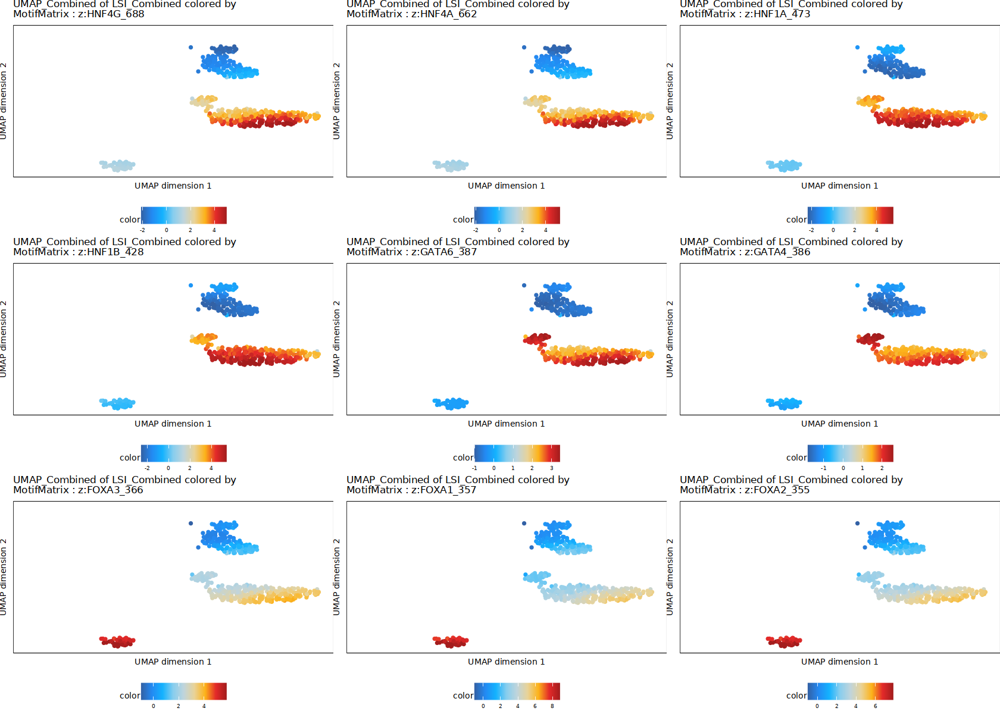

In [55]:
options(repr.plot.width=14, repr.plot.height=10)


p2c_Andy <- lapply(p2_Andy, function(x){
    df_tmp <- x$data
    df_tmp <- df_tmp[rownames(df_filt),]
    ggplot(df_tmp, aes(x=x,y=y, color=color)) + geom_point(size=1) + 
        theme_ArchR(baseSize = 8) +
        theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
        theme(
            axis.text.x=element_blank(), 
            axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(), 
            axis.ticks.y=element_blank()
        )  + 
        scale_colour_gradientn(colors= paletteContinuous(set = 'solarExtra')) + xlim(min(df$x), max(df$x)) + ylim(min(df$y), max(df$y)) +
        #guides(colour = guide_legend(override.aes = list(size=4))) + 
                            xlab('UMAP dimension 1') + ylab('UMAP dimension 2')+
                ggtitle(x$labels$title)
   
})

#do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c_Andy))

In [57]:
png('multiome_15W/Plots/15W_multiome_epi_MotifMatrix_epi_only.png', res=300, width=2500, height=3000)
do.call(cowplot::plot_grid, c(list(ncol = 3), p2c_Andy))
dev.off()

png 
  2

In [64]:
#geneMarker = c('ATP4B','ESRRG','SIK2','FUT8','ADAM28','SLC12A2','PARD3','ANXA1','IKZF2','NEK10','ZBBX','DNAH12')
geneMarker = c('ATP4B','FUT8','PARD3','NEK10')

In [65]:
p2_Andy <- plotEmbedding(
    ArchRProj = Aoib_w15_proj_multiome, 
    colorBy = "GeneExpressionMatrix", 
    name = geneMarker, 
    continuousSet = "horizonExtra",
    embedding = "UMAP_Combined",
    baseSize = 6,
    size=1,
    plotAs='points',
    imputeWeights = getImputeWeights(Aoib_w15_proj_multiome)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-261427eed7400-Date-2023-09-07_Time-14-26-27.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneExpressionMatrix

Getting Matrix Values...

2023-09-07 14:26:27 : 

1 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-261427eed7400-Date-2023-09-07_Time-14-26-27.log



In [66]:
p2_Andy[[1]]$labels$title

[1] "UMAP_Combined of LSI_Combined colored by\nGeneExpressionMatrix : ATP4B"

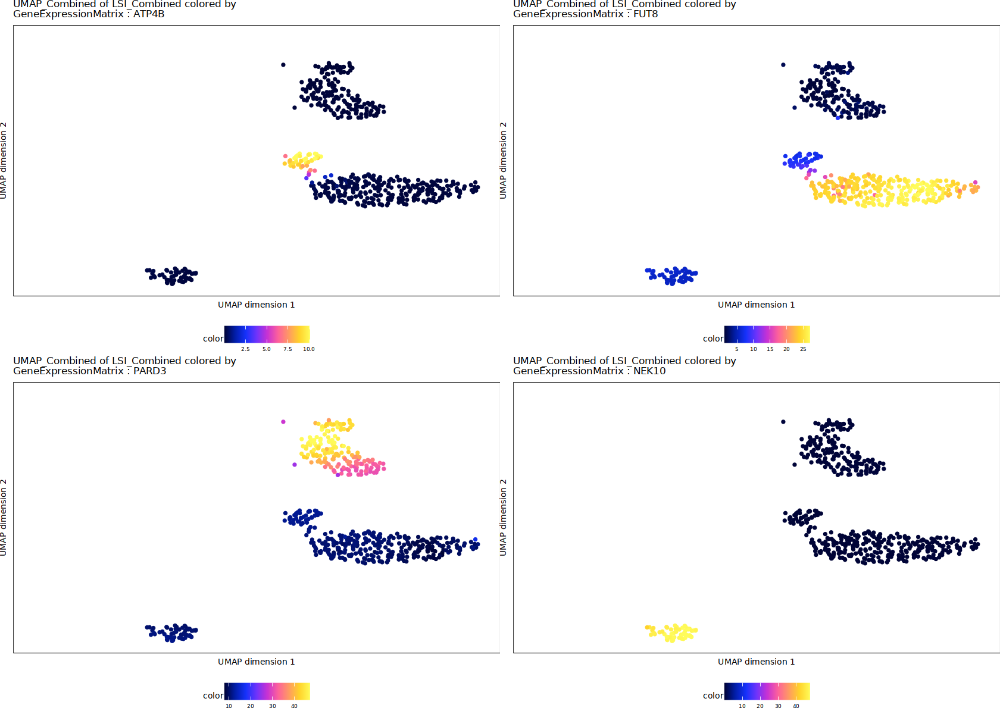

In [68]:
options(repr.plot.width=14, repr.plot.height=10)


p2c_Andy <- lapply(p2_Andy, function(x){
    df_tmp <- x$data
    df_tmp <- df_tmp[rownames(df_filt),]
    ggplot(df_tmp, aes(x=x,y=y, color=color)) + geom_point(size=1) + 
        theme_ArchR(baseSize = 8) +
        theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
        theme(
            axis.text.x=element_blank(), 
            axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(), 
            axis.ticks.y=element_blank()
        )  + 
        scale_colour_gradientn(colors= paletteContinuous(set = 'horizonExtra')) + xlim(min(df$x), max(df$x)) + ylim(min(df$y), max(df$y)) +
        #guides(colour = guide_legend(override.aes = list(size=4))) + 
                            xlab('UMAP dimension 1') + ylab('UMAP dimension 2')+
                ggtitle(x$labels$title)
   
})

#do.call(cowplot::plot_grid, c(list(ncol = 3), p1c))
do.call(cowplot::plot_grid, c(list(ncol = 2), p2c_Andy))

In [70]:
png('multiome_15W/Plots/15w_multiome_epi_GeneIntegrationMatrix_epi_only.png', res=300, width=2500, height=3000)
do.call(cowplot::plot_grid, c(list(ncol = 2), p2c_Andy))
dev.off()

png 
  2

## Removing reduntant motifs (using updated ArchR)
The script used to make the “version 2” motifs (curated from the large master list for less redundancy) is shown below

In [72]:
library(BSgenome.Hsapiens.UCSC.hg38)
library(tidyr)

In [73]:
#devtools::install_github("GreenleafLab/ArchR", ref="release_1.0.0", repos = BiocManager::repositories())
#system("wget https://jeffgranja.s3.amazonaws.com/ArchR/Annotations/Vierstra-Human-Motifs.rds")
motifPWMs <- readRDS("../snATAC-seq_9W_solving_vshape_cells/Vierstra-Human-Motifs.rds")

In [74]:
motifPWMs

Loading required package: TFBSTools




Attaching package: ‘TFBSTools’


The following object is masked from ‘package:HDF5Array’:

    matrixClass


The following object is masked from ‘package:DelayedArray’:

    matrixClass


The following object is masked from ‘package:Matrix’:

    Matrix




PWMatrixList of length 2174
names(2174): AHR_1#AHR:bHLH:284:1 ... ZSCAN4_2174#ZSCAN4:C2H2:286:0

In [75]:
head(names(motifPWMs),50)

[1] "AHR_1#AHR:bHLH:284:1"                "AHR_2#AHR:bHLH:284:0"               
 [3] "Ahr+Arnt_3#AHR:bHLH:284:0"           "AIRE_4#AIRE:not_classified:139:1"   
 [5] "AIRE_5#AIRE:not_classified:139:0"    "ALX1_6#HD/8:homeodomain:8:1"        
 [7] "Alx1_7#HD/2:homeodomain:2:0"         "ALX1_8#HD/8:homeodomain:8:0"        
 [9] "Alx1_9#HD/2:homeodomain:2:0"         "Alx1_10#HD/8:homeodomain:8:0"       
[11] "ALX3_11#HD/2:homeodomain:2:0"        "ALX3_12#HD/2:homeodomain:2:0"       
[13] "ALX3_13#HD/8:homeodomain:8:0"        "ALX3_14#HD/2:homeodomain:2:1"       
[15] "ALX4_15#HD/8:homeodomain:8:0"        "Alx4_16#HD/2:homeodomain:2:0"       
[17] "Alx4_17#HD/8:homeodomain:8:0"        "ANDR_18#FOX/4:forkhead:79:1"        
[19] "ANDR_19#NR/20:nuclearreceptor:248:1" "AP2A_20#TFAP2/1:TFAP:264:1"         
[21] "AP2A_21#TFAP2/1:TFAP:264:0"          "AP2B_22#TFAP2/1:TFAP:264:0"         
[23] "AP2B_23#TFAP2/1:TFAP:264:0"          "AP2C_24#TFAP2/1:TFAP:264:0"         
[25] "AP2C_25#TFAP2/1:TFAP:264:0"          "Ar_26#NR/20:nuclearreceptor:248:0"  
[27] "AR_27#NR/20:nuclearreceptor:248:0"   "AR_28#NR/20:nuclearreceptor:248:0"  
[29] "Ar_29#NR/20:nuclearreceptor:248:0"   "ARI5B_30#ARI5B:ARID:86:1"           
[31] "ARI5B_31#ARI5B:ARID:86:0"            "Arid3a_32#HD/18:homeodomain:24:1"   
[33] "Arid3b_33#HD/2:homeodomain:2:0"      "Arid5a_34#ARI5A:ARID:88:1"          
[35] "ARNT_35#HIF:bHLH:60:0"               "Arnt_36#Ebox/CACGTG/1:bHLH:58:0"    
[37] "ARNT_37#HIF:bHLH:60:0"               "ARNT+HIF1A_38#HIF:bHLH:60:1"        
[39] "ARNTL_39#Ebox/CACGTG/1:bHLH:58:1"    "Arntl_40#Ebox/CACGTG/1:bHLH:58:0"   
[41] "ARX_41#HD/8:homeodomain:8:0"         "Arx_42#HD/2:homeodomain:2:0"        
[43] "Arx_43#HD/8:homeodomain:8:0"         "ASCL1_44#Ebox/CAGCTG:bHLH:65:1"     
[45] "ASCL1_45#Ebox/CAGCTG:bHLH:65:0"      "ASCL1_46#Ebox/CAGCTG:bHLH:65:0"     
[47] "Ascl2_47#Ebox/CAGCTG:bHLH:65:0"      "ASCL2_48#Ebox/CAGCTG:bHLH:65:0"     
[49] "Ascl2_49#Ebox/CAGCTG:bHLH:65:0"      "ATF1_50#CREB/ATF/1:bZIP:49:1"

In [76]:
names(motifPWMs)[grep('HNF4A',names(motifPWMs))]

[1] "HNF4A_724#NR/1:nuclearreceptor:30:1" "HNF4A_726#NR/1:nuclearreceptor:30:0"
[3] "HNF4A_727#NR/1:nuclearreceptor:30:0" "HNF4A_728#NR/1:nuclearreceptor:30:0"
[5] "HNF4A_729#NR/1:nuclearreceptor:30:0" "HNF4A_730#NR/1:nuclearreceptor:30:0"
[7] "HNF4A_731#NR/1:nuclearreceptor:30:0" "HNF4A_732#NR/1:nuclearreceptor:30:0"

In [77]:
stringr::str_detect(names(motifPWMs), "^[^[:lower:]]+$")

[1] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [13] FALSE FALSE FALSE FALSE FALSE FALSE FALSE  TRUE  TRUE  TRUE  TRUE  TRUE
  [25]  TRUE FALSE FALSE FALSE FALSE  TRUE  TRUE FALSE FALSE FALSE FALSE FALSE
  [37] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [49] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [61] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [73] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [85] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [97] FALSE  TRUE  TRUE FALSE  TRUE  TRUE  TRUE FALSE FALSE FALSE FALSE FALSE
 [109] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [121] FALSE FALSE  TRUE  TRUE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [133] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [145] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [157]  TRUE  TRUE FALSE FALSE FALSE FALSE  TRUE  TRUE FALSE FALSE FALSE FALSE
 [169]  TRUE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [181] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [193] FALSE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [205]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE FALSE FALSE FALSE FALSE FALSE
 [217] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [229] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE  TRUE  TRUE  TRUE FALSE
 [241] FALSE FALSE FALSE FALSE FALSE FALSE FALSE  TRUE  TRUE  TRUE  TRUE  TRUE
 [253]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [265]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [277]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [289]  TRUE FALSE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE  TRUE  TRUE
 [301]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [313]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [325] FALSE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE  TRUE
 [337]  TRUE  TRUE  TRUE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [349] FALSE FALSE FALSE FALSE FALSE FALSE  TRUE  TRUE  TRUE FALSE FALSE  TRUE
 [361]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE FALSE FALSE FALSE
 [373] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [385] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [397] FALSE FALSE FALSE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [409]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [421]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE FALSE
 [433] FALSE FALSE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE FALSE  TRUE  TRUE
 [445]  TRUE  TRUE  TRUE  TRUE  TRUE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [457] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [469] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [481] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [493] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [505] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [517] FALSE FALSE FALSE FALSE FALSE FALSE  TRUE FALSE  TRUE FALSE FALSE FALSE
 [529] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [541] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [553] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [565] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [577] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE  TRUE  TRUE
 [589] FALSE  TRUE  TRUE FALSE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [601]  TRUE  TRUE  TRUE  TRUE FALSE  TRUE  TRUE  TRU

In [78]:
#motifPWMs_human <-  motifPWMs[stringr::str_detect(names(motifPWMs), "^[^[:lower:]]+$")]
motifPWMs_human <-  motifPWMs

In [79]:
motifDF <- data.frame(name=names(motifPWMs_human))

In [80]:
# Split name column into firstname and last name
motifDF <- motifDF %>% separate(name, c('Name', 'Family'), sep='#') 

In [81]:
head(motifDF)

,Name,Family
,<chr>,<chr>
1,AHR_1,AHR:bHLH:284:1
2,AHR_2,AHR:bHLH:284:0
3,Ahr+Arnt_3,AHR:bHLH:284:0
4,AIRE_4,AIRE:not_classified:139:1
5,AIRE_5,AIRE:not_classified:139:0
6,ALX1_6,HD/8:homeodomain:8:1


In [82]:
dim(motifDF)

[1] 2174    2

In [83]:
motifDF <- motifDF %>% separate(Family, c('Family', 'sub-family','sub-family-number', 'sub-family-sub-number'), sep=':')

In [84]:
dim(motifDF)

[1] 2174    5

In [85]:
head(motifDF,5)

,Name,Family,sub-family,sub-family-number,sub-family-sub-number
,<chr>,<chr>,<chr>,<chr>,<chr>
1,AHR_1,AHR,bHLH,284,1
2,AHR_2,AHR,bHLH,284,0
3,Ahr+Arnt_3,AHR,bHLH,284,0
4,AIRE_4,AIRE,not_classified,139,1
5,AIRE_5,AIRE,not_classified,139,0


In [86]:
#names(motifPWMs_human) <- gsub('_.*','',names(motifPWMs_human))
names(motifPWMs_human) <- motifDF$Family

In [87]:
motifPWMs_human <- motifPWMs_human[!duplicated(names(motifPWMs_human))]

In [88]:
length(names(motifPWMs_human))

[1] 282

In [89]:
Aoib_w15_proj_multiome <- addMotifAnnotations(Aoib_w15_proj_multiome, motifPWMs = motifPWMs_human, name = "Vierstra", force=TRUE)
Aoib_w15_proj_multiome <- addDeviationsMatrix(Aoib_w15_proj_multiome, force = TRUE)

ArchR logging to : ArchRLogs/ArchR-addMotifAnnotations-26142918a165-Date-2023-09-08_Time-12-06-36.log
If there is an issue, please report to github with logFile!

2023-09-08 12:06:37 : Gettting Motif Set, Species : , 0.004 mins elapsed.

2023-09-08 12:06:38 : Finding Motif Positions with motifmatchr!, 0.024 mins elapsed.

2023-09-08 12:11:08 : All Motifs Overlap at least 1 peak!, 4.521 mins elapsed.

2023-09-08 12:11:08 : Creating Motif Overlap Matrix, 4.521 mins elapsed.

2023-09-08 12:11:11 : Finished Getting Motif Info!, 4.562 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addMotifAnnotations-26142918a165-Date-2023-09-08_Time-12-06-36.log

Identifying Background Peaks!

ArchR logging to : ArchRLogs/ArchR-addDeviationsMatrix-261421ec53bb3-Date-2023-09-08_Time-12-11-33.log
If there is an issue, please report to github with logFile!



NULL


'as(<lgCMatrix>, "dgCMatrix")' is deprecated.
Use 'as(., "dMatrix")' instead.
See help("Deprecated") and help("Matrix-deprecated").

2023-09-08 12:11:36 : Batch Execution w/ safelapply!, 0 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2023-09-08 12:12:33 : chromVAR deviations multiome_15W (1 of 1) Schep (2017), 0.944 mins elapsed.

2023-09-08 12:12:50 : multiome_15W (1 of 1) : Deviations for Annotation 14 of 282, 0.181 mins elapsed.

2023-09-08 12:13:02 : multiome_15W (1 of 1) : Deviations for Annotation 28 of 282, 0.38 mins elapsed.

2023-09-08 12:13:14 : multiome_15W (1 of 1) : Deviations for Annotation 42 of 282, 0.569 mins elapsed.

2023-09-08 12:13:25 : multiome_15W (1 of 1) : Dev

In [90]:
table(Aoib_w15_proj_multiome$Clusters2)


                         Basal_and_pre_squamous_epithelial 
                                                       175 
             BO_secretory_gastric_or_intestinal_epithelial 
                                                        44 
BO_stem_like_transitional_gastric_or_intestinal_epithelial 
                                                       279 
                                       Ciliated_epithelial 
                                                        55 
                                             Enteric_glial 
                                                       137 
                                          Enteric_neuronal 
                                                       199 
                                     Immune_or_Endothelial 
                                                        99 
                                             Smooth_muscle 
                                                        72 
                                       

In [91]:
markersPeaks <- getMarkerFeatures(
    ArchRProj = Aoib_w15_proj_multiome, 
    useMatrix = "PeakMatrix", 
    groupBy = "Clusters2",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon",
    verbose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-2614229d1d42c-Date-2023-09-08_Time-12-16-50.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr1

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr10

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr11

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr12

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr13

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr14

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr15

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr16

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr17

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr18

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr19

Pairwise Test Basal_and_pre_squamous_epithelial : Seqnames chr2

Pairwise Te

In [92]:
markerPeakList <- getMarkers(markersPeaks, cutOff = "FDR <= 0.01 & Log2FC >= 1")
markerPeakList

List of length 9
names(9): Basal_and_pre_squamous_epithelial ... Stromal

In [93]:
heatmapPeaks <- plotMarkerHeatmap(
  seMarker = markersPeaks, 
  cutOff = "FDR <= 0.1 & Log2FC >= 0.5",
    #labelMarkers = rownames(markersPeaks),
  transpose = TRUE
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-261424b407f4c-Date-2023-09-08_Time-12-21-21.log
If there is an issue, please report to github with logFile!

Identified 57012 markers!



 [1] "chr1:819914-820414"       "chr1:971244-971744"      
 [3] "chr1:1021578-1022078"     "chr1:1132379-1132879"    
 [5] "chr1:1157312-1157812"     "chr1:1303146-1303646"    
 [7] "chr1:1310431-1310931"     "chr1:1331669-1332169"    
 [9] "chr1:1347494-1347994"     "chr1:1423712-1424212"    
[11] "chr1:2001755-2002255"     "chr1:2128167-2128667"    
[13] "chr1:2160734-2161234"     "chr1:2239551-2240051"    
[15] "chr1:2248390-2248890"     "chr1:906710-907210"      
[17] "chr1:910478-910978"       "chr1:911109-911609"      
[19] "chr1:920272-920772"       "chr1:923599-924099"      
[21] "chr1:927663-928163"       "chr1:935746-936246"      
[23] "chr1:939596-940096"       "chr1:966196-966696"      
[25] "chr1:999927-1000427"      "chr1:1000625-1001125"    
[27] "chr1:1023596-1024096"     "chr1:1061951-1062451"    
[29] "chr1:1064136-1064636"     "chr1:1067713-1068213"    
[31] "chr1:1068561-1069061"     "chr1:1074632-1075132"    
[33] "chr1:1075150-1075650"     "chr1:1079387-1079887"  

Adding Annotations..

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-261424b407f4c-Date-2023-09-08_Time-12-21-21.log



In [94]:
pma <- plotMarkers(seMarker = markersPeaks, name = "C1", cutOff = "FDR <= 0.1 & Log2FC >= 1", plotAs = "MA")
pma

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'assays': <SummarizedExperiment>[,j] index out of bounds: C1


In [55]:
pv <- plotMarkers(seMarker = markersPeaks, name = "C1", cutOff = "FDR <= 0.1 & Log2FC >= 1", plotAs = "Volcano")
pv

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'assays': <SummarizedExperiment>[,j] index out of bounds: C1


In [95]:
motifsUp <- peakAnnoEnrichment(
    seMarker = markersPeaks, # markerpeakss identified in the previous section
    ArchRProj = Aoib_w15_proj_multiome,
    peakAnnotation = "Motif",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  )

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-2614268ca8830-Date-2023-09-08_Time-12-35-01.log
If there is an issue, please report to github with logFile!

2023-09-08 12:35:09 : Computing Enrichments 1 of 9, 0.144 mins elapsed.

2023-09-08 12:35:10 : Computing Enrichments 2 of 9, 0.146 mins elapsed.

2023-09-08 12:35:10 : Computing Enrichments 3 of 9, 0.148 mins elapsed.

2023-09-08 12:35:10 : Computing Enrichments 4 of 9, 0.15 mins elapsed.

2023-09-08 12:35:10 : Computing Enrichments 5 of 9, 0.152 mins elapsed.

2023-09-08 12:35:10 : Computing Enrichments 6 of 9, 0.155 mins elapsed.

2023-09-08 12:35:10 : Computing Enrichments 7 of 9, 0.158 mins elapsed.

2023-09-08 12:35:10 : Computing Enrichments 8 of 9, 0.16 mins elapsed.

2023-09-08 12:35:11 : Computing Enrichments 9 of 9, 0.162 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-peakAnnoEnrichment-2614268ca8830-Date-2023-09-08_Time-12-35-01.log



In [96]:
df <- data.frame(TF = rownames(motifsUp), mlog10Padj = assay(motifsUp)[,1])
df <- df[order(df$mlog10Padj, decreasing = TRUE),]
df$rank <- seq_len(nrow(df))

In [97]:
head(df)

,TF,mlog10Padj,rank
,<chr>,<dbl>,<int>
82,GRHL,594.83286,1
15,AP1/1,349.97156,2
159,P53-like/1,252.76546,3
31,CCAAT/CEBP,145.82166,4
108,KLF/SP/1,104.59416,5
55,ETS/2,64.01936,6


Warning message:
“ggrepel: 24 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


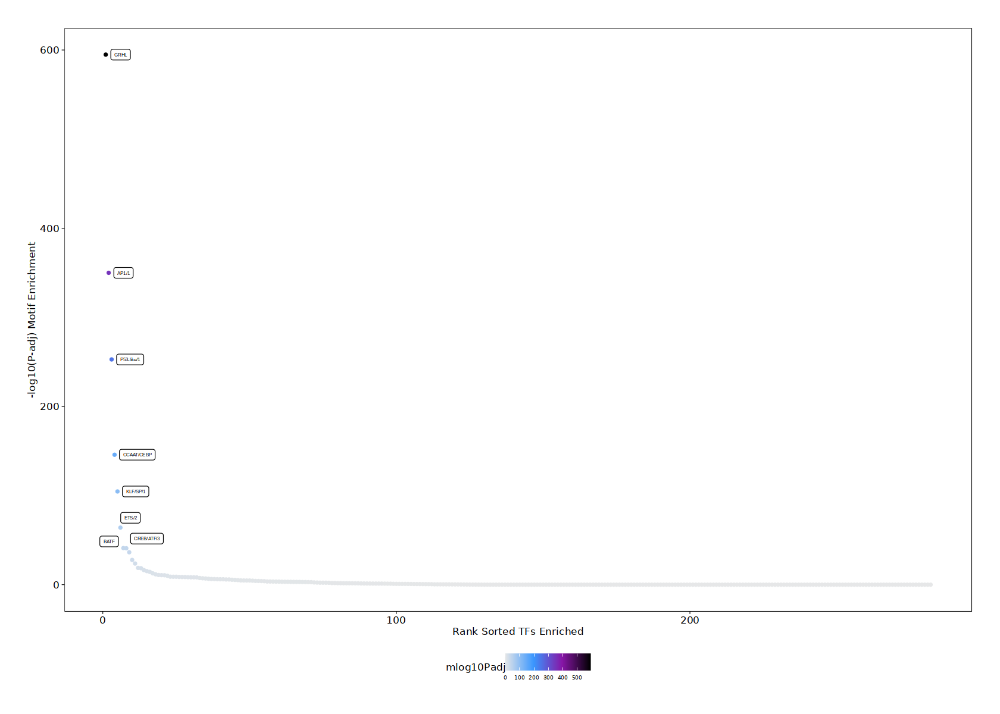

In [98]:
ggUp <- ggplot(df, aes(rank, mlog10Padj, color = mlog10Padj)) + 
  geom_point(size = 1) +
  ggrepel::geom_label_repel(
        data = df[rev(seq_len(30)), ], aes(x = rank, y = mlog10Padj, label = TF), 
        size = 1.5,
        nudge_x = 2,
        color = "black"
  ) + theme_ArchR() + 
  ylab("-log10(P-adj) Motif Enrichment") + 
  xlab("Rank Sorted TFs Enriched") +
  scale_color_gradientn(colors = paletteContinuous(set = "comet"))

ggUp

In [99]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = Aoib_w15_proj_multiome,
    peakAnnotation = "Motif",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  )

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-2614229798da9-Date-2023-09-08_Time-12-35-12.log
If there is an issue, please report to github with logFile!

2023-09-08 12:35:20 : Computing Enrichments 1 of 9, 0.14 mins elapsed.

2023-09-08 12:35:20 : Computing Enrichments 2 of 9, 0.142 mins elapsed.

2023-09-08 12:35:20 : Computing Enrichments 3 of 9, 0.144 mins elapsed.

2023-09-08 12:35:20 : Computing Enrichments 4 of 9, 0.146 mins elapsed.

2023-09-08 12:35:21 : Computing Enrichments 5 of 9, 0.148 mins elapsed.

2023-09-08 12:35:21 : Computing Enrichments 6 of 9, 0.15 mins elapsed.

2023-09-08 12:35:21 : Computing Enrichments 7 of 9, 0.153 mins elapsed.

2023-09-08 12:35:21 : Computing Enrichments 8 of 9, 0.154 mins elapsed.

2023-09-08 12:35:21 : Computing Enrichments 9 of 9, 0.156 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-peakAnnoEnrichment-2614229798da9-Date-2023-09-08_Time-12-35-12.log



In [100]:
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = 10, transpose = TRUE)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-261425da1274c-Date-2023-09-08_Time-12-35-21.log
If there is an issue, please report to github with logFile!

Adding Annotations..

Preparing Main Heatmap..



In [101]:
library(pheatmap)


Attaching package: ‘pheatmap’


The following object is masked from ‘package:ComplexHeatmap’:

    pheatmap




In [102]:
heatmapEM_MM <- plotEnrichHeatmap(enrichMotifs, n = 20, transpose = TRUE, returnMatrix=TRUE)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-261426f77305-Date-2023-09-08_Time-12-35-22.log
If there is an issue, please report to github with logFile!



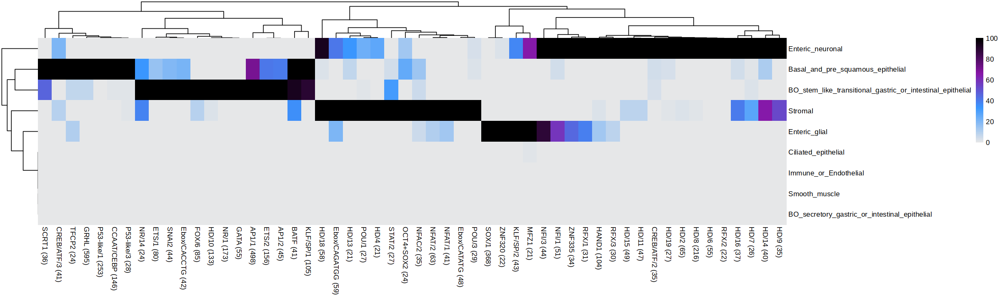

In [103]:
options(repr.plot.width=20, repr.plot.height=6)
pheatmap(heatmapEM_MM, color=paletteContinuous(set = "comet", n=100))

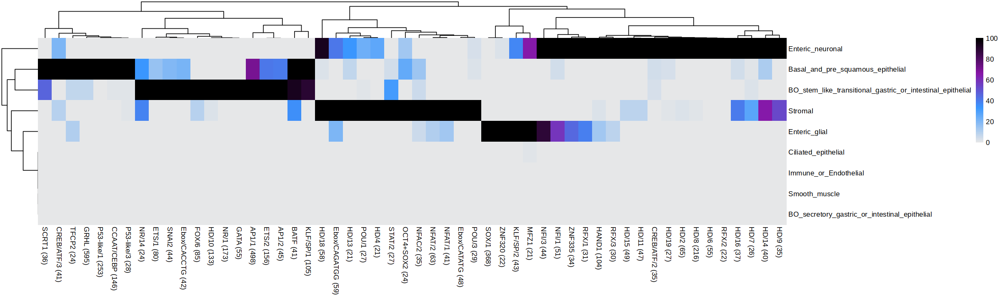

In [104]:
options(repr.plot.width=20, repr.plot.height=6)
p1 <- pheatmap(heatmapEM_MM, color=paletteContinuous(set = "comet", n=100))

In [105]:
png('multiome_15W/Plots/Gastric-Motifs-Enriched-Marker-Heatmap_viestra.png', width=2000, height=600, res=100)
p1
dev.off()

png 
  2

In [68]:
heatmapEMLarge <- plotEnrichHeatmap(enrichMotifs, n = 200, transpose = FALSE)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-2614e667b55f6-Date-2023-09-08_Time-11-33-48.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

